# QF 634 Quant Research Methods
## Hack The Market | YU LINGFENG
#### ML on `HSI` with other feature inputs
#### trading account started from `$100,000`
#### trading period from `November 2013` through `October 2023`.
#### training period from `November 2001` through `October 2013`.

> For `input features` (`predictors`; `Xs`), we use (The variables used as predictors are as follows) ...

> `endogenous` data

* lagged log returns;

> `Correlated assets`

* lagged log returns of stocks 
1. '0005.HK' for HSBC, 
2. "0001.HK" for CK Hutchison Holdings Limited, 
3. "0293.HK" for Cathay Pacific Airways Limited, 
4. "0003.HK" for The Hong Kong and China Gas Company Limited);
* currency exchange rates (USD/JPY and GBP/USD);
* indices (VIX, JP225, T-bill, SPX, Shanghai Composite Index);

> `Technical indicators`

* 21-day, 63-day, and 252-day moving averages;
* 10-day, 30-day, and 200-day exponential moving averages;


## 👉 <a id = "top">Content Table</a> 👈 

## [Part 1. Supervised Machine Learning](#p1)

> ### <font color = red> Feature Engineering </font>
> ### <font color = red> Model Training and Testing </font>
> ### <font color = red> Model Selection </font>

## [Part 2. Back Testing](#p2)

> ### <font color = red> Feature Choices </font>
> ### <font color = red> Result Visualization </font>
> ### <font color = red> Performance Metrics </font>

## [Part 3. Rolling Model (ML)](#p3)

> ### <font color = red> Fixed training set </font>
> ### <font color = red> Fixed testing set </font>

## [Part 4. Top Strategy (ML)](#p4)

> ### <font color = red> Choice by overall assessment </font>
> ### <font color = red> Choice by Best Return </font>
> ### <font color = red> Choice by Least Drawdown </font>

## [Part 5. Self-Critique (ML)](#p5)

> ### <font color = red> Goal and Method </font>
> ### <font color = red> Survivorship Bias </font>
> ### <font color = red> Future improvement </font>

In [658]:
from pandas_datareader import data as pdr
import yfinance as yf
(
    yf
    .pdr_override()
)
import datetime
import warnings
warnings.filterwarnings("ignore")

In [659]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [660]:
# Loading Algorithm

from sklearn.linear_model import LinearRegression

# Regularization
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet

# Decision Tree
from sklearn.tree import DecisionTreeRegressor

# ENSEMBLE

## Bagging (Bootstrapped Aggregation)
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor

## Boosting
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

# Support Vector Machine
from sklearn.svm import SVR

# K-Nearest Neighbor
from sklearn.neighbors import KNeighborsRegressor

# Multi-layer Perceptron (Neural Networks)
from sklearn.neural_network import MLPRegressor

In [661]:
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.ensemble import AdaBoostRegressor
# from sklearn.svm import SVR


# for assessment
from sklearn.metrics import mean_squared_error

In [662]:
## Classification Methods

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [663]:
def cal_Sharpe_lg_Rtn(Strategy, Capital):
    portfolio =\
    (
    pd
    .DataFrame(index = Strategy.index)
    .fillna(0.0)
    )
    portfolio_change =\
    (
    pd
    .DataFrame(index = Strategy.index)
    .fillna(0.0)
    )
    portfolio_sortino =\
    (
    pd
    .DataFrame(index = Strategy.index)
    .fillna(0.0)
    )
    
    Sharpe = []
    CAGR = []
    Sortino = []
    for col in Strategy:
        portfolio[col] = np.exp(Strategy[col].cumsum()) * Capital
        portfolio_change[f"{col} Rtn"] = portfolio[col].pct_change()
        portfolio_change[f"{col} Rtn"].fillna(0, inplace=True)
        
        portfolio_sortino[f"{col} Rtn"] =\
            np.where(portfolio_change[f"{col} Rtn"] < 0,
                     portfolio_change[f"{col} Rtn"], 0)
        
        Sharpe += [np.sqrt(252) *\
                   portfolio_change[f"{col} Rtn"].mean() / \
                   portfolio_change[f"{col} Rtn"].std()]
        Sortino += [np.sqrt(252) *\
                    portfolio_change[f"{col} Rtn"].mean()/\
                    (((portfolio_sortino[f"{col} Rtn"]**2).sum()/\
                   len(portfolio_sortino[f"{col} Rtn"]))**0.5)]

        CAGR += [((portfolio[col][-1] / Capital)**\
                (365/(Strategy.index[-1] -\
                    Strategy.index[0]).days) - 1)*100]

    return [portfolio, portfolio_change, CAGR, Sharpe, Sortino]

In [664]:
def cal_MDD(performs):
    MDD = \
    (
    pd
    .DataFrame(index = performs.index)
    .fillna(0.0)
    )
    strategy_name = performs.columns
    MDD['Max'] = performs[strategy_name].cummax()
    
    MDD['Drawdown'] =\
        performs[strategy_name].iloc[:, 0] - MDD['Max']
    MDD['DD%'] = MDD['Drawdown'] / MDD['Max'] * 100
    
    MDD = MDD.dropna()
    
    MDD['DD_Flag'] = 0
    DD = []
    flag = 0
    nDD = 1
    
    for idx in MDD.index:
        if MDD.loc[idx]['Drawdown'] == 0:
            # flag is to rememeber if in DrawDown period
            if flag == 0:
                continue
            else:
                # a DD period is just ended
                # clear flag, ready for next DD seriel number
                flag = 0
                nDD += 1
        # if Drawdown < 0, entering a DD period
        else:
            flag = 1
            MDD.loc[idx, 'DD_Flag'] = nDD
            
    grouped = MDD[MDD['DD_Flag'] != 0].groupby('DD_Flag')
    index_values = performs

    for flags, group in grouped:
        
        s_date = group.index.min()
        e_date = group.index.max()
        # like how we opened position on the next day, close is also shifted
        if len(MDD[e_date:].index) > 1:
            e_date = MDD[e_date:].index[1]
 
        
        days =\
            (e_date.to_pydatetime() - s_date.to_pydatetime()).days
        loss = group['Drawdown'].min()
        loss_pct = group['DD%'].min()

        DD += [[flags, s_date, e_date, days, loss, loss_pct]]
    DD = pd.DataFrame(DD)
    column_names =\
        ['S/N', 'DD_start', 'DD_end', 'Days', 'DD_Max', 'DD%']
    
    DD.columns = column_names
    return [MDD, DD]

In [665]:
def cal_performance_metrics(backtest_return_df, starting_amt=1e5):
    performance_test =\
        cal_Sharpe_lg_Rtn(backtest_return_df, starting_amt)
    
    DD_result = []
    for strategy in performance_test[0]:
        DD_result += [cal_MDD(performance_test[0][[strategy]])]
    

    performance_metrics =\
    (
        pd.DataFrame({'Features': list(performance_test[0].columns),
                      'CAGR%': performance_test[2],
                      'Sharpe Ratio': performance_test[3],
                      'Sortino Ratio': performance_test[-1],
                      'Max Drawdown%': 
                          [DD_result[i][1]\
                           .sort_values(by = 'DD%')\
                           .iloc[0, -1] for i in range(len(DD_result))],
                      'Max Drawdown$': 
                          [DD_result[i][1]\
                           .sort_values(by = 'DD_Max')\
                           .iloc[0, -2] for i in range(len(DD_result))],
                      'Max Drawdown (Days)': 
                          [DD_result[i][1]\
                           .sort_values(by = 'Days')\
                           .iloc[-1, -3] for i in range(len(DD_result))],
                      'Multiples of Invested Capital': 
                          performance_test[0].iloc[-1, :]/starting_amt
                     })
    )
    performance_metrics =\
        performance_metrics.set_index('Features', drop = True) 
    return performance_metrics

In [666]:
def select_model(models_all, feature_choice, 
                 Y, X, time_tags, starting_amt=1e5):
    #### split the data into train set and test set
    X_train, X_test =\
    (
    X[time_tags[0]:time_tags[1]], 
    X[time_tags[-2]:time_tags[-1]]
    )

    Y_train, Y_test =\
    (
    Y[time_tags[0]:time_tags[1]], 
    Y[time_tags[-2]:time_tags[-1]]
    )
   
    #### train before test, to decide on best model
    train_results = []
    test_results = []
    names = []
    cols = []
    
    backtest_signal = pd.DataFrame(Y_test)
    for name, model in models_all:

        names.append(name)

        res = model.fit(X_train, Y_train)

        predicted = res.predict(X_test)
        predicted = pd.DataFrame(predicted, index=Y_test.index)

        cols.append(name)
        backtest_signal[name] = np.sign(predicted)    


        train_result =\
            mean_squared_error(res.predict(X_train), Y_train)
        train_results.append(train_result)

        test_result =\
            mean_squared_error(res.predict(X_test), Y_test)
        test_results.append(test_result)


    backtest_return = backtest_signal[['return']]    
    for col in cols:
        backtest_return[f"return_{col}"] =\
            backtest_return["return"]*backtest_signal[col]
    backtest_return =\
        backtest_return.rename(columns={'return': 'Asset return'})
    plt.figure(figsize=[15,15])

    closing_amt = []
    for name in backtest_return.columns:
        plt.plot(np.exp(backtest_return[f"{name}"].cumsum()),
                 label = f"{name}")
        # Add labels on the plot
        final_factor =\
            np.exp(backtest_return[f"{name}"].cumsum()).iloc[-1]
        closing_amt += [final_factor * starting_amt]
        plt.text(backtest_return.index[-1], final_factor,
                 f"{name}", ha='right', va='center')
    plt.legend()
    plt.show()    

    fig = plt.figure(figsize = [8, 4])

    ind = np.arange(len(names)
                   )
    width = 0.30
    fig.suptitle\
        ("Comparing the Perfomance of Various Algorithms\
on the Training vs. Testing")

    ax = fig.add_subplot(111)

    (plt
     .bar(ind - width/2,
          train_results,
          width = width,
          label = "Errors in Training Set")
    )

    (plt
     .bar(ind + width/2,
          test_results,
          width = width,
          label = "Errors in Testing Set")
    )
    plt.legend()
    ax.set_xticks(ind)
    ax.set_xticklabels(names)
    plt.ylabel("Mean Squared Error (MSE)")
    plt.show() 
    
    backtest_return_performance =\
        cal_performance_metrics(backtest_return, starting_amt)
    
    signs = np.sign(backtest_return)

    # Count positive and negative values for each column
    positive_counts = (signs > 0).sum()
    negative_counts = (signs <= 0).sum()

    # Combine positive and negative counts into a DataFrame
    Accuracy = pd.DataFrame({
        'Win': positive_counts,
        'Loss': negative_counts
    })
    Accuracy['Win%'] = Accuracy['Win']/Accuracy.sum(axis = 1)*100
    backtest_return_performance =\
        pd.concat([backtest_return_performance, Accuracy], axis = 1)
    return backtest_return_performance

In [667]:
def select_model_binary(models_all, feature_choice, 
                 Y, X, time_tags, starting_amt=1e5):
    #### split the data into train set and test set
    X_train, X_test =\
    (
    X[time_tags[0]:time_tags[1]], 
    X[time_tags[-2]:time_tags[-1]]
    )

    Y_train, Y_test =\
    (
    Y[time_tags[0]:time_tags[1]], 
    Y[time_tags[-2]:time_tags[-1]]
    )
   
    #### train before test, to decide on best model
    train_results = []
    test_results = []
    names = []
    cols = []
    
    backtest_signal = pd.DataFrame(Y_test)
    for name, model in models_all:

        names.append(name)

        res = model.fit(X_train, Y_train['return_binary'])

        predicted = res.predict(X_test)
        predicted = pd.DataFrame(predicted, index=Y_test.index)

        cols.append(name)
        backtest_signal[name] = np.sign(predicted)    


        train_result =\
            mean_squared_error(res.predict(X_train), Y_train['return_binary'])
        train_results.append(train_result)

        test_result =\
            mean_squared_error(res.predict(X_test), Y_test['return_binary'])
        test_results.append(test_result)


    backtest_return = backtest_signal[['return']]    
    for col in cols:
        backtest_return[f"return_{col}"] =\
            backtest_return["return"]*backtest_signal[col]
    backtest_return =\
        backtest_return.rename(columns={'return': 'Asset return'})
    plt.figure(figsize=[15,15])

    closing_amt = []
    for name in backtest_return.columns:
        plt.plot(np.exp(backtest_return[f"{name}"].cumsum()),
                 label = f"{name}")
        # Add labels on the plot
        final_factor =\
            np.exp(backtest_return[f"{name}"].cumsum()).iloc[-1]
        closing_amt += [final_factor * starting_amt]
        plt.text(backtest_return.index[-1], final_factor,
                 f"{name}", ha='right', va='center')
    plt.legend()
    plt.show()    

    fig = plt.figure(figsize = [8, 4])

    ind = np.arange(len(names)
                   )
    width = 0.30
    fig.suptitle\
        ("Comparing the Perfomance of Various Algorithms\
on the Training vs. Testing")

    ax = fig.add_subplot(111)

    (plt
     .bar(ind - width/2,
          train_results,
          width = width,
          label = "Errors in Training Set")
    )

    (plt
     .bar(ind + width/2,
          test_results,
          width = width,
          label = "Errors in Testing Set")
    )
    plt.legend()
    ax.set_xticks(ind)
    ax.set_xticklabels(names)
    plt.ylabel("Mean Squared Error (MSE)")
    plt.show() 
    
    backtest_return_performance =\
        cal_performance_metrics(backtest_return, starting_amt)
    
    signs = np.sign(backtest_return)

    # Count positive and negative values for each column
    positive_counts = (signs > 0).sum()
    negative_counts = (signs <= 0).sum()

    # Combine positive and negative counts into a DataFrame
    Accuracy = pd.DataFrame({
        'Win': positive_counts,
        'Loss': negative_counts
    })
    Accuracy['Win%'] = Accuracy['Win']/Accuracy.sum(axis = 1)*100
    backtest_return_performance =\
        pd.concat([backtest_return_performance, Accuracy], axis = 1)
    return backtest_return_performance

In [668]:
def select_feature(model_choice, features_dict,
                   Y, X, time_tags, starting_amt=1e5, threshold=0):
    #### split the data into train set and test set
    X_train, X_test =\
    (
    X[time_tags[0]:time_tags[1]], 
    X[time_tags[-2]:time_tags[-1]]
    )

    Y_train, Y_test =\
    (
    Y[time_tags[0]:time_tags[1]], 
    Y[time_tags[-2]:time_tags[-1]]
    )
   
    #### train before test, to decide on best features
    
    
    
    backtest_signal = pd.DataFrame(Y_test)
    backtest_return = backtest_signal[['return']]
    backtest_return =\
        backtest_return.rename(columns={'return': 'Asset return'})
    cols = []
    for key, X_choice in features_dict.items():

        res = model_choice[1].fit(X_train[X_choice], Y_train)
        predicted = res.predict(X_test[X_choice])

        predicted = pd.DataFrame(predicted, index=Y_test.index)

        cols.append(key)
#         backtest_signal[key] = np.sign(predicted)
        backtest_signal[key] = np.where(abs(predicted) > threshold, np.sign(predicted), 0)

    for col in cols:
        backtest_return[f"{model_choice[0]}_{col}"] =\
            backtest_return["Asset return"]*backtest_signal[col]

    plt.figure(figsize=[15,15])

    closing_amt = []
    for name in backtest_return.columns:
        plt.plot(np.exp(backtest_return[f"{name}"].cumsum()),
                 label = f"{name}")
        # Add labels on the plot
        final_factor =\
            np.exp(backtest_return[f"{name}"].cumsum()).iloc[-1]
        closing_amt += [final_factor * starting_amt]
        plt.text(backtest_return.index[-1],
                 final_factor, f"{name}", ha='right', va='center')
    plt.legend()
    plt.show()    
       
    backtest_return_performance =\
        cal_performance_metrics(backtest_return, starting_amt)

    
    signs = np.sign(backtest_return)

    # Count positive and negative values for each column
    positive_counts = (signs > 0).sum()
    negative_counts = (signs < 0).sum()

    # Combine positive and negative counts into a DataFrame
    Accuracy = pd.DataFrame({
        'Win': positive_counts,
        'Loss': negative_counts
    })
    Accuracy['Win%'] = Accuracy['Win']/Accuracy.sum(axis = 1)*100
    
    backtest_return_performance =\
        pd.concat([backtest_return_performance, Accuracy], axis = 1)
    return backtest_return_performance

## <a id = "p1">1. </a> <font color = "green"> Supervised Machine Learning </font>  [back to table of contents](#top)

Classifier: predict tomorrow’s UP or DOWN (market movement) from the market condition of the past few days (including today).
The machine learning algorithms of choice are 
* `KNeighborsClassifier (KNN)`,
* `Support Vector Machine Classifier (SVR)`,
* `Logistic Regressor (LogiR)`, 
* `DecisionTree Classifier (DT)`,
* `RandomForestClassifier (RFR)`,


Regressor: predict tomorrow’s HSI level (market movement) from the market condition of the past few days (including today).
The machine learning algorithms of choice are 
* `LinearRegression (LR)`, 
* `Least Absolute Shrinkage and Selection Operator (LASSO)`, 
* `ElasticNet (EN)`, 
* `DecisionTreeRegressor (CART)`,
* `KNeighborsRegressor (KNN)`,
* `Support Vector Machine (SVR)`,
* `RandomForestRegressor (RFR)`,
* `ExtraTreesRegressor (ETR)`,
* `GradientBoostingRegressor (GBR)`,
* `AdaBoostRegressor (ABR)`


In [669]:
start = '2001-11-01'
end = '2023-11-01'

train1 = '2011-11-01'
train2 = '2018-11-01'
test = '2013-11-01'

In [670]:
stock_ticker = ['0005.HK', "0001.HK", "0293.HK", '0003.HK']
currency_ticker = ["DEXJPUS", "DEXUSUK"]
index_ticker = ["^VIX",'^N225', '^TNX', '^SPX', '000001.SS']

# hsi = pdr.get_data_yahoo('^HSI', start, end)
# stock_data = yf.download(stock_ticker, start, end)
# currency_data = pdr.get_data_fred(currency_ticker, start, end)
# index_data = yf.download(index_ticker, start, end)

In [671]:
# Check if the file exists
target_file_path = 'hsi.csv'
try:
    # Try to read the file
    hsi = pd.read_csv(target_file_path, header=0, index_col=0)
except FileNotFoundError:
    # If the file doesn't exist, download data
    hsi = pdr.get_data_yahoo('^HSI', start, end)

    # Save the DataFrame to a CSV file
    hsi.to_csv(target_file_path, index = True)

hsi.index = pd.to_datetime(hsi.index)
hsi

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2001-11-01,10110.919922,10189.559570,10107.089844,10158.849609,10158.849609,203404400
2001-11-02,10238.099609,10333.879883,10097.639648,10186.059570,10186.059570,251110800
2001-11-05,10202.299805,10434.780273,10165.509766,10430.719727,10430.719727,244442600
2001-11-06,10528.169922,10556.719727,10303.059570,10356.049805,10356.049805,265733600
2001-11-07,10419.240234,10454.690430,10216.509766,10269.790039,10269.790039,257144400
...,...,...,...,...,...,...
2023-10-25,17465.429688,17465.820312,17001.429688,17085.330078,17085.330078,2499934100
2023-10-26,17085.119141,17174.080078,16917.220703,17044.609375,17044.609375,1967215900
2023-10-27,17160.230469,17497.720703,17078.240234,17398.730469,17398.730469,2452090300


In [672]:
# Check if the file exists
stock_file_path = 'stock_data.csv'
try:
    # Try to read the file
    stock_data = pd.read_csv(stock_file_path, header=[0, 1], index_col=0)
except FileNotFoundError:
    # If the file doesn't exist, download data
    stock_data = yf.download(stock_ticker, start, end)

    # Save the DataFrame to a CSV file
    stock_data.to_csv(stock_file_path, index = True)
    
stock_data.index = pd.to_datetime(stock_data.index)
stock_data

Adj Close                                     Close            \
              0001.HK   0003.HK    0005.HK   0293.HK    0001.HK   0003.HK   
Date                                                                        
2001-11-01  18.722595  1.637062  41.571850  5.117990  47.528755  2.803373   
2001-11-02  18.581821  1.628623  42.301155  5.084971  47.171394  2.788922   
2001-11-05  19.144909  1.637062  42.787388  5.084971  48.600834  2.803373   
2001-11-06  19.074530  1.637062  42.908951  5.018933  48.422153  2.803373   
2001-11-07  18.863361  1.620184  43.273605  5.018933  47.886112  2.774472   
...               ...       ...        ...       ...        ...       ...   
2023-10-25  39.250000  5.470000  58.349747  7.850000  39.250000  5.470000   
2023-10-26  38.900002  5.460000  57.002060  7.840000  38.900002  5.460000   
2023-10-27  39.650002  5.480000  57.950428  7.900000  39.650002  5.480000   
2023-10-30  39.849998  5.590000  57.101891  7.840000  39.849998  5.590000   
2023-10-31  39.549999  5.450000  56.053692  7.860000  39.549999  5.450000   

                                    High            ...        Low          \
              0005.HK 0293.HK    0001.HK   0003.HK  ...    0005.HK 0293.HK   
Date                                                ...                      
2001-11-01  85.500000    7.75  47.707436  2.832273  ...  85.000000    7.75   
2001-11-02  87.000000    7.70  48.243473  2.817823  ...  86.000000    7.55   
2001-11-05  88.000000    7.70  48.600834  2.832273  ...  86.500000    7.50   
2001-11-06  88.250000    7.60  49.315552  2.832273  ...  87.750000    7.50   
2001-11-07  89.000000    7.60  49.136871  2.788922  ...  88.500000    7.50   
...               ...     ...        ...       ...  ...        ...     ...   
2023-10-25  58.450001    7.85  39.950001  5.650000  ...  58.200001    7.74   
2023-10-26  57.099998    7.84  39.200001  5.540000  ...  56.599998    7.80   
2023-10-27  58.049999    7.90  39.799999  5.580000  ...  57.799999    7.74   
2023-10-30  57.200001    7.84  39.900002  5.600000  ...  56.799999    7.77   
2023-10-31  56.150002    7.86  40.150002  5.600000  ...  55.500000    7.81   

                 Open                                  Volume            \
              0001.HK   0003.HK    0005.HK 0293.HK    0001.HK   0003.HK   
Date                                                                      
2001-11-01  47.350075  2.817823  85.750000    7.90  2197631.0  11441853   
2001-11-02  47.886112  2.803373  87.000000    8.00  2344343.0  13495948   
2001-11-05  47.350075  2.803373  87.000000    7.75  4768090.0  22122993   
2001-11-06  48.958191  2.817823  89.000000    7.70  4171848.0  19727595   
2001-11-07  48.958191  2.788922  89.000000    7.50  3555947.0  28790473   
...               ...       ...        ...     ...        ...       ...   
2023-10-25  39.849998  5.650000  59.250000    7.74  4467105.0   8591100   
2023-10-26  39.200001  5.510000  58.200001    7.88  6598152.0  15150627   
2023-10-27  39.049999  5.530000  58.200001    7.84  3626479.0  17018695   
2023-10-30  39.599998  5.450000  57.349998    7.90  2628821.0  11825164   
2023-10-31  39.849998  5.600000  56.299999    7.85  4675179.0  12452707   

                                 
             0005.HK    0293.HK  
Date                             
2001-11-01   4105690  1884247.0  
2001-11-02   7357063  2661000.0  
2001-11-05   7836251  3263393.0  
2001-11-06   7532121  2212000.0  
2001-11-07   9861164  3770000.0  
...              ...        ...  
2023-10-25  16606417  2695280.0  
2023-10-26  25151693  2399930.0  
2023-10-27  14679632  3569636.0  
2023-10-30  27716476  1831209.0  
2023-10-31  31013853  1835520.0  

[5472 rows x 24 columns]

In [673]:
# Check if the file exists
currency_file_path = 'currency_data.csv'
try:
    # Try to read the file
    currency_data = pd.read_csv(currency_file_path, header=0, index_col=0)
except FileNotFoundError:
    # If the file doesn't exist, download data
    currency_data = pdr.get_data_fred(currency_ticker, start, end)

    # Save the DataFrame to a CSV file
    currency_data.to_csv(currency_file_path, index = True)
    
currency_data.index = pd.to_datetime(currency_data.index)
currency_data

,DEXJPUS,DEXUSUK
DATE,,
2001-11-01,121.87,1.4620
2001-11-02,121.68,1.4615
2001-11-05,121.72,1.4570
2001-11-06,121.15,1.4591
2001-11-07,121.05,1.4650
...,...,...
2023-10-26,150.44,1.2113
2023-10-27,149.60,1.2151
2023-10-30,149.01,1.2157


In [674]:
# Check if the file exists
index_file_path = 'index_data.csv'
try:
    # Try to read the file
    index_data = pd.read_csv(index_file_path, header=[0, 1], index_col=0)
except FileNotFoundError:
    # If the file doesn't exist, download data
    index_data = yf.download(index_ticker, start, end)

    # Save the DataFrame to a CSV file
    index_data.to_csv(index_file_path, index = True)
    
index_data.index = pd.to_datetime(index_data.index)
index_data

Adj Close                                               \
              000001.SS         ^N225         ^SPX   ^TNX       ^VIX   
Date                                                                   
2001-11-01  1707.754028  10347.280273  1084.099976  4.217  32.310001   
2001-11-02  1691.350952  10383.780273  1087.199951  4.346  30.709999   
2001-11-05  1679.572021  10447.540039  1102.839966  4.296  30.500000   
2001-11-06  1671.277954  10633.719727  1118.859985  4.269  28.799999   
2001-11-07  1594.050049  10284.980469  1115.800049  4.201  29.129999   
...                 ...           ...          ...    ...        ...   
2023-10-25  2974.114014  31269.919922  4186.770020  4.953  20.190001   
2023-10-26  2988.299072  30601.779297  4137.229980  4.845  20.680000   
2023-10-27  3017.783936  30991.689453  4117.370117  4.845  21.270000   
2023-10-30  3021.552979  30696.960938  4166.819824  4.875  19.750000   
2023-10-31  3018.770996  30858.849609  4193.799805  4.875  18.139999   

                  Close                                               ...  \
              000001.SS         ^N225         ^SPX   ^TNX       ^VIX  ...   
Date                                                                  ...   
2001-11-01  1707.754028  10347.280273  1084.099976  4.217  32.310001  ...   
2001-11-02  1691.350952  10383.780273  1087.199951  4.346  30.709999  ...   
2001-11-05  1679.572021  10447.540039  1102.839966  4.296  30.500000  ...   
2001-11-06  1671.277954  10633.719727  1118.859985  4.269  28.799999  ...   
2001-11-07  1594.050049  10284.980469  1115.800049  4.201  29.129999  ...   
...                 ...           ...          ...    ...        ...  ...   
2023-10-25  2974.114014  31269.919922  4186.770020  4.953  20.190001  ...   
2023-10-26  2988.299072  30601.779297  4137.229980  4.845  20.680000  ...   
2023-10-27  3017.783936  30991.689453  4117.370117  4.845  21.270000  ...   
2023-10-30  3021.552979  30696.960938  4166.819824  4.875  19.750000  ...   
2023-10-31  3018.770996  30858.849609  4193.799805  4.875  18.139999  ...   

                   Open                                               \
              000001.SS         ^N225         ^SPX   ^TNX       ^VIX   
Date                                                                   
2001-11-01  1692.350952  10430.589844  1059.780029  4.217  33.970001   
2001-11-02  1703.923950  10460.610352  1084.099976  4.258  32.450001   
2001-11-05  1687.839966  10427.349609  1087.199951  4.342  31.139999   
2001-11-06  1678.172974  10518.019531  1102.839966  4.304  30.639999   
2001-11-07  1669.427002  10607.349609  1118.859985  4.231  29.410000   
...                 ...           ...          ...    ...        ...   
2023-10-25  2986.406982  31302.509766  4232.419922  4.851  19.389999   
2023-10-26  2960.104004  30902.919922  4175.990234  4.964  21.780001   
2023-10-27  2978.403076  30713.789062  4152.930176  4.866  20.389999   
2023-10-30  3009.610107  30663.480469  4139.390137  4.896  21.129999   
2023-10-31  3019.645996  30694.960938  4171.330078  4.810  19.860001   

              Volume                                       
           000001.SS        ^N225          ^SPX ^TNX ^VIX  
Date                                                       
2001-11-01       0.0          0.0  1.317400e+09  0.0  0.0  
2001-11-02       0.0          0.0  1.121900e+09  0.0  0.0  
2001-11-05       0.0          0.0  1.267700e+09  0.0  0.0  
2001-11-06       0.0          0.0  1.356000e+09  0.0  0.0  
2001-11-07       0.0          0.0  1.411300e+09  0.0  0.0  
...              ...          ...           ...  ...  ...  
2023-10-25  332400.0   78700000.0  3.869370e+09  0.0  0.0  
2023-10-26  291800.0   85600000.0  4.277640e+09  0.0  0.0  
2023-10-27  321800.0   89100000.0  4.019500e+09  0.0  0.0  
2023-10-30  360600.0  187000000.0  3.911140e+09  0.0  0.0  
2023-10-31  319900.0  134300000.0  4.249470e+09  0.0  0.0  

[5719 rows x 30 columns]

In [675]:
target = hsi.copy()

In [676]:
target[test:]

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2013-11-01,23208.800781,23336.980469,23149.529297,23249.789062,23249.789062,1244395900
2013-11-04,23322.070312,23345.929688,23165.060547,23189.619141,23189.619141,1033387800
2013-11-05,23313.609375,23313.609375,22949.419922,23038.949219,23038.949219,1194252900
2013-11-06,23042.109375,23119.039062,22954.699219,23036.939453,23036.939453,1299946400
2013-11-07,23023.730469,23023.730469,22819.650391,22881.029297,22881.029297,1084952200
...,...,...,...,...,...,...
2023-10-25,17465.429688,17465.820312,17001.429688,17085.330078,17085.330078,2499934100
2023-10-26,17085.119141,17174.080078,16917.220703,17044.609375,17044.609375,1967215900
2023-10-27,17160.230469,17497.720703,17078.240234,17398.730469,17398.730469,2452090300


In [677]:
target["return"] = np.log(target["Adj Close"]/target["Adj Close"].shift(1))
target['return_binary'] = np.sign(target["return"])

In [678]:
target

,Open,High,Low,Close,Adj Close,Volume,return,return_binary
Date,,,,,,,,
2001-11-01,10110.919922,10189.559570,10107.089844,10158.849609,10158.849609,203404400,NaN,NaN
2001-11-02,10238.099609,10333.879883,10097.639648,10186.059570,10186.059570,251110800,0.002675,1.0
2001-11-05,10202.299805,10434.780273,10165.509766,10430.719727,10430.719727,244442600,0.023735,1.0
2001-11-06,10528.169922,10556.719727,10303.059570,10356.049805,10356.049805,265733600,-0.007184,-1.0
2001-11-07,10419.240234,10454.690430,10216.509766,10269.790039,10269.790039,257144400,-0.008364,-1.0
...,...,...,...,...,...,...,...,...
2023-10-25,17465.429688,17465.820312,17001.429688,17085.330078,17085.330078,2499934100,0.005505,1.0
2023-10-26,17085.119141,17174.080078,16917.220703,17044.609375,17044.609375,1967215900,-0.002386,-1.0
2023-10-27,17160.230469,17497.720703,17078.240234,17398.730469,17398.730469,2452090300,0.020563,1.0


In [679]:
lags = 7
return_period = 1
cols = []
for lag in range(1, lags+1):
    col = f"lag_{lag}"
    target[col] = target["return"].shift(lag)
    cols.append(col)
#     col = f"lg_volm_{lag}"
#     target[col] = target["lg_volm"].shift(lag)
#     cols.append(col)

Y = target[["return", "return_binary"]]
Y_binary = target[["return_binary"]]
X0 = target[cols]

In [680]:
X0

,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7
Date,,,,,,,
2001-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-11-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-11-05,0.002675,NaN,NaN,NaN,NaN,NaN,NaN
2001-11-06,0.023735,0.002675,NaN,NaN,NaN,NaN,NaN
2001-11-07,-0.007184,0.023735,0.002675,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2023-10-25,-0.010573,-0.007181,-0.024931,-0.002299,0.007510,-0.009764,-0.023565
2023-10-26,0.005505,-0.010573,-0.007181,-0.024931,-0.002299,0.007510,-0.009764
2023-10-27,-0.002386,0.005505,-0.010573,-0.007181,-0.024931,-0.002299,0.007510


In [681]:
X1 =\
    (
    pd
    .concat([np
             .log(stock_data.loc[ : , ("Adj Close", stock_ticker)
                                ]
                 )
             .diff(i) for i in [return_period, 
                                return_period * 3, 
                                return_period * 6, 
                                return_period * 12]
            ],
           axis = 1
           )
    .dropna()
).shift(1)
X1.columns =\
    (X1
     .columns
     .droplevel()
    )
X1.columns = \
    stock_ticker +\
    [item + '_3DT' for item in stock_ticker] +\
    [item + '_6DT' for item in stock_ticker] +\
    [item + '_12DT' for item in stock_ticker]

X1

,0005.HK,0001.HK,0293.HK,0003.HK,0005.HK_3DT,0001.HK_3DT,0293.HK_3DT,0003.HK_3DT,0005.HK_6DT,0001.HK_6DT,0293.HK_6DT,0003.HK_6DT,0005.HK_12DT,0001.HK_12DT,0293.HK_12DT,0003.HK_12DT
Date,,,,,,,,,,,,,,,,
2001-11-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-11-21,0.002699,-0.006452,0.021859,-0.010526,0.008119,-0.003231,0.044206,-0.015748,0.038466,0.094987,0.132759,-0.015748,0.064000,0.157392,0.183403,-0.020943
2001-11-22,0.005376,-0.016313,0.016086,-0.005305,0.018945,-0.035545,0.054659,-0.015832,0.041045,0.061036,0.142692,-0.031417,0.057947,0.111226,0.199489,-0.031417
2001-11-23,0.008010,0.009820,-0.016086,0.010582,0.016086,-0.012945,0.021859,-0.005249,0.032435,0.029754,0.096392,-0.015666,0.063121,0.124729,0.196475,-0.020835
2001-11-26,0.002656,0.019355,-0.016349,-0.010582,0.016043,0.012862,-0.016349,-0.005305,0.024162,0.009631,0.027857,-0.021053,0.057314,0.155217,0.180126,-0.021053
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-25,-0.020271,-0.010127,0.001296,-0.014626,-0.060424,-0.039906,-0.015425,-0.036170,-0.064432,-0.037458,-0.031870,-0.030827,-0.039319,-0.030077,-0.036876,0.014843
2023-10-26,-0.002563,-0.001273,0.016699,0.007339,-0.038595,-0.016425,0.014112,-0.005470,-0.055732,-0.032584,-0.011400,-0.019910,-0.059769,-0.042400,-0.049700,-0.009099
2023-10-27,-0.023368,-0.008957,-0.001275,-0.001830,-0.046201,-0.020357,0.016721,-0.009116,-0.079908,-0.046462,-0.010152,-0.034207,-0.082330,-0.047688,-0.042453,-0.003656


In [682]:
X1[stock_ticker[1]]

Date
2001-11-20         NaN
2001-11-21   -0.006452
2001-11-22   -0.016313
2001-11-23    0.009820
2001-11-26    0.019355
                ...   
2023-10-25   -0.010127
2023-10-26   -0.001273
2023-10-27   -0.008957
2023-10-30    0.019097
2023-10-31    0.005031
Name: 0001.HK, Length: 5206, dtype: float64

In [683]:
X2 =\
    (np
     .log(currency_data)
     .diff(return_period)
    ).shift(1)

X2

,DEXJPUS,DEXUSUK
DATE,,
2001-11-01,NaN,NaN
2001-11-02,NaN,NaN
2001-11-05,-0.001560,-0.000342
2001-11-06,0.000329,-0.003084
2001-11-07,-0.004694,0.001440
...,...,...
2023-10-26,0.000667,-0.002468
2023-10-27,0.003329,-0.002227
2023-10-30,-0.005599,0.003132


In [684]:
index_data

Adj Close                                               \
              000001.SS         ^N225         ^SPX   ^TNX       ^VIX   
Date                                                                   
2001-11-01  1707.754028  10347.280273  1084.099976  4.217  32.310001   
2001-11-02  1691.350952  10383.780273  1087.199951  4.346  30.709999   
2001-11-05  1679.572021  10447.540039  1102.839966  4.296  30.500000   
2001-11-06  1671.277954  10633.719727  1118.859985  4.269  28.799999   
2001-11-07  1594.050049  10284.980469  1115.800049  4.201  29.129999   
...                 ...           ...          ...    ...        ...   
2023-10-25  2974.114014  31269.919922  4186.770020  4.953  20.190001   
2023-10-26  2988.299072  30601.779297  4137.229980  4.845  20.680000   
2023-10-27  3017.783936  30991.689453  4117.370117  4.845  21.270000   
2023-10-30  3021.552979  30696.960938  4166.819824  4.875  19.750000   
2023-10-31  3018.770996  30858.849609  4193.799805  4.875  18.139999   

                  Close                                               ...  \
              000001.SS         ^N225         ^SPX   ^TNX       ^VIX  ...   
Date                                                                  ...   
2001-11-01  1707.754028  10347.280273  1084.099976  4.217  32.310001  ...   
2001-11-02  1691.350952  10383.780273  1087.199951  4.346  30.709999  ...   
2001-11-05  1679.572021  10447.540039  1102.839966  4.296  30.500000  ...   
2001-11-06  1671.277954  10633.719727  1118.859985  4.269  28.799999  ...   
2001-11-07  1594.050049  10284.980469  1115.800049  4.201  29.129999  ...   
...                 ...           ...          ...    ...        ...  ...   
2023-10-25  2974.114014  31269.919922  4186.770020  4.953  20.190001  ...   
2023-10-26  2988.299072  30601.779297  4137.229980  4.845  20.680000  ...   
2023-10-27  3017.783936  30991.689453  4117.370117  4.845  21.270000  ...   
2023-10-30  3021.552979  30696.960938  4166.819824  4.875  19.750000  ...   
2023-10-31  3018.770996  30858.849609  4193.799805  4.875  18.139999  ...   

                   Open                                               \
              000001.SS         ^N225         ^SPX   ^TNX       ^VIX   
Date                                                                   
2001-11-01  1692.350952  10430.589844  1059.780029  4.217  33.970001   
2001-11-02  1703.923950  10460.610352  1084.099976  4.258  32.450001   
2001-11-05  1687.839966  10427.349609  1087.199951  4.342  31.139999   
2001-11-06  1678.172974  10518.019531  1102.839966  4.304  30.639999   
2001-11-07  1669.427002  10607.349609  1118.859985  4.231  29.410000   
...                 ...           ...          ...    ...        ...   
2023-10-25  2986.406982  31302.509766  4232.419922  4.851  19.389999   
2023-10-26  2960.104004  30902.919922  4175.990234  4.964  21.780001   
2023-10-27  2978.403076  30713.789062  4152.930176  4.866  20.389999   
2023-10-30  3009.610107  30663.480469  4139.390137  4.896  21.129999   
2023-10-31  3019.645996  30694.960938  4171.330078  4.810  19.860001   

              Volume                                       
           000001.SS        ^N225          ^SPX ^TNX ^VIX  
Date                                                       
2001-11-01       0.0          0.0  1.317400e+09  0.0  0.0  
2001-11-02       0.0          0.0  1.121900e+09  0.0  0.0  
2001-11-05       0.0          0.0  1.267700e+09  0.0  0.0  
2001-11-06       0.0          0.0  1.356000e+09  0.0  0.0  
2001-11-07       0.0          0.0  1.411300e+09  0.0  0.0  
...              ...          ...           ...  ...  ...  
2023-10-25  332400.0   78700000.0  3.869370e+09  0.0  0.0  
2023-10-26  291800.0   85600000.0  4.277640e+09  0.0  0.0  
2023-10-27  321800.0   89100000.0  4.019500e+09  0.0  0.0  
2023-10-30  360600.0  187000000.0  3.911140e+09  0.0  0.0  
2023-10-31  319900.0  134300000.0  4.249470e+09  0.0  0.0  

[5719 rows x 30 columns]

In [685]:
X3 =\
    (
    pd
    .concat([np
             .log(index_data.loc[ : , ("Adj Close", index_ticker)
                                ]
                 )
             .diff(i) for i in [return_period, 
                                return_period * 3, 
                                return_period * 6, 
                                return_period * 12]
            ],
           axis = 1
           )
    .dropna()
).shift(1)
X3.columns =\
    (X3
     .columns
     .droplevel()
    )
X3.columns = \
    index_ticker +\
    [item + '_3DT' for item in index_ticker] +\
    [item + '_6DT' for item in index_ticker] +\
    [item + '_12DT' for item in index_ticker]

X3

,^VIX,^N225,^TNX,^SPX,000001.SS,^VIX_3DT,^N225_3DT,^TNX_3DT,^SPX_3DT,000001.SS_3DT,^VIX_6DT,^N225_6DT,^TNX_6DT,^SPX_6DT,000001.SS_6DT,^VIX_12DT,^N225_12DT,^TNX_12DT,^SPX_12DT,000001.SS_12DT
Date,,,,,,,,,,,,,,,,,,,,
2001-11-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-11-20,-0.024633,0.007377,-0.026762,0.010840,0.013949,-0.082367,0.061628,0.052002,0.008594,0.032124,-0.114963,0.048925,0.099165,0.027078,0.023960,-0.278338,0.036128,0.120283,0.059933,-0.022419
2001-11-21,-0.013998,-0.014300,0.023482,-0.007324,0.017710,-0.057987,0.008139,0.029386,0.000368,0.047215,-0.196251,0.047843,0.121023,0.021522,0.047307,-0.241547,0.018306,0.113633,0.049753,0.004943
2001-11-29,0.002898,0.008048,0.019726,-0.004939,0.003484,-0.035733,0.001125,0.016445,-0.001424,0.035143,-0.090073,0.060963,0.128309,-0.001810,0.054043,-0.231787,0.020233,0.144930,0.030531,0.015415
2001-12-04,-0.028193,0.002928,-0.039172,0.010297,-0.001560,0.056785,-0.037604,-0.050631,-0.014990,0.015364,0.040111,-0.000480,-0.043208,0.002784,0.015493,-0.049962,0.060483,0.085102,0.000974,0.069536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-09-28,-0.038756,0.001758,0.014809,0.000229,0.001624,0.057610,-0.000942,0.041489,-0.010600,-0.008050,0.255636,-0.026541,0.058074,-0.038874,-0.005662,0.277851,-0.002957,0.075872,-0.048617,-0.011348
2023-10-26,-0.049504,-0.015547,-0.006289,0.005876,0.001016,0.025702,-0.024977,0.012037,-0.008739,-0.001648,0.135676,-0.035484,0.055458,-0.023559,0.000613,0.197664,-0.027964,0.075196,-0.037029,-0.008511
2023-10-27,0.023980,-0.021598,-0.022046,-0.011903,0.004758,0.015104,-0.012915,0.001446,-0.019107,0.016536,0.073216,-0.045997,-0.012104,-0.041978,-0.023289,0.194191,-0.036725,0.040005,-0.052042,-0.028679


In [686]:
T1 =\
    (
    pd
    .concat([target.loc[ : , "Adj Close"]
             .rolling(window=i, min_periods = 1)
             .mean() for i in [21, 
                                63, 
                                252]
            ],
           axis = 1
           )

).shift(1)

T1.columns = ["HSI_MA21", "HSI_MA63", "HSI_MA252"]
T1

,HSI_MA21,HSI_MA63,HSI_MA252
Date,,,
2001-11-01,NaN,NaN,NaN
2001-11-02,10158.849609,10158.849609,10158.849609
2001-11-05,10172.454590,10172.454590,10172.454590
2001-11-06,10258.542969,10258.542969,10258.542969
2001-11-07,10282.919678,10282.919678,10282.919678
...,...,...,...
2023-10-25,17571.798456,18281.073010,19096.253763
2023-10-26,17525.507068,18255.948878,19099.016543
2023-10-27,17492.903274,18218.015687,19100.829718


In [687]:
T2 =\
    (
    pd
    .concat([target.loc[ : , "Adj Close"]
             .ewm(span=i, adjust=False)
             .mean() for i in [10, 
                                30, 
                                200]
            ],
           axis = 1
           )

).shift(1)

T2.columns = ["HSI_EMA10", "HSI_EMA30", "HSI_EMA200"]
T2

,HSI_EMA10,HSI_EMA30,HSI_EMA200
Date,,,
2001-11-01,NaN,NaN,NaN
2001-11-02,10158.849609,10158.849609,10158.849609
2001-11-05,10163.796875,10160.605091,10159.120355
2001-11-06,10212.328303,10178.031841,10161.822837
2001-11-07,10238.459485,10189.516871,10163.755443
...,...,...,...
2023-10-25,17460.068870,17732.582369,19012.560956
2023-10-26,17391.934544,17690.824157,18993.384530
2023-10-27,17328.784514,17649.132880,18973.993732


In [688]:
X=\
(
    pd
    .concat([X0, X1, X2, X3, T1, T2],
            axis = 1)
)
X['Const'] = 1
X

,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,0005.HK,0001.HK,0293.HK,...,^TNX_12DT,^SPX_12DT,000001.SS_12DT,HSI_MA21,HSI_MA63,HSI_MA252,HSI_EMA10,HSI_EMA30,HSI_EMA200,Const
2001-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2001-11-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,10158.849609,10158.849609,10158.849609,10158.849609,10158.849609,10158.849609,1
2001-11-05,0.002675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,10172.454590,10172.454590,10172.454590,10163.796875,10160.605091,10159.120355,1
2001-11-06,0.023735,0.002675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,10258.542969,10258.542969,10258.542969,10212.328303,10178.031841,10161.822837,1
2001-11-07,-0.007184,0.023735,0.002675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,10282.919678,10282.919678,10282.919678,10238.459485,10189.516871,10163.755443,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-26,0.005505,-0.010573,-0.007181,-0.024931,-0.002299,0.007510,-0.009764,-0.002563,-0.001273,0.016699,...,0.075196,-0.037029,-0.008511,17525.507068,18255.948878,19099.016543,17391.934544,17690.824157,18993.384530,1
2023-10-27,-0.002386,0.005505,-0.010573,-0.007181,-0.024931,-0.002299,0.007510,-0.023368,-0.008957,-0.001275,...,0.040005,-0.052042,-0.028679,17492.903274,18218.015687,19100.829718,17328.784514,17649.132880,18973.993732,1
2023-10-30,0.020563,-0.002386,0.005505,-0.010573,-0.007181,-0.024931,-0.002299,0.016501,0.019097,0.007624,...,0.052978,-0.061138,-0.020068,17489.657087,18186.802827,19103.948091,17341.501960,17632.977886,18958.319471,1
2023-10-31,0.000438,0.020563,-0.002386,0.005505,-0.010573,-0.007181,-0.024931,-0.014751,0.005031,-0.007624,...,0.034008,-0.042933,-0.028177,17479.870908,18151.362351,19105.899596,17353.294217,17618.357337,18942.877082,1


In [689]:
len(X.columns)

52

In [690]:
Y

,return,return_binary
Date,,
2001-11-01,NaN,NaN
2001-11-02,0.002675,1.0
2001-11-05,0.023735,1.0
2001-11-06,-0.007184,-1.0
2001-11-07,-0.008364,-1.0
...,...,...
2023-10-25,0.005505,1.0
2023-10-26,-0.002386,-1.0
2023-10-27,0.020563,1.0


In [691]:
taget_index = Y.index
taget_index

DatetimeIndex(['2001-11-01', '2001-11-02', '2001-11-05', '2001-11-06',
               '2001-11-07', '2001-11-08', '2001-11-09', '2001-11-12',
               '2001-11-13', '2001-11-14',
               ...
               '2023-10-17', '2023-10-18', '2023-10-19', '2023-10-20',
               '2023-10-24', '2023-10-25', '2023-10-26', '2023-10-27',
               '2023-10-30', '2023-10-31'],
              dtype='datetime64[ns]', name='Date', length=5424, freq=None)

In [692]:
len(taget_index)

5424

In [693]:
taget_index = Y.index
data = pd\
    .concat([Y, X], axis = 1)\
    .loc[Y.index]
len(data)

5424

In [694]:
data.isnull().sum()

return               1
return_binary        1
lag_1                2
lag_2                3
lag_3                4
lag_4                5
lag_5                6
lag_6                7
lag_7                8
0005.HK            223
0001.HK            223
0293.HK            223
0003.HK            223
0005.HK_3DT        223
0001.HK_3DT        223
0293.HK_3DT        223
0003.HK_3DT        223
0005.HK_6DT        223
0001.HK_6DT        223
0293.HK_6DT        223
0003.HK_6DT        223
0005.HK_12DT       223
0001.HK_12DT       223
0293.HK_12DT       223
0003.HK_12DT       223
DEXJPUS            419
DEXUSUK            419
^VIX              2663
^N225             2663
^TNX              2663
^SPX              2663
000001.SS         2663
^VIX_3DT          2663
^N225_3DT         2663
^TNX_3DT          2663
^SPX_3DT          2663
000001.SS_3DT     2663
^VIX_6DT          2663
^N225_6DT         2663
^TNX_6DT          2663
^SPX_6DT          2663
000001.SS_6DT     2663
^VIX_12DT         2663
^N225_12DT 

In [695]:
data.ffill(inplace=True)
data.dropna(inplace = True)
data

,return,return_binary,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,0005.HK,...,^TNX_12DT,^SPX_12DT,000001.SS_12DT,HSI_MA21,HSI_MA63,HSI_MA252,HSI_EMA10,HSI_EMA30,HSI_EMA200,Const
Date,,,,,,,,,,,,,,,,,,,,,
2001-11-21,-0.004631,-1.0,-0.011907,0.006437,0.004260,0.026081,0.026578,0.006623,-0.001585,0.002699,...,0.113633,0.049753,0.004943,10704.819894,10704.819894,10704.819894,10946.213633,10554.376810,10232.253925,1
2001-11-22,0.007079,1.0,-0.004631,-0.011907,0.006437,0.004260,0.026081,0.026578,0.006623,0.005376,...,0.113633,0.049753,0.004943,10736.093229,10736.093229,10736.093229,10987.614776,10594.347333,10241.623736,1
2001-11-23,0.006118,1.0,0.007079,-0.004631,-0.011907,0.006437,0.004260,0.026081,0.026578,0.008010,...,0.113633,0.049753,0.004943,10768.418640,10768.418640,10768.418640,11035.921145,10636.860396,10251.690164,1
2001-11-26,0.006128,1.0,0.006118,0.007079,-0.004631,-0.011907,0.006437,0.004260,0.026081,0.002656,...,0.113633,0.049753,0.004943,10801.003447,10801.003447,10801.003447,11088.001001,10681.086200,10262.343599,1
2001-11-27,-0.011514,-1.0,0.006128,0.006118,0.007079,-0.004631,-0.011907,0.006437,0.004260,0.002656,...,0.113633,0.049753,0.004943,10833.834364,10833.834364,10833.834364,11143.266266,10726.949023,10273.583563,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-25,0.005505,1.0,-0.010573,-0.007181,-0.024931,-0.002299,0.007510,-0.009764,-0.023565,-0.020271,...,0.075872,-0.048617,-0.011348,17571.798456,18281.073010,19096.253763,17460.068870,17732.582369,19012.560956,1
2023-10-26,-0.002386,-1.0,0.005505,-0.010573,-0.007181,-0.024931,-0.002299,0.007510,-0.009764,-0.002563,...,0.075196,-0.037029,-0.008511,17525.507068,18255.948878,19099.016543,17391.934544,17690.824157,18993.384530,1
2023-10-27,0.020563,1.0,-0.002386,0.005505,-0.010573,-0.007181,-0.024931,-0.002299,0.007510,-0.023368,...,0.040005,-0.052042,-0.028679,17492.903274,18218.015687,19100.829718,17328.784514,17649.132880,18973.993732,1


In [696]:
data.columns

Index(['return', 'return_binary', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5',
       'lag_6', 'lag_7', '0005.HK', '0001.HK', '0293.HK', '0003.HK',
       '0005.HK_3DT', '0001.HK_3DT', '0293.HK_3DT', '0003.HK_3DT',
       '0005.HK_6DT', '0001.HK_6DT', '0293.HK_6DT', '0003.HK_6DT',
       '0005.HK_12DT', '0001.HK_12DT', '0293.HK_12DT', '0003.HK_12DT',
       'DEXJPUS', 'DEXUSUK', '^VIX', '^N225', '^TNX', '^SPX', '000001.SS',
       '^VIX_3DT', '^N225_3DT', '^TNX_3DT', '^SPX_3DT', '000001.SS_3DT',
       '^VIX_6DT', '^N225_6DT', '^TNX_6DT', '^SPX_6DT', '000001.SS_6DT',
       '^VIX_12DT', '^N225_12DT', '^TNX_12DT', '^SPX_12DT', '000001.SS_12DT',
       'HSI_MA21', 'HSI_MA63', 'HSI_MA252', 'HSI_EMA10', 'HSI_EMA30',
       'HSI_EMA200', 'Const'],
      dtype='object')

In [697]:
CORR = data.corr()
eff_value = abs(CORR.iloc[2:, 0]).mean() *0.75

X_choice_eff = list(CORR[abs(CORR['return'])>eff_value].index[2:])
X_choice_eff

['lag_3',
 '0005.HK_6DT',
 '0003.HK_6DT',
 '0005.HK_12DT',
 '0003.HK_12DT',
 'DEXJPUS',
 'DEXUSUK',
 '^VIX',
 '^SPX',
 '^VIX_3DT',
 '^N225_3DT',
 '^TNX_3DT',
 '^SPX_3DT',
 '000001.SS_3DT',
 '^VIX_6DT',
 '^SPX_6DT',
 '^VIX_12DT',
 '^SPX_12DT',
 'HSI_MA21',
 'HSI_MA63',
 'HSI_MA252',
 'HSI_EMA10',
 'HSI_EMA30',
 'HSI_EMA200']

In [698]:
X_choice_eff = list(X_choice_eff)+['Const']
X_choice_eff

['lag_3',
 '0005.HK_6DT',
 '0003.HK_6DT',
 '0005.HK_12DT',
 '0003.HK_12DT',
 'DEXJPUS',
 'DEXUSUK',
 '^VIX',
 '^SPX',
 '^VIX_3DT',
 '^N225_3DT',
 '^TNX_3DT',
 '^SPX_3DT',
 '000001.SS_3DT',
 '^VIX_6DT',
 '^SPX_6DT',
 '^VIX_12DT',
 '^SPX_12DT',
 'HSI_MA21',
 'HSI_MA63',
 'HSI_MA252',
 'HSI_EMA10',
 'HSI_EMA30',
 'HSI_EMA200',
 'Const']

In [699]:
X_choices = {
    'Choice0': ['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'Const'],
    'Choice1': ['lag_4', '0005.HK', '0001.HK', '0293.HK',
                '^N225', '^TNX', 'Const'],
    'Choice2': ['lag_4', 'lag_6', '0005.HK', '0001.HK',
                '0293.HK', '^N225', '^TNX', 'Const'],
    'Choice3': ['lag_4', 'lag_6',  '0005.HK', '0001.HK', 
                '0293.HK', '0003.HK', '^TNX', 'Const'],  
    'Choice4': ['lag_1', 'lag_2', 'lag_4', 'lag_6',
                '0005.HK', '0001.HK', '0293.HK',
                '0003.HK', '^N225', '^TNX', 'Const'],
    'Choice5': ['lag_3', '0005.HK_6DT','0003.HK_6DT', '0005.HK_12DT',
                '0003.HK_12DT', 'DEXJPUS', 'DEXUSUK', '^VIX', '^SPX',
                '^VIX_3DT', '^N225_3DT', '^TNX_3DT', '^SPX_3DT',
                '000001.SS_3DT', '^VIX_6DT', '^SPX_6DT', '^VIX_12DT',
                '^SPX_12DT', 'Const'], 
    'ChoiceEff': X_choice_eff    
#     'ChoiceAll': list(data.columns)
}

In [700]:
Y_name = ['return', 'return_binary']
X_names = list(data.columns)[2:]

# Y_clean = data[Y_name]
# X_clean = data[X_choices['ChoiceEff']]

In [701]:
data[X_choices['ChoiceEff']]

,lag_3,0005.HK_6DT,0003.HK_6DT,0005.HK_12DT,0003.HK_12DT,DEXJPUS,DEXUSUK,^VIX,^SPX,^VIX_3DT,...,^SPX_6DT,^VIX_12DT,^SPX_12DT,HSI_MA21,HSI_MA63,HSI_MA252,HSI_EMA10,HSI_EMA30,HSI_EMA200,Const
Date,,,,,,,,,,,,,,,,,,,,,
2001-11-21,0.004260,0.038466,-0.015748,0.064000,-0.020943,-0.005287,0.005161,-0.013998,-0.007324,-0.057987,...,0.021522,-0.241547,0.049753,10704.819894,10704.819894,10704.819894,10946.213633,10554.376810,10232.253925,1
2001-11-22,0.006437,0.041045,-0.031417,0.057947,-0.031417,0.004638,-0.001835,-0.013998,-0.007324,-0.057987,...,0.021522,-0.241547,0.049753,10736.093229,10736.093229,10736.093229,10987.614776,10594.347333,10241.623736,1
2001-11-23,-0.011907,0.032435,-0.015666,0.063121,-0.020835,0.004638,-0.001835,-0.013998,-0.007324,-0.057987,...,0.021522,-0.241547,0.049753,10768.418640,10768.418640,10768.418640,11035.921145,10636.860396,10251.690164,1
2001-11-26,-0.004631,0.024162,-0.021053,0.057314,-0.021053,0.004638,-0.001835,-0.013998,-0.007324,-0.057987,...,0.021522,-0.241547,0.049753,10801.003447,10801.003447,10801.003447,11088.001001,10681.086200,10262.343599,1
2001-11-27,0.007079,0.024162,-0.021053,0.057314,-0.021053,-0.001931,0.002126,-0.013998,-0.007324,-0.057987,...,0.021522,-0.241547,0.049753,10833.834364,10833.834364,10833.834364,11143.266266,10726.949023,10273.583563,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-25,-0.024931,-0.064432,-0.030827,-0.039319,0.014843,0.000401,-0.005327,-0.038756,0.000229,0.057610,...,-0.038874,0.277851,-0.048617,17571.798456,18281.073010,19096.253763,17460.068870,17732.582369,19012.560956,1
2023-10-26,-0.007181,-0.055732,-0.019910,-0.059769,-0.009099,0.000667,-0.002468,-0.049504,0.005876,0.025702,...,-0.023559,0.197664,-0.037029,17525.507068,18255.948878,19099.016543,17391.934544,17690.824157,18993.384530,1
2023-10-27,-0.010573,-0.079908,-0.034207,-0.082330,-0.003656,0.003329,-0.002227,0.023980,-0.011903,0.015104,...,-0.041978,0.194191,-0.052042,17492.903274,18218.015687,19100.829718,17328.784514,17649.132880,18973.993732,1


In [702]:
data[Y_name]

,return,return_binary
Date,,
2001-11-21,-0.004631,-1.0
2001-11-22,0.007079,1.0
2001-11-23,0.006118,1.0
2001-11-26,0.006128,1.0
2001-11-27,-0.011514,-1.0
...,...,...
2023-10-25,0.005505,1.0
2023-10-26,-0.002386,-1.0
2023-10-27,0.020563,1.0


> Lasso Fine Tuning

In [703]:
models_Lasso = []

for i in range(10):
    models_Lasso.append((f"LASSO_{i}", Lasso(alpha = 0.01*(i+1))
             )
            )
models_Lasso

[('LASSO_0', Lasso(alpha=0.01)),
 ('LASSO_1', Lasso(alpha=0.02)),
 ('LASSO_2', Lasso(alpha=0.03)),
 ('LASSO_3', Lasso(alpha=0.04)),
 ('LASSO_4', Lasso(alpha=0.05)),
 ('LASSO_5', Lasso(alpha=0.06)),
 ('LASSO_6', Lasso(alpha=0.07)),
 ('LASSO_7', Lasso(alpha=0.08)),
 ('LASSO_8', Lasso(alpha=0.09)),
 ('LASSO_9', Lasso(alpha=0.1))]

In [704]:
data.iloc[:, 2:].index

DatetimeIndex(['2001-11-21', '2001-11-22', '2001-11-23', '2001-11-26',
               '2001-11-27', '2001-11-28', '2001-11-29', '2001-11-30',
               '2001-12-03', '2001-12-04',
               ...
               '2023-10-17', '2023-10-18', '2023-10-19', '2023-10-20',
               '2023-10-24', '2023-10-25', '2023-10-26', '2023-10-27',
               '2023-10-30', '2023-10-31'],
              dtype='datetime64[ns]', name='Date', length=5410, freq=None)

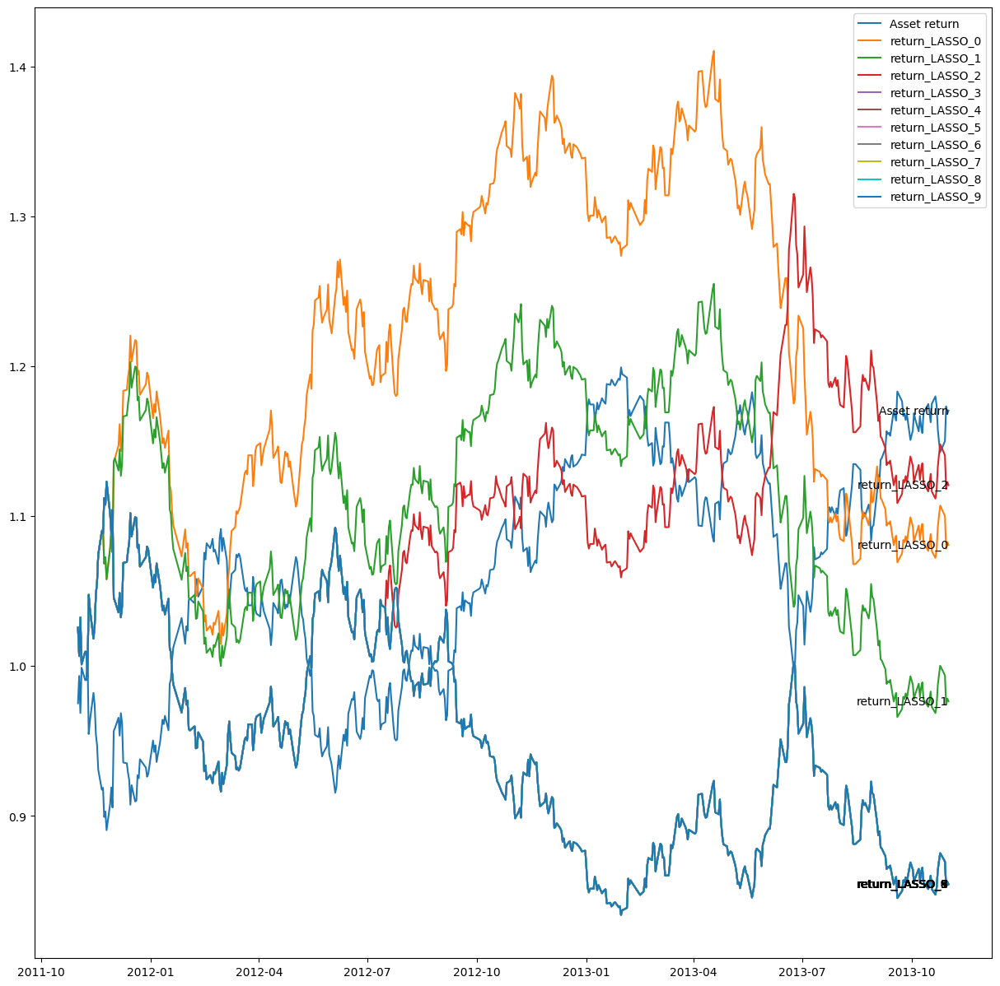

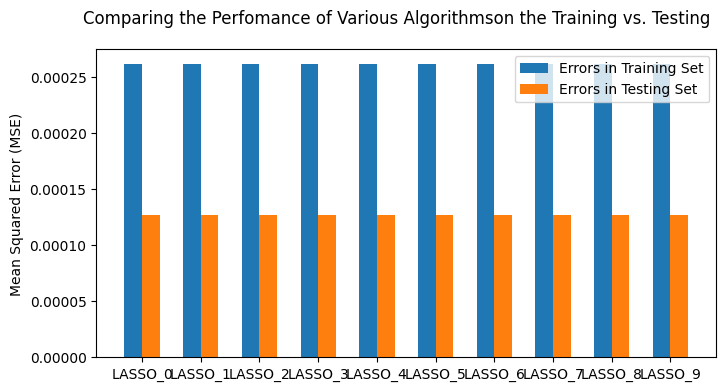

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
return_LASSO_0,3.953447,0.239440,0.351469,-24.279127,-34241.665064,196,1.080747,262,230,53.252033
return_LASSO_1,-1.183112,-0.052668,-0.076829,-23.029689,-28901.326958,308,0.976446,255,237,51.829268
return_LASSO_2,5.852821,0.344284,0.503134,-18.406757,-20670.353511,303,1.120657,250,242,50.813008
return_LASSO_3,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.983740
return_LASSO_4,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.983740
return_LASSO_5,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.983740
return_LASSO_6,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.983740
return_LASSO_7,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.983740
return_LASSO_8,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.983740


In [705]:
Lasso_test = select_model(models_Lasso,
                          X_choice_eff, 
                          data.iloc[:, 0], 
                          data.iloc[:, 2:], 
                          [start, train1, test])
Lasso_test

#### From the above result: Lasso Alpha = 0.03

> Ridge Fine Tuning

In [706]:
models_Ridge = []

for i in range(20):
    models_Ridge.append((f"RIDGE_{i}", Ridge(alpha = 0.01*(i+1))
             )
            )
models_Ridge

[('RIDGE_0', Ridge(alpha=0.01)),
 ('RIDGE_1', Ridge(alpha=0.02)),
 ('RIDGE_2', Ridge(alpha=0.03)),
 ('RIDGE_3', Ridge(alpha=0.04)),
 ('RIDGE_4', Ridge(alpha=0.05)),
 ('RIDGE_5', Ridge(alpha=0.06)),
 ('RIDGE_6', Ridge(alpha=0.07)),
 ('RIDGE_7', Ridge(alpha=0.08)),
 ('RIDGE_8', Ridge(alpha=0.09)),
 ('RIDGE_9', Ridge(alpha=0.1)),
 ('RIDGE_10', Ridge(alpha=0.11)),
 ('RIDGE_11', Ridge(alpha=0.12)),
 ('RIDGE_12', Ridge(alpha=0.13)),
 ('RIDGE_13', Ridge(alpha=0.14)),
 ('RIDGE_14', Ridge(alpha=0.15)),
 ('RIDGE_15', Ridge(alpha=0.16)),
 ('RIDGE_16', Ridge(alpha=0.17)),
 ('RIDGE_17', Ridge(alpha=0.18)),
 ('RIDGE_18', Ridge(alpha=0.19)),
 ('RIDGE_19', Ridge(alpha=0.2))]

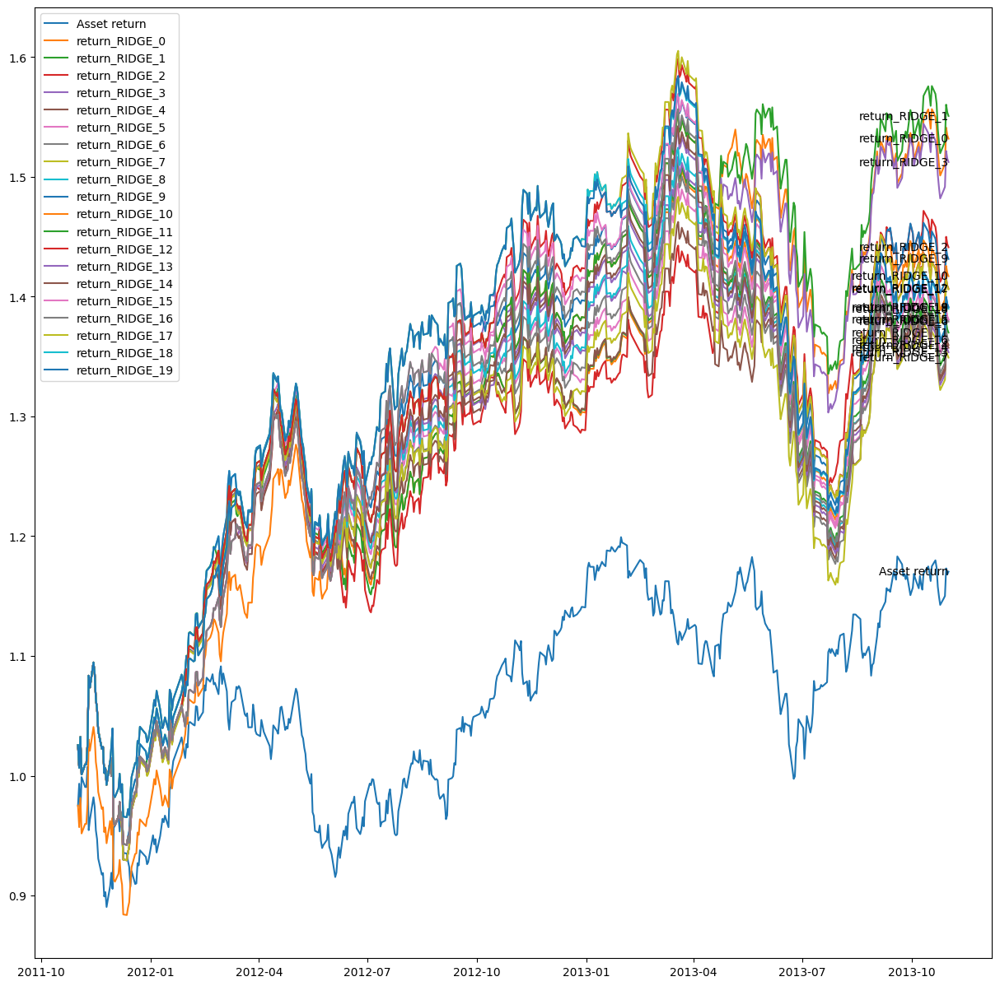

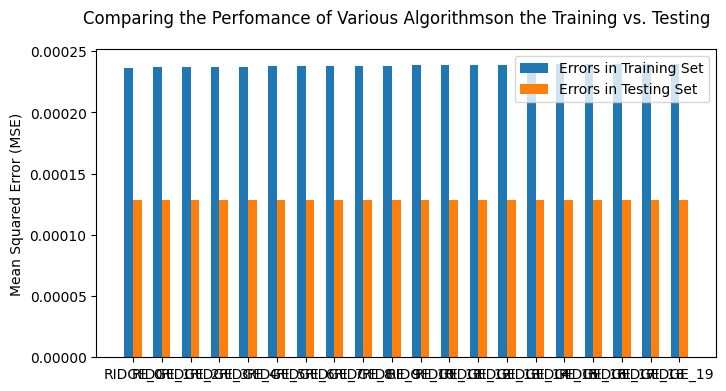

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
return_RIDGE_0,23.731463,1.395424,2.111961,-15.083856,-22037.728971,157,1.531841,264,228,53.658537
return_RIDGE_1,24.494570,1.284452,1.933881,-15.083856,-22519.877118,149,1.550820,265,227,53.861789
return_RIDGE_2,20.019088,1.071512,1.602279,-15.083856,-20941.893109,149,1.441178,261,231,53.048780
return_RIDGE_3,22.942943,1.211250,1.829535,-15.083856,-21976.126344,121,1.512352,261,231,53.048780
return_RIDGE_4,16.578706,0.902680,1.345657,-19.248425,-28148.027113,226,1.359631,256,236,52.032520
return_RIDGE_5,17.471938,0.946949,1.413234,-19.248425,-28765.551245,226,1.380575,258,234,52.439024
return_RIDGE_6,17.411492,0.943996,1.406552,-21.829357,-32863.742636,226,1.379152,259,233,52.642276
return_RIDGE_7,16.126623,0.880180,1.309617,-21.829357,-32379.438636,226,1.349092,258,234,52.439024
return_RIDGE_8,17.924842,0.969316,1.444277,-21.829357,-33276.660555,226,1.391255,261,231,53.048780


In [707]:
Ridge_test = select_model(models_Ridge,
                          X_choice_eff, 
                          data.iloc[:, 0], 
                          data.iloc[:, 2:], 
                          [start, train1, test])
Ridge_test

#### From the above result: Ridge Alpha = 0.02

> SVM Regressor Fine Tuning (SVR)
* Linear Kernel
* Polynomial Kernel
* rbf or Gaussian Kernel

In [708]:
models_SVR = []

svr1 = SVR(kernel = 'linear',epsilon=0.56,C=25) 
svr2 = SVR(kernel = 'poly',degree=4,epsilon=0.56,C=25)
svr3 = SVR(kernel = 'rbf',epsilon=0.56,C=25)

models_SVR.append(('SVR Linear', svr1))
models_SVR.append(('SVR Polynomial', svr2))
models_SVR.append(('SVR Sigmoid', svr3))

models_SVR

[('SVR Linear', SVR(C=25, epsilon=0.56, kernel='linear')),
 ('SVR Polynomial', SVR(C=25, degree=4, epsilon=0.56, kernel='poly')),
 ('SVR Sigmoid', SVR(C=25, epsilon=0.56))]

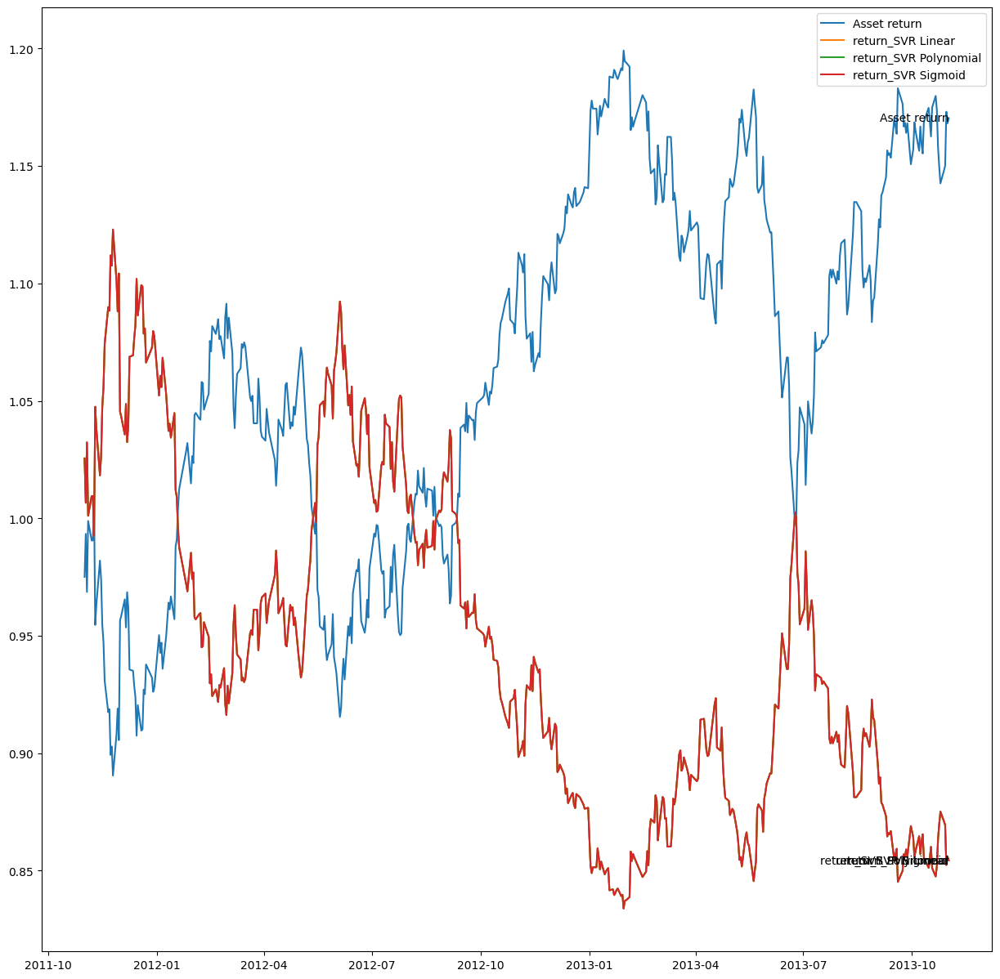

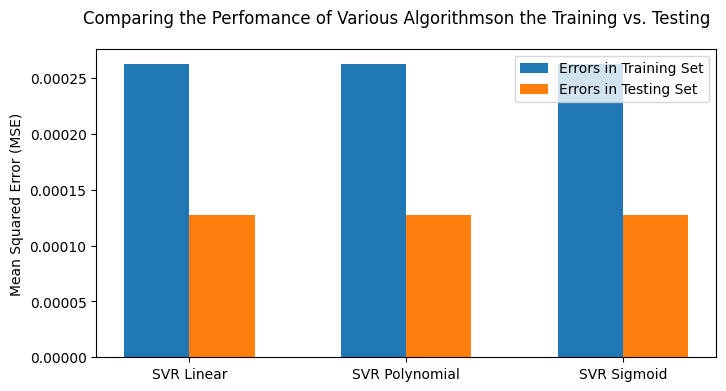

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.01626
return_SVR Linear,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.98374
return_SVR Polynomial,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.98374
return_SVR Sigmoid,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.98374


In [709]:
SVR_test = select_model(models_SVR,
                          X_choice_eff, 
                          data.iloc[:, 0], 
                          data.iloc[:, 2:], 
                          [start, train1, test])
SVR_test

#### From the above result: SVM Regressor is no better than Asset return

> # Binary ML models

> kNN Classifier Fine Tuning

In [710]:
models_kNN = []
# argument: Minkowski (default metric) and p=2 gives Euclidean distance
# default weight is uniform
# algorithm auto uses 'best' search method to solve min distances
# n_jobs (default none means 1): number of parallel processes to solve
for i in range(8):

    models_kNN.append((f"kNN{2*i+1}", 
                       KNeighborsClassifier(n_neighbors = 2*i+1, 
                                            algorithm='auto', 
                                            metric='minkowski', 
                                            p=2,
                                            metric_params=None, 
                                            n_jobs=None, 
                                            weights='uniform')
            ))
models_kNN

[('kNN1', KNeighborsClassifier(n_neighbors=1)),
 ('kNN3', KNeighborsClassifier(n_neighbors=3)),
 ('kNN5', KNeighborsClassifier()),
 ('kNN7', KNeighborsClassifier(n_neighbors=7)),
 ('kNN9', KNeighborsClassifier(n_neighbors=9)),
 ('kNN11', KNeighborsClassifier(n_neighbors=11)),
 ('kNN13', KNeighborsClassifier(n_neighbors=13)),
 ('kNN15', KNeighborsClassifier(n_neighbors=15))]

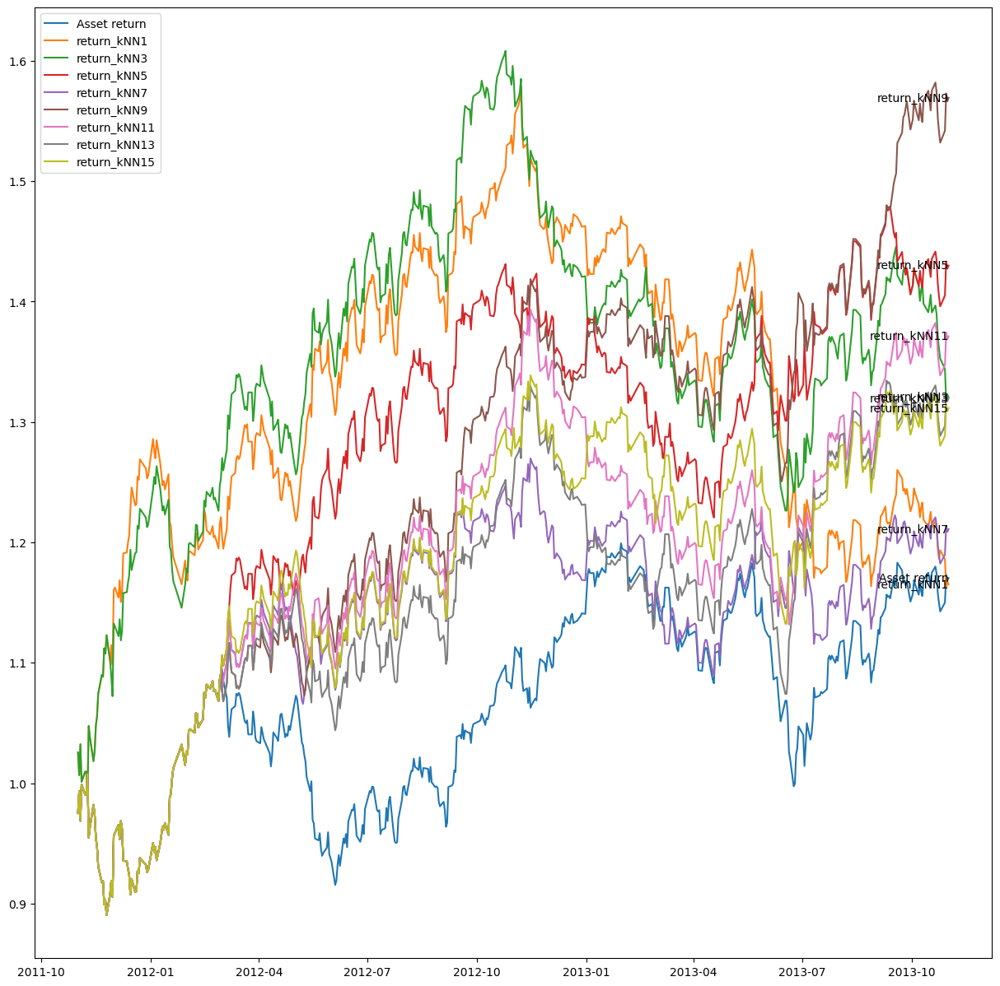

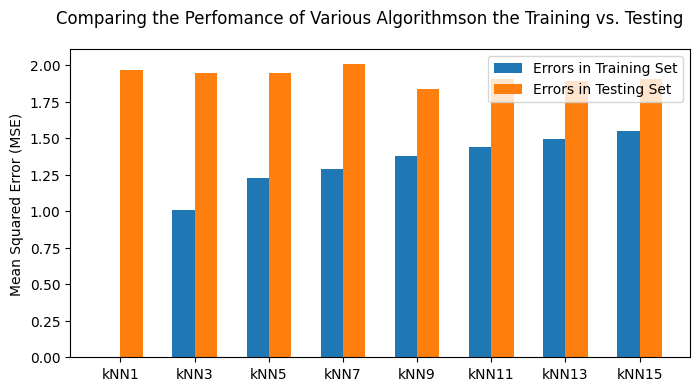

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
return_kNN1,7.931859,0.455787,0.689611,-26.368329,-41629.028924,358,1.165172,250,242,50.813008
return_kNN3,14.892032,0.816341,1.256232,-23.745474,-38186.337046,371,1.320520,253,239,51.422764
return_kNN5,19.549800,1.193494,1.861596,-14.710084,-21052.152401,290,1.429915,253,239,51.422764
return_kNN7,10.030027,0.713060,1.083308,-14.201441,-18031.777663,350,1.210978,245,247,49.796748
return_kNN9,25.226769,1.464522,2.254219,-11.846242,-16804.856986,258,1.569141,266,226,54.065041
return_kNN11,17.069783,1.072840,1.619216,-18.769469,-26149.867315,350,1.371125,258,234,52.439024
return_kNN13,14.853341,0.961745,1.452627,-19.208010,-25536.711828,298,1.319630,259,233,52.642276
return_kNN15,14.493179,0.943482,1.424628,-15.412293,-20632.289044,350,1.311355,258,234,52.439024


In [711]:
kNN_test = select_model_binary(models_kNN,
                               X_choice_eff,
                               data.iloc[:, :2],
                               data.iloc[:, 2:],
                               [start, train1, test])
kNN_test

#### From the above result: kNN Classifier is chosen as k = 9

> SVM Classifier Fine Tuning (SVC)
* Linear Kernel
* Polynomial Kernel
* Sigmoid Kernel
* rbf or Gaussian Kernel

In [712]:
models_SVC = []

svc1 = SVC(kernel='linear', C = 1.0, probability=True) 
svc2 = SVC(kernel='poly', C = 1.0, probability=True)
svc3 = SVC(kernel='sigmoid', C = 1.0, probability=True)
svc4 = SVC(kernel='rbf', C = 1.0, gamma='scale', probability=True)
## To compare with Logistic Regression
LogiR = LogisticRegression(random_state=1, 
                        multi_class='multinomial',
                        solver='newton-cg')

models_SVC.append(('SVC Linear', svc1))
models_SVC.append(('SVC Polynomial', svc2))
models_SVC.append(('SVC Sigmoid', svc3))
models_SVC.append(('SVC Gaussian', svc4))
models_SVC.append(('Logi Regression', LogiR))


models_SVC

[('SVC Linear', SVC(kernel='linear', probability=True)),
 ('SVC Polynomial', SVC(kernel='poly', probability=True)),
 ('SVC Sigmoid', SVC(kernel='sigmoid', probability=True)),
 ('SVC Gaussian', SVC(probability=True)),
 ('Logi Regression',
  LogisticRegression(multi_class='multinomial', random_state=1,
                     solver='newton-cg'))]

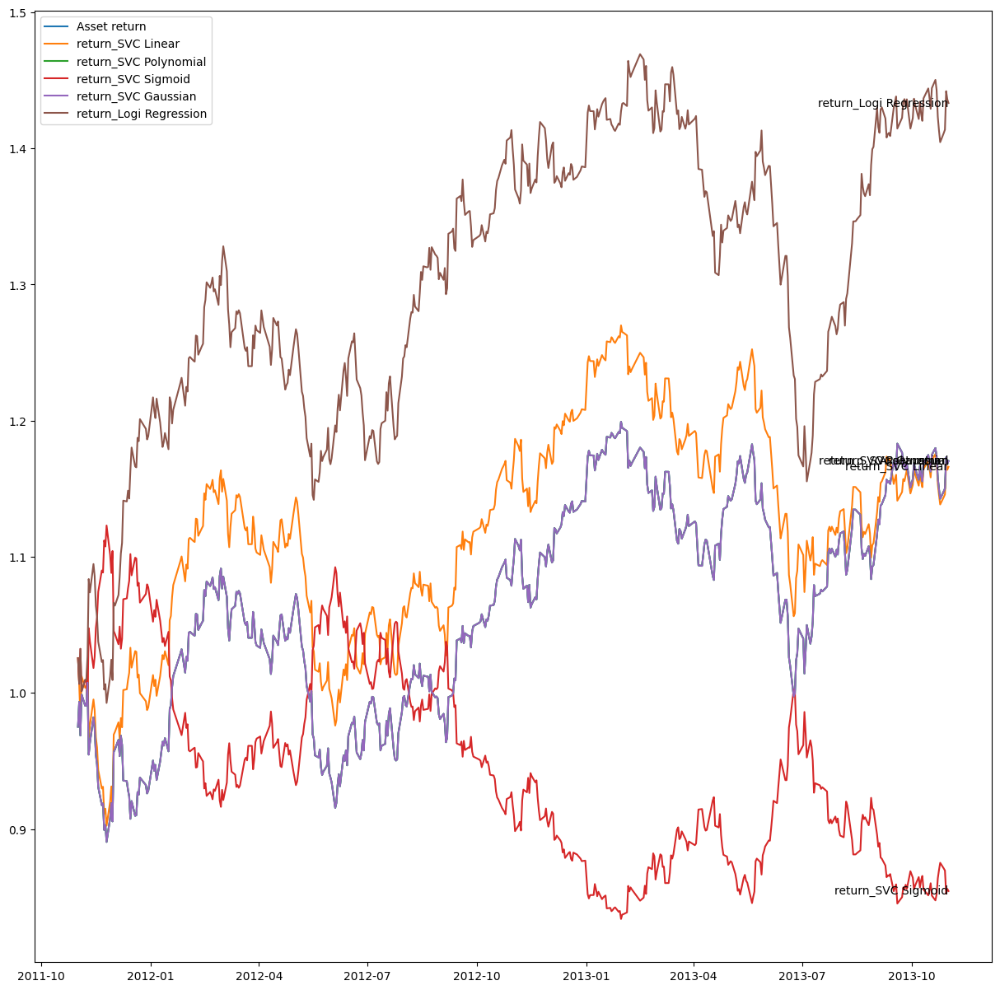

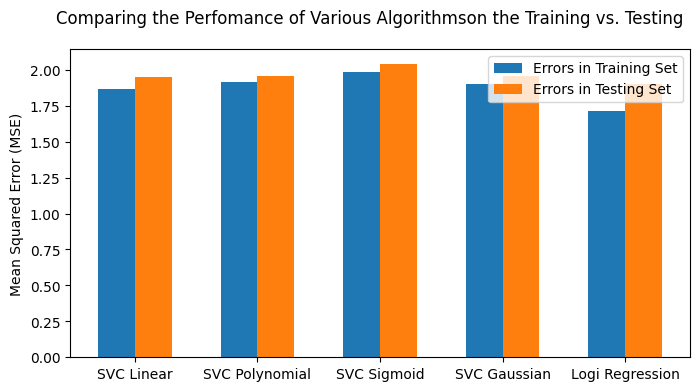

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
return_SVC Linear,7.973408,0.459049,0.661181,-16.825077,-21367.336118,274,1.166071,252,240,51.219512
return_SVC Polynomial,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
return_SVC Sigmoid,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.983740
return_SVC Gaussian,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
return_Logi Regression,19.692489,1.052854,1.659204,-21.361518,-31385.036805,256,1.433335,258,234,52.439024


In [713]:
SVC_test = select_model_binary(models_SVC,
                               X_choice_eff,
                               data.iloc[:, :2],
                               data.iloc[:, 2:],
                               [start, train1, test])
SVC_test

#### From the above result: SVC does not out perform Logistic Regression

> Decision Tree Classifier Fine Tuning (DT)
* max depth
* criterion


In [714]:
models_DT = []

for i in range(15):
    depth = i+1
    models_DT.append((f"DT{depth}",
                      DecisionTreeClassifier(max_depth=depth,
                                             criterion='gini')
            ))
models_DT

[('DT1', DecisionTreeClassifier(max_depth=1)),
 ('DT2', DecisionTreeClassifier(max_depth=2)),
 ('DT3', DecisionTreeClassifier(max_depth=3)),
 ('DT4', DecisionTreeClassifier(max_depth=4)),
 ('DT5', DecisionTreeClassifier(max_depth=5)),
 ('DT6', DecisionTreeClassifier(max_depth=6)),
 ('DT7', DecisionTreeClassifier(max_depth=7)),
 ('DT8', DecisionTreeClassifier(max_depth=8)),
 ('DT9', DecisionTreeClassifier(max_depth=9)),
 ('DT10', DecisionTreeClassifier(max_depth=10)),
 ('DT11', DecisionTreeClassifier(max_depth=11)),
 ('DT12', DecisionTreeClassifier(max_depth=12)),
 ('DT13', DecisionTreeClassifier(max_depth=13)),
 ('DT14', DecisionTreeClassifier(max_depth=14)),
 ('DT15', DecisionTreeClassifier(max_depth=15))]

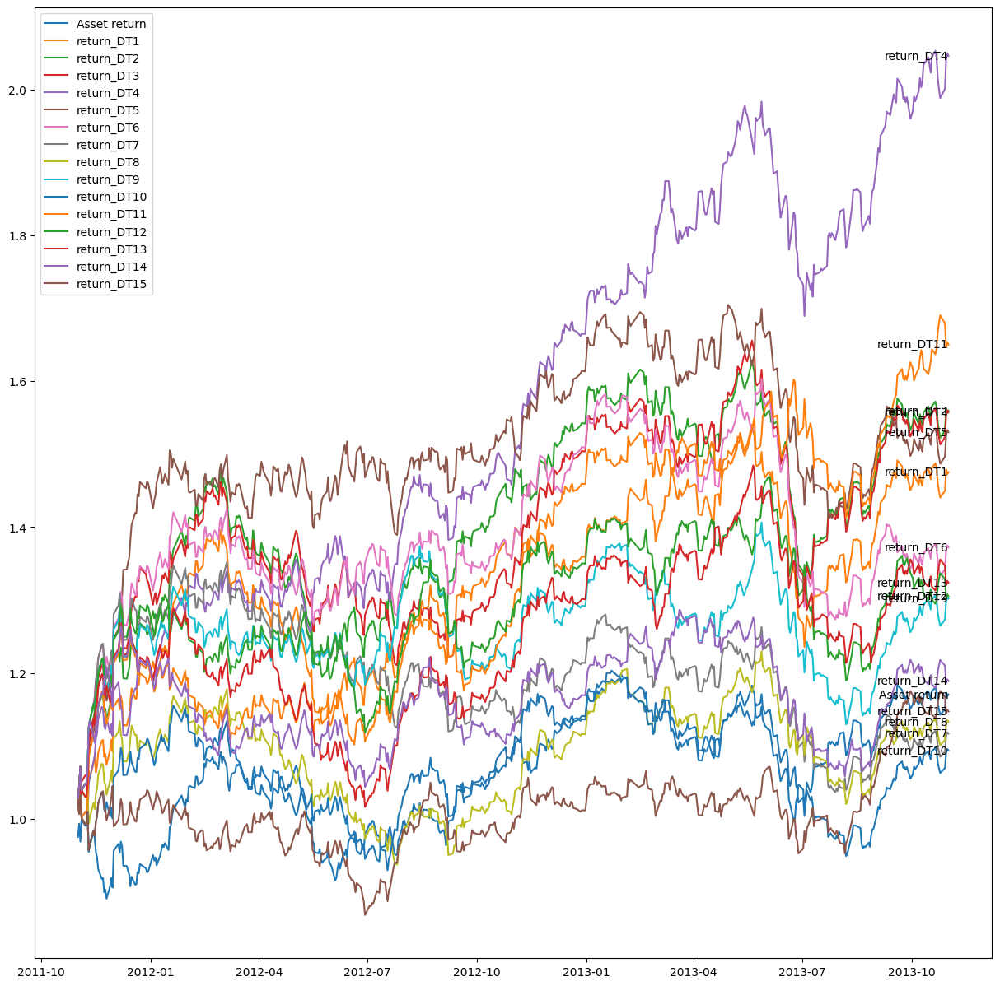

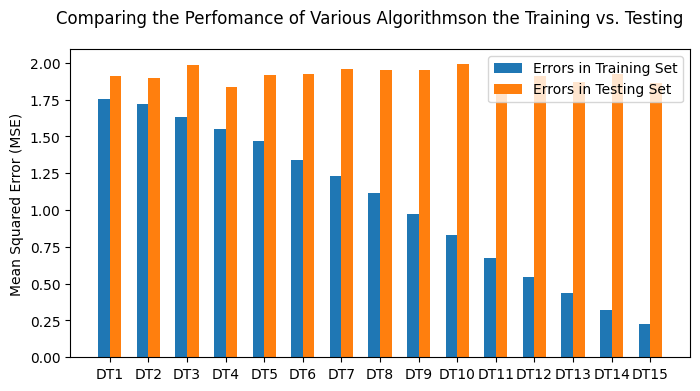

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
return_DT1,21.430420,1.137051,1.760731,-19.788632,-30480.535299,246,1.475319,257,235,52.235772
return_DT2,24.836427,1.297620,2.024735,-19.788632,-32216.856824,246,1.559361,259,233,52.642276
return_DT3,24.750446,1.293604,2.025166,-21.457635,-35529.156792,274,1.557211,248,244,50.406504
return_DT4,42.961895,2.090064,3.412497,-14.820512,-29390.451768,110,2.045813,266,226,54.065041
return_DT5,23.657207,1.242629,1.925879,-17.137767,-29210.530579,183,1.530000,256,236,52.032520
return_DT6,17.109524,0.927907,1.387904,-20.573226,-32984.735685,247,1.372058,255,237,51.829268
return_DT7,5.664426,0.333702,0.486970,-23.330116,-31537.002963,605,1.116666,251,241,51.016260
return_DT8,6.426195,0.375914,0.529122,-20.418129,-24045.072394,318,1.132847,252,240,51.219512
return_DT9,14.067073,0.775483,1.158492,-19.694444,-27696.589680,187,1.301599,252,240,51.219512


In [715]:
DT_test = select_model_binary(models_DT,
                               X_choice_eff,
                               data.iloc[:, :2],
                               data.iloc[:, 2:],
                               [start, train1, test])
DT_test

#### From the above result: Decision Tree Classifier under Gini criterion is chosen as max depth = 4

> Random Forest Classifier Fine Tuning (RF)
* number of estimators
* max_features
* max_depth
* random_state


In [716]:
models_RF = []

for i in range(3):
    models_RF.append((f"RF{i}",
                      RandomForestClassifier(n_estimators=100*(i+1), 
                                  random_state=1, 
                                  max_features=None, 
                                  max_depth=None)
            ))
    
    
for i in range(3):    
    models_RF.append((f"RF{i+3}",
                      RandomForestClassifier(n_estimators=100, 
                                  random_state=1, 
                                  max_features=i+4, 
                                  max_depth=None)
            ))    
for i in range(3):    
    models_RF.append((f"RF{i+6}",
                      RandomForestClassifier(n_estimators=100, 
                                  random_state=1, 
                                  max_features=None, 
                                  max_depth=i+2)
            ))     
for i in range(3):    
    models_RF.append((f"RF{i+9}",
                      RandomForestClassifier(n_estimators=100, 
                                  random_state=1, 
                                  max_features=5, 
                                  max_depth=i+2)
            ))      
models_RF

[('RF0', RandomForestClassifier(max_features=None, random_state=1)),
 ('RF1',
  RandomForestClassifier(max_features=None, n_estimators=200, random_state=1)),
 ('RF2',
  RandomForestClassifier(max_features=None, n_estimators=300, random_state=1)),
 ('RF3', RandomForestClassifier(max_features=4, random_state=1)),
 ('RF4', RandomForestClassifier(max_features=5, random_state=1)),
 ('RF5', RandomForestClassifier(max_features=6, random_state=1)),
 ('RF6',
  RandomForestClassifier(max_depth=2, max_features=None, random_state=1)),
 ('RF7',
  RandomForestClassifier(max_depth=3, max_features=None, random_state=1)),
 ('RF8',
  RandomForestClassifier(max_depth=4, max_features=None, random_state=1)),
 ('RF9', RandomForestClassifier(max_depth=2, max_features=5, random_state=1)),
 ('RF10', RandomForestClassifier(max_depth=3, max_features=5, random_state=1)),
 ('RF11', RandomForestClassifier(max_depth=4, max_features=5, random_state=1))]

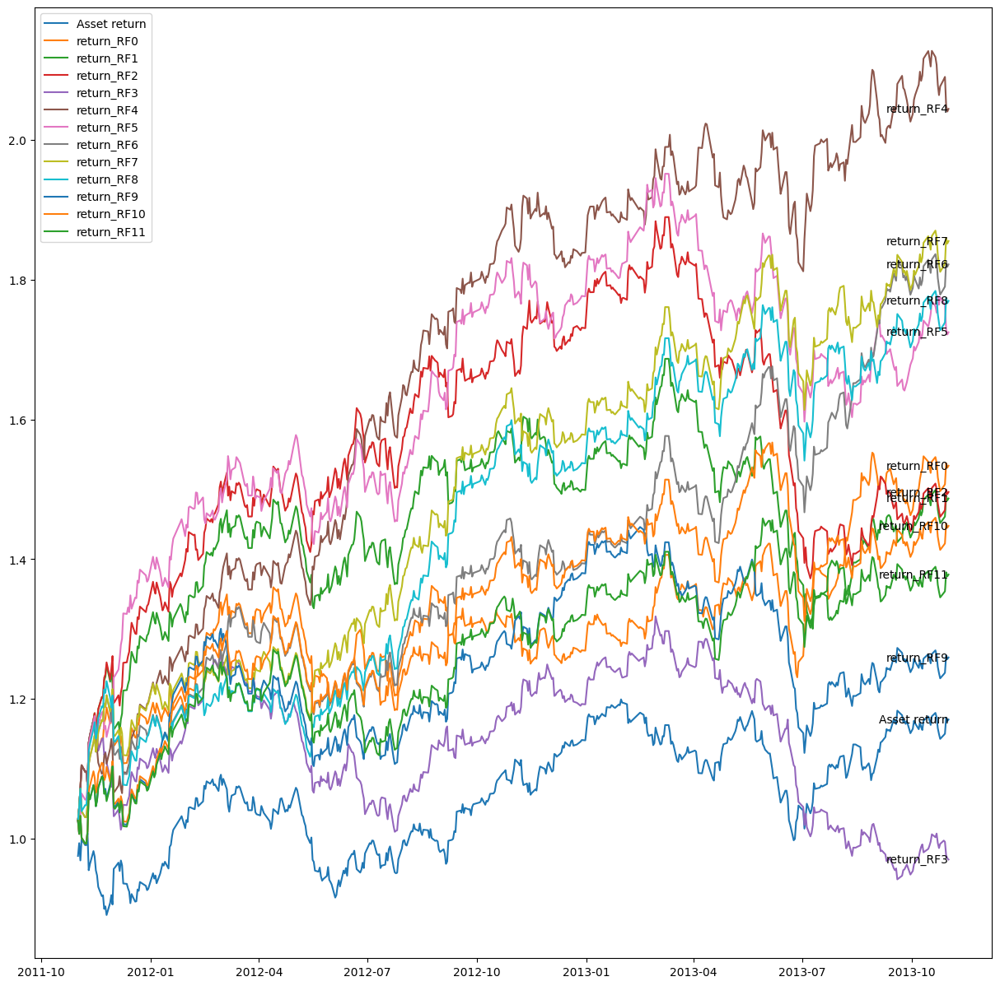

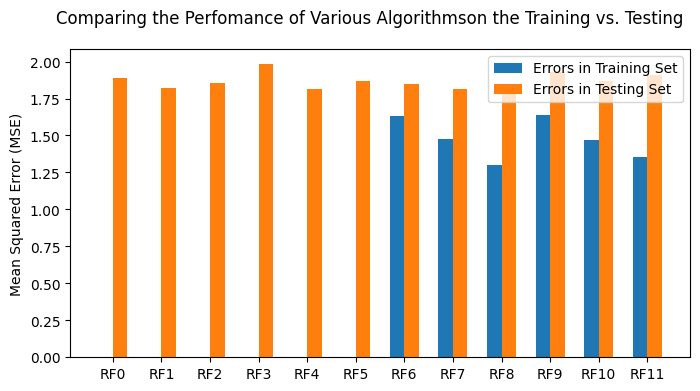

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
return_RF0,23.804802,1.252228,1.877498,-13.463156,-19147.937763,189,1.533660,260,232,52.845528
return_RF1,21.901701,1.162028,1.732086,-22.910308,-38645.106276,234,1.486809,268,224,54.471545
return_RF2,22.278224,1.179576,1.773853,-27.373042,-51725.257438,234,1.496021,264,228,53.658537
return_RF3,-1.514233,-0.072266,-0.103096,-28.565762,-37650.403989,343,0.969904,248,244,50.406504
return_RF4,42.916227,2.090790,3.383882,-10.450952,-21147.228007,130,2.044504,269,223,54.674797
return_RF5,31.281675,1.590032,2.544290,-18.184221,-35489.149597,235,1.724773,262,230,53.252033
return_RF6,34.920011,1.754284,2.707539,-12.470899,-20901.420792,161,1.821835,265,227,53.861789
return_RF7,36.150982,1.807630,2.779795,-12.101732,-22216.043233,123,1.855277,269,223,54.674797
return_RF8,32.976440,1.669248,2.549098,-12.620249,-22256.719138,134,1.769655,269,223,54.674797


In [717]:
RF_test = select_model_binary(models_RF,
                               X_choice_eff,
                               data.iloc[:, :2],
                               data.iloc[:, 2:],
                               [start, train1, test])
RF_test

> # Choice on Classifier algorithms

In [718]:
models_Classifier = []

# Regression and tree regression algorithms
models_Classifier.append(("kNN9",
               KNeighborsClassifier(n_neighbors = 9,
                                    algorithm='auto',
                                    metric='minkowski',
                                    p=2,
                                    metric_params=None,
                                    n_jobs=None,
                                    weights='uniform')
             )
            )

models_Classifier.append(("SVC_LN",
               SVC(kernel='linear',
                   C = 1.0,
                   probability=True)
             )
            )

models_Classifier.append(("LogiR", 
               LogisticRegression(random_state=1,
                                  multi_class='multinomial',
                                  solver='newton-cg')
             )
            )

models_Classifier.append(("DecisionTree4",
               DecisionTreeClassifier(max_depth=4,
                                      criterion='gini')
             )
            )

models_Classifier.append(("RandomForest",
                          RandomForestClassifier(n_estimators=100, 
                                                 random_state=1, 
                                                 max_features=5,
                                                 max_depth=None)
             )
            )

models_Classifier

[('kNN9', KNeighborsClassifier(n_neighbors=9)),
 ('SVC_LN', SVC(kernel='linear', probability=True)),
 ('LogiR',
  LogisticRegression(multi_class='multinomial', random_state=1,
                     solver='newton-cg')),
 ('DecisionTree4', DecisionTreeClassifier(max_depth=4)),
 ('RandomForest', RandomForestClassifier(max_features=5, random_state=1))]

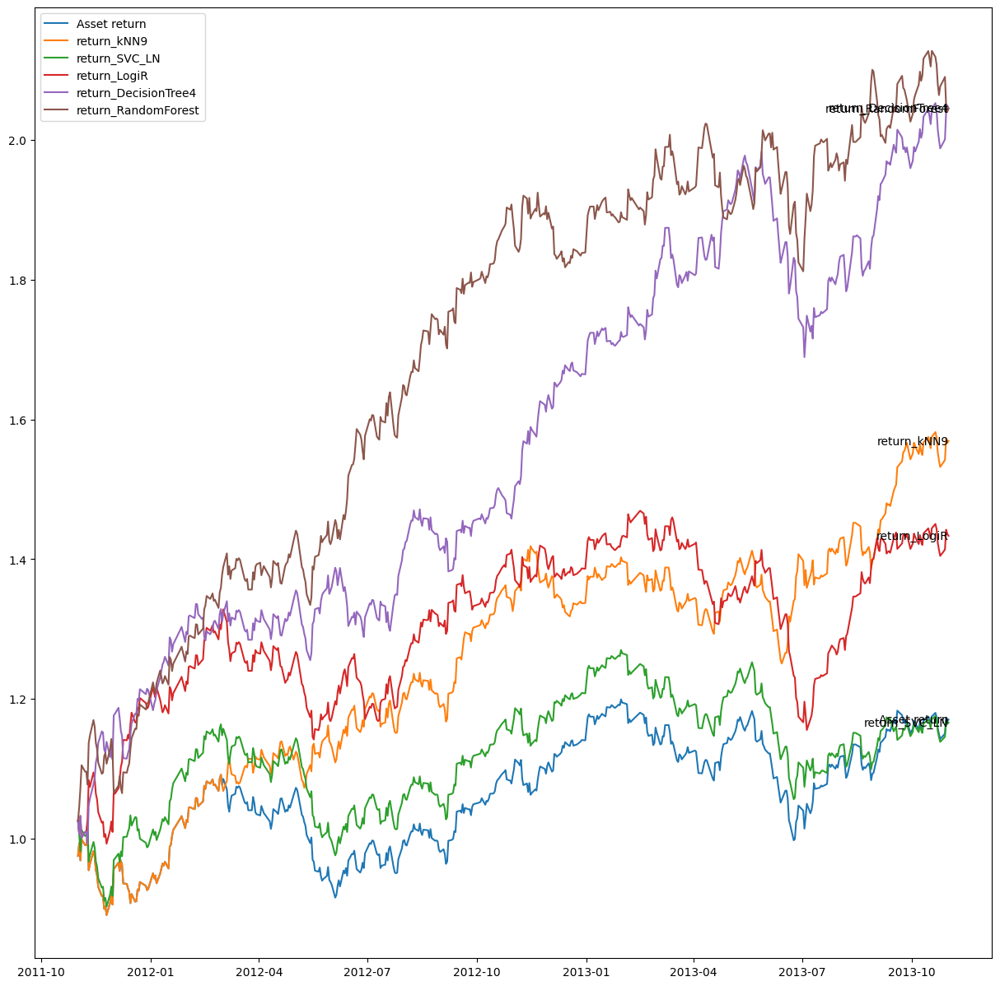

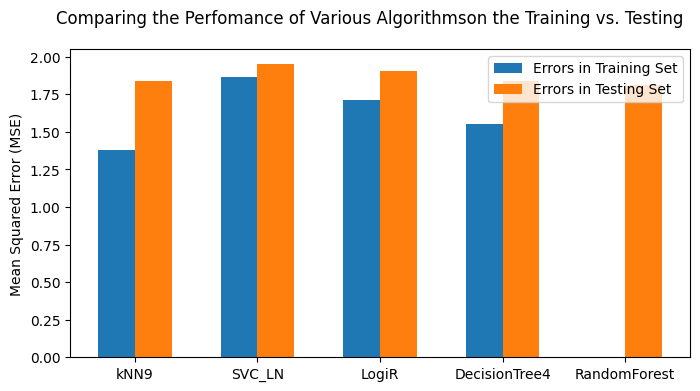

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
return_kNN9,25.226769,1.464522,2.254219,-11.846242,-16804.856986,258,1.569141,266,226,54.065041
return_SVC_LN,7.973408,0.459049,0.661181,-16.825077,-21367.336118,274,1.166071,252,240,51.219512
return_LogiR,19.692489,1.052854,1.659204,-21.361518,-31385.036805,256,1.433335,258,234,52.439024
return_DecisionTree4,42.961895,2.090064,3.412497,-14.820512,-29390.451768,110,2.045813,266,226,54.065041
return_RandomForest,42.916227,2.090790,3.383882,-10.450952,-21147.228007,130,2.044504,269,223,54.674797


In [719]:
model_class_test =\
    select_model_binary(models_Classifier,
                        X_choice_eff,
                        data.iloc[:, :2],
                        data.iloc[:, 2:],
                        [start, train1, test])
model_class_test

> Based on the above result, Classifier model choice would be 
* `Logistic Regressor (LogiR)`
#### to note, the random algorithms are not consistant. Thus without strong evidence, those are not fit for the contents here.

> # Choice on Regression algorithms

In [720]:
models = []

# Regression and tree regression algorithms
models.append(("LR", LinearRegression()
             )
            )

models.append(("RIDGE", Ridge(alpha = 0.01)
             )
            )

models.append(("LASSO", Lasso(alpha = 0.03)
             )
            )

models.append(("EN", ElasticNet()
             )
            )

models.append(("CART", DecisionTreeRegressor()
             )
            )

models.append(("KNN", KNeighborsRegressor()
             )
            )

models.append(("SVR", SVR(kernel = 'linear',epsilon=0.56,C=25)
             )
            )

# Ensemble models

# Bagging (Boostrap Aggregation)

models.append(("RFR", RandomForestRegressor()
              )
             )

models.append(("ETR", ExtraTreesRegressor()
              )
             )

# Boosting

models.append(("GBR", GradientBoostingRegressor()
              )
             )

models.append(("ABR", AdaBoostRegressor()
              )
             )



In [721]:
models

[('LR', LinearRegression()),
 ('RIDGE', Ridge(alpha=0.01)),
 ('LASSO', Lasso(alpha=0.03)),
 ('EN', ElasticNet()),
 ('CART', DecisionTreeRegressor()),
 ('KNN', KNeighborsRegressor()),
 ('SVR', SVR(C=25, epsilon=0.56, kernel='linear')),
 ('RFR', RandomForestRegressor()),
 ('ETR', ExtraTreesRegressor()),
 ('GBR', GradientBoostingRegressor()),
 ('ABR', AdaBoostRegressor())]

In [722]:
data.isnull().sum().sum()

0

In [723]:
data.shape

(5410, 54)

In [724]:
data

,return,return_binary,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,0005.HK,...,^TNX_12DT,^SPX_12DT,000001.SS_12DT,HSI_MA21,HSI_MA63,HSI_MA252,HSI_EMA10,HSI_EMA30,HSI_EMA200,Const
Date,,,,,,,,,,,,,,,,,,,,,
2001-11-21,-0.004631,-1.0,-0.011907,0.006437,0.004260,0.026081,0.026578,0.006623,-0.001585,0.002699,...,0.113633,0.049753,0.004943,10704.819894,10704.819894,10704.819894,10946.213633,10554.376810,10232.253925,1
2001-11-22,0.007079,1.0,-0.004631,-0.011907,0.006437,0.004260,0.026081,0.026578,0.006623,0.005376,...,0.113633,0.049753,0.004943,10736.093229,10736.093229,10736.093229,10987.614776,10594.347333,10241.623736,1
2001-11-23,0.006118,1.0,0.007079,-0.004631,-0.011907,0.006437,0.004260,0.026081,0.026578,0.008010,...,0.113633,0.049753,0.004943,10768.418640,10768.418640,10768.418640,11035.921145,10636.860396,10251.690164,1
2001-11-26,0.006128,1.0,0.006118,0.007079,-0.004631,-0.011907,0.006437,0.004260,0.026081,0.002656,...,0.113633,0.049753,0.004943,10801.003447,10801.003447,10801.003447,11088.001001,10681.086200,10262.343599,1
2001-11-27,-0.011514,-1.0,0.006128,0.006118,0.007079,-0.004631,-0.011907,0.006437,0.004260,0.002656,...,0.113633,0.049753,0.004943,10833.834364,10833.834364,10833.834364,11143.266266,10726.949023,10273.583563,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-25,0.005505,1.0,-0.010573,-0.007181,-0.024931,-0.002299,0.007510,-0.009764,-0.023565,-0.020271,...,0.075872,-0.048617,-0.011348,17571.798456,18281.073010,19096.253763,17460.068870,17732.582369,19012.560956,1
2023-10-26,-0.002386,-1.0,0.005505,-0.010573,-0.007181,-0.024931,-0.002299,0.007510,-0.009764,-0.002563,...,0.075196,-0.037029,-0.008511,17525.507068,18255.948878,19099.016543,17391.934544,17690.824157,18993.384530,1
2023-10-27,0.020563,1.0,-0.002386,0.005505,-0.010573,-0.007181,-0.024931,-0.002299,0.007510,-0.023368,...,0.040005,-0.052042,-0.028679,17492.903274,18218.015687,19100.829718,17328.784514,17649.132880,18973.993732,1


In [725]:
models

[('LR', LinearRegression()),
 ('RIDGE', Ridge(alpha=0.01)),
 ('LASSO', Lasso(alpha=0.03)),
 ('EN', ElasticNet()),
 ('CART', DecisionTreeRegressor()),
 ('KNN', KNeighborsRegressor()),
 ('SVR', SVR(C=25, epsilon=0.56, kernel='linear')),
 ('RFR', RandomForestRegressor()),
 ('ETR', ExtraTreesRegressor()),
 ('GBR', GradientBoostingRegressor()),
 ('ABR', AdaBoostRegressor())]

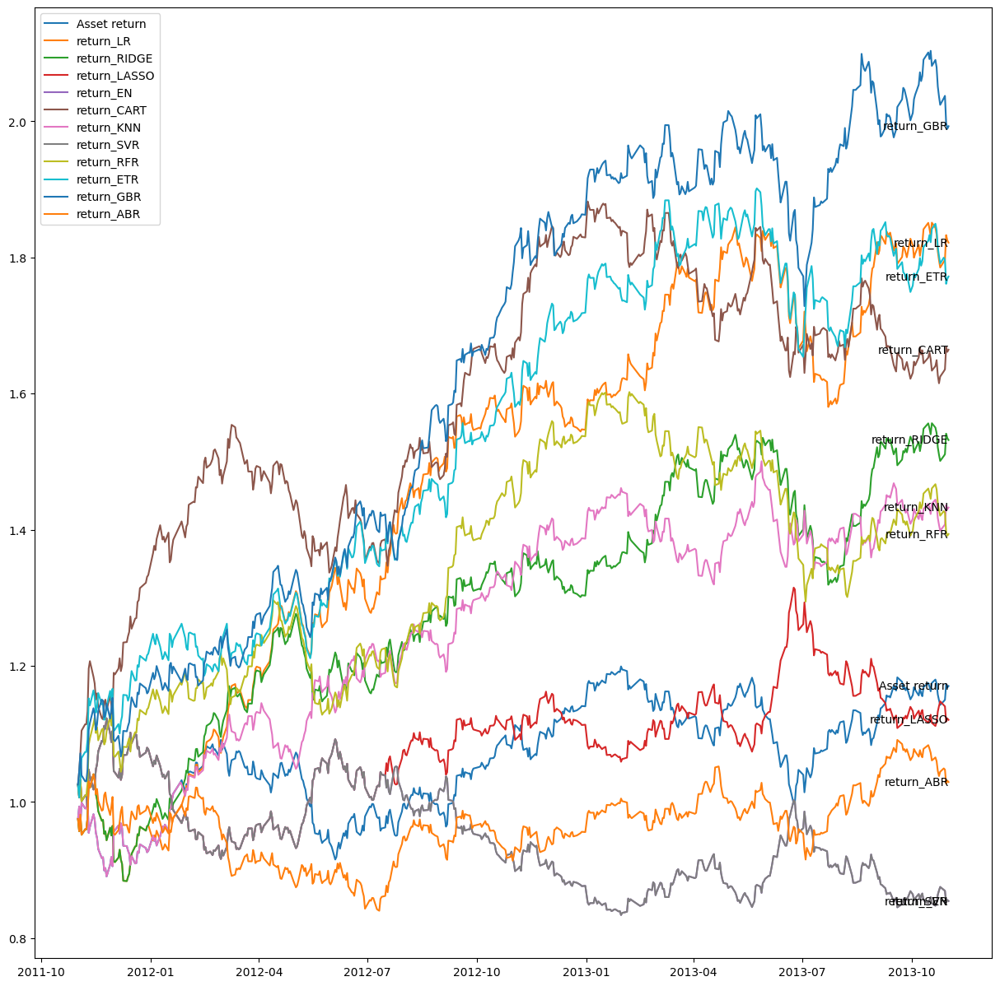

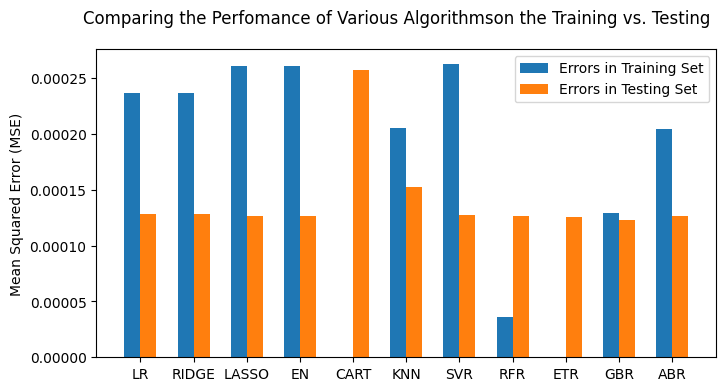

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
return_LR,34.920027,1.901489,2.978183,-15.083856,-26401.844226,161,1.821836,269,223,54.674797
return_RIDGE,23.731463,1.395424,2.111961,-15.083856,-22037.728971,157,1.531841,264,228,53.658537
return_LASSO,5.852821,0.344284,0.503134,-18.406757,-20670.353511,303,1.120657,250,242,50.813008
return_EN,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.983740
return_CART,28.970025,1.485889,2.389923,-14.188790,-26707.557419,302,1.664487,269,223,54.674797
return_KNN,19.664251,1.199434,1.849052,-11.616365,-15855.775082,156,1.432658,254,238,51.626016
return_SVR,-7.555711,-0.438202,-0.615612,-25.743281,-28909.097520,704,0.854411,241,251,48.983740
return_RFR,18.027362,0.974555,1.432245,-19.221453,-30798.998477,267,1.393679,269,223,54.674797
return_ETR,33.067395,1.671702,2.621791,-13.020934,-24760.514364,158,1.772080,272,220,55.284553


In [726]:
model_test = select_model(models, 
                          X_choice_eff, 
                          data.iloc[:, 0], 
                          data.iloc[:, 2:], 
                          [start, train1, test])
model_test

> Based on the above result, Regressor model choice would be 
* `LinearRegression (LR)`

In [727]:
model_choice = models[0]
model_choice

('LR', LinearRegression())

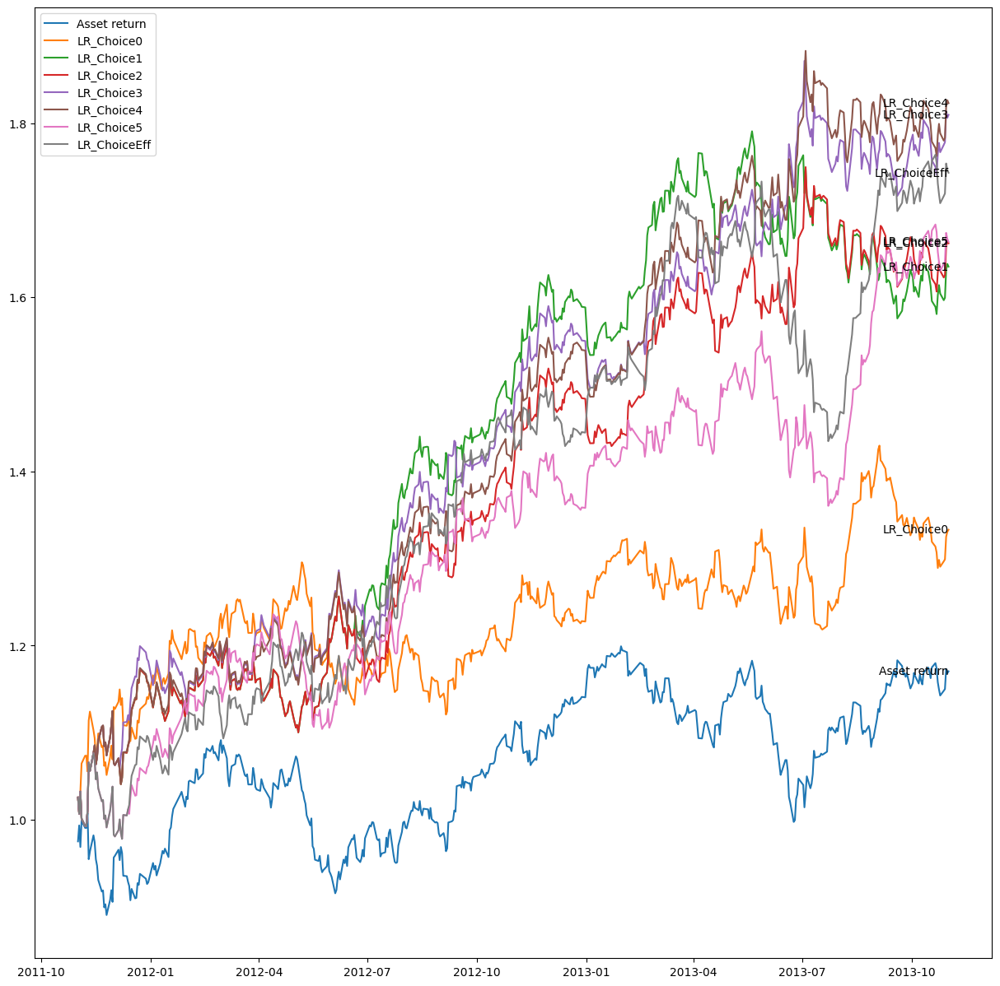

In [728]:
feature_test = select_feature(model_choice, 
                              X_choices, 
                              data.iloc[:, 0], 
                              data.iloc[:, 2:], 
                              [start, train1, test])

In [729]:
feature_test

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
LR_Choice0,15.437295,0.843342,1.318875,-13.501678,-17493.890004,255,1.333101,256,236,52.032520
LR_Choice1,27.837229,1.438658,2.188885,-12.005716,-21498.983668,164,1.635336,263,229,53.455285
LR_Choice2,28.876745,1.485786,2.272832,-8.327811,-14297.894731,119,1.662076,263,229,53.455285
LR_Choice3,34.468069,1.734055,2.691321,-8.287052,-15509.818775,120,1.809634,263,229,53.455285
LR_Choice4,34.964369,1.755867,2.715416,-7.831506,-12799.817749,119,1.823035,269,223,54.674797
LR_Choice5,28.948204,1.488681,2.298144,-12.850178,-20059.816662,95,1.663923,264,228,53.658537
LR_ChoiceEff,31.977141,1.625095,2.482920,-17.212254,-29829.392459,99,1.743121,268,224,54.471545


> Choice on feature sets with testing result
* ChoiceEff
* Choice5

## <a id = "p2">2. </a> <font color = "green"> Backtest </font>  [back to table of contents](#top)

# Performance Metrics:

1. Compound Annual Growth Rate (assume 252 days = 1 year) 
2. Sharpe Ratio (annualised using np.sqrt(252))
3. Sortino Ratio (annualised using np.sqrt(252)
4. Max Drawdown by %
5. Max Drawdown by $
6. Max Drawdown by Days
7. Multiple of Invested Capital (MoIC, = Final NAV/Initial NAV, expressed as multiple of base =1.0x). 
8. Win Rate

> Performance Metrics

> # Deploy on Regression algorithms

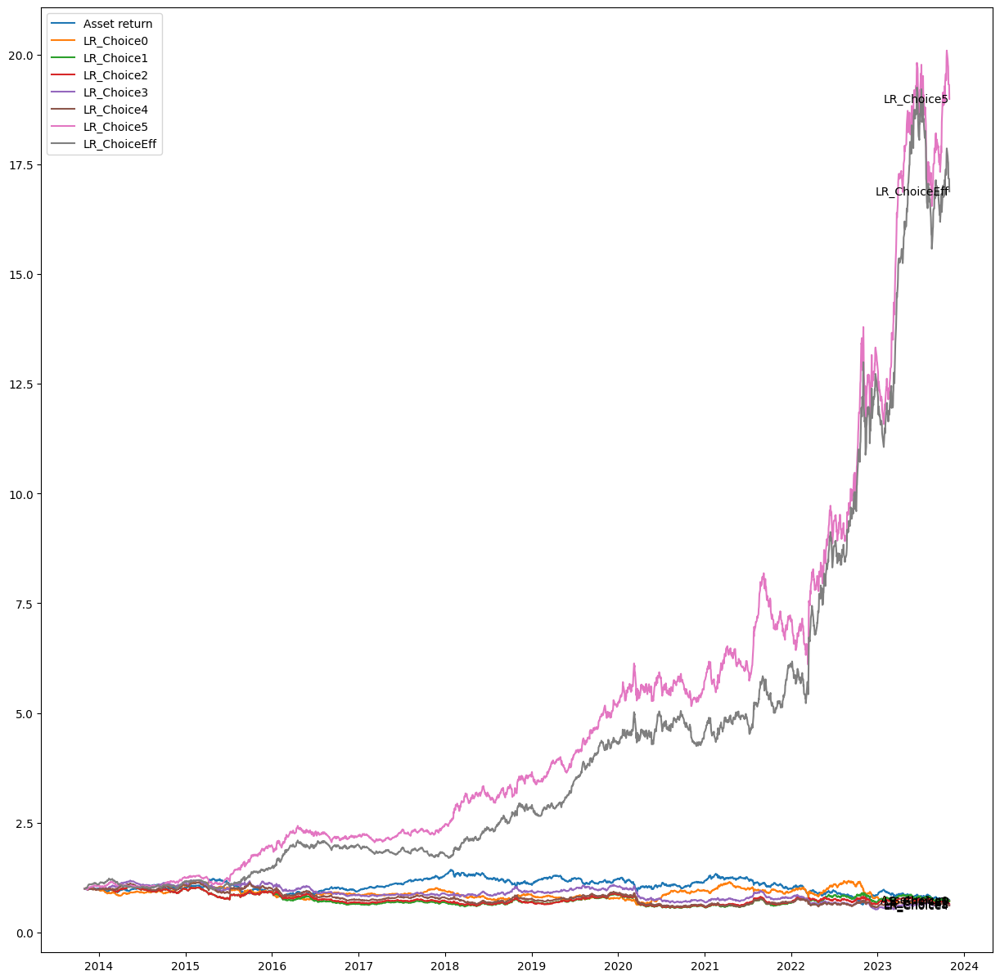

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,-2.999449,-0.050424,-0.071336,-55.700772,-79577.729073,2101,0.737404,1263,1198,51.320601
LR_Choice0,-3.229324,-0.062413,-0.087264,-45.035005,-52561.877946,2717,0.720110,1248,1213,50.711093
LR_Choice1,-3.369486,-0.069403,-0.099949,-48.211720,-51761.269568,3457,0.709745,1194,1267,48.516863
LR_Choice2,-4.211234,-0.113054,-0.162326,-47.374140,-50862.022743,3457,0.650271,1191,1270,48.394961
LR_Choice3,-4.641926,-0.135698,-0.192578,-55.996230,-66700.417257,3168,0.621610,1200,1261,48.760666
LR_Choice4,-4.757597,-0.139868,-0.198980,-49.919013,-56928.781168,2951,0.614109,1196,1265,48.598131
LR_Choice5,34.218804,1.573837,2.471939,-25.496720,-326352.031636,617,18.988201,1322,1139,53.718001
LR_ChoiceEff,32.650090,1.515716,2.413281,-20.628074,-367587.105242,702,16.881526,1296,1165,52.661520


In [730]:
deploy_test = select_feature(model_choice, 
                             X_choices, 
                             data.iloc[:, 0], 
                             data.iloc[:, 2:], 
                             [start, test, end])
deploy_test

> # Deploy on Classifier algorithms

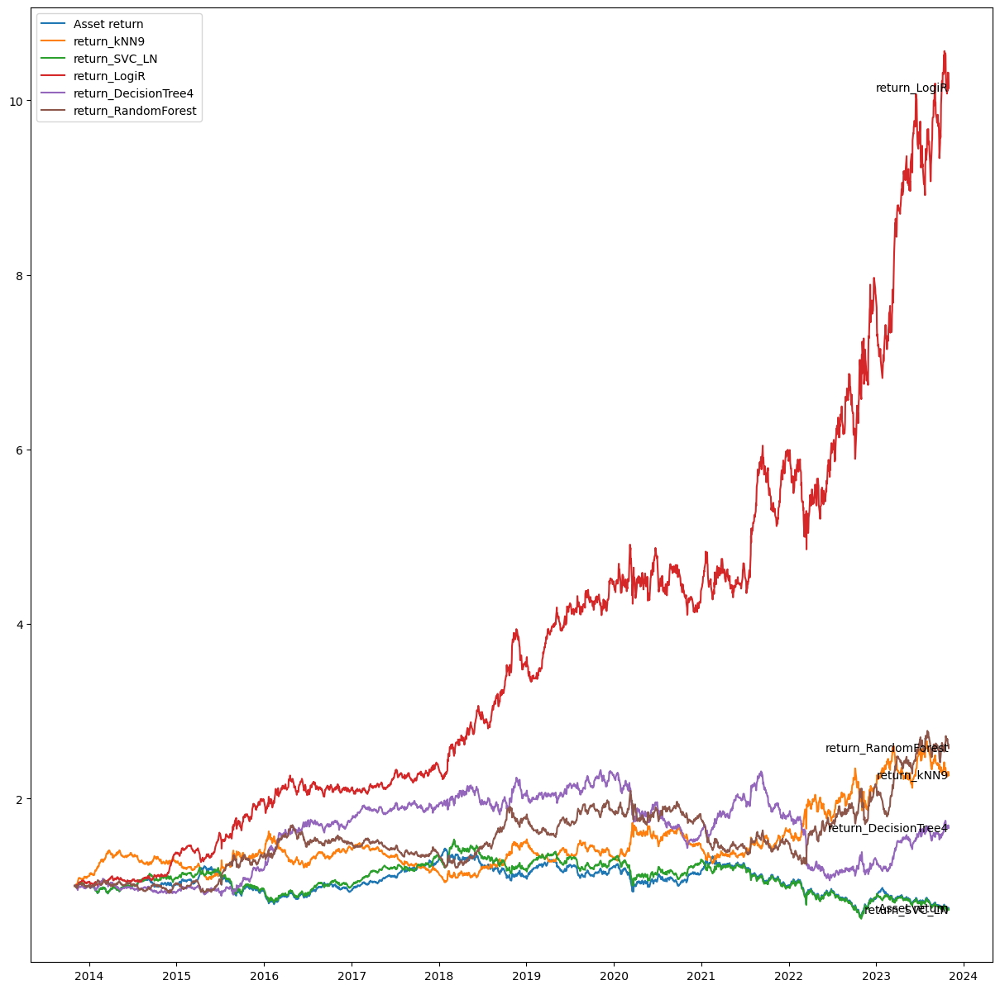

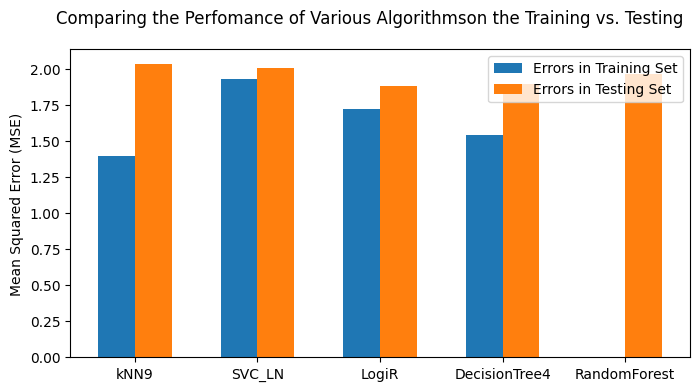

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,-2.999449,-0.050424,-0.071336,-55.700772,-79577.729073,2101,0.737404,1263,1198,51.320601
return_kNN9,8.527052,0.511105,0.773625,-35.970206,-58452.450933,1517,2.267135,1211,1250,49.207639
return_SVC_LN,-3.148348,-0.058009,-0.083144,-59.295518,-90838.302250,2065,0.726160,1229,1232,49.939049
return_LogiR,26.058516,1.262310,1.911708,-19.678520,-118931.634655,504,10.139054,1306,1155,53.067859
return_DecisionTree4,5.226511,0.356537,0.501896,-54.340175,-126481.191835,1453,1.664609,1296,1165,52.661520
return_RandomForest,9.929470,0.573501,0.859394,-40.296433,-84261.472279,958,2.577828,1253,1208,50.914262


In [731]:
deploy_class_test =\
    select_model_binary(models_Classifier,
                        X_choice_eff,
                        data.iloc[:, :2],
                        data.iloc[:, 2:],
                        [start, test, end])
deploy_class_test

## <a id = "p3">3. </a> <font color = "green"> Rolling Model (ML) </font>  [back to table of contents](#top)

> Fixed training set:

In [732]:
traing_start = '2001-11-01'
traing_end = '2011-11-01'

rolling_test1 = '2011-11-01'
rolling_test2 = '2013-11-01'
rolling_test3 = '2015-11-01'
rolling_test4 = '2017-11-01'
rolling_test5 = '2019-11-01'
rolling_test6 = '2021-11-01'

end = '2023-11-01'

rolling_test_tags =\
    [rolling_test1, rolling_test2, rolling_test3,
     rolling_test4, rolling_test5, rolling_test6, end]
rolling_test_tags

['2011-11-01',
 '2013-11-01',
 '2015-11-01',
 '2017-11-01',
 '2019-11-01',
 '2021-11-01',
 '2023-11-01']

2011-11-01


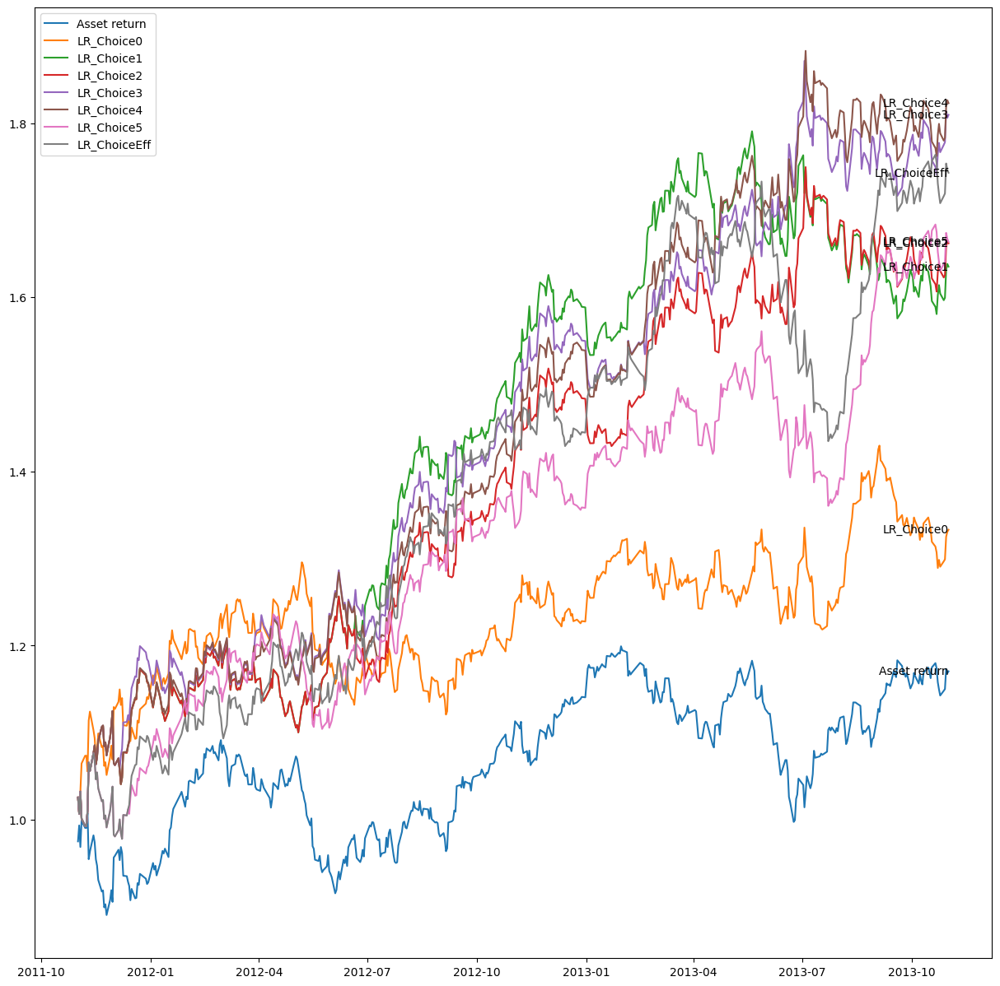

2013-11-01


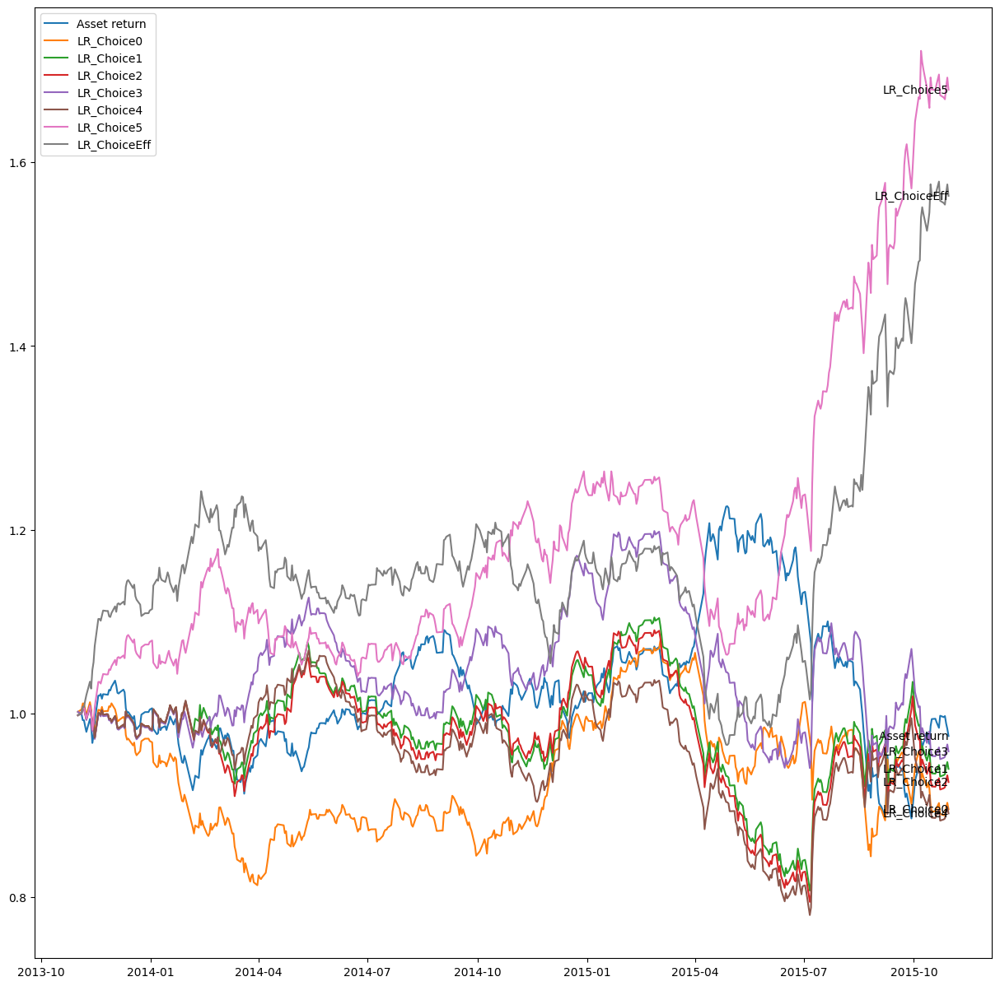

2015-11-01


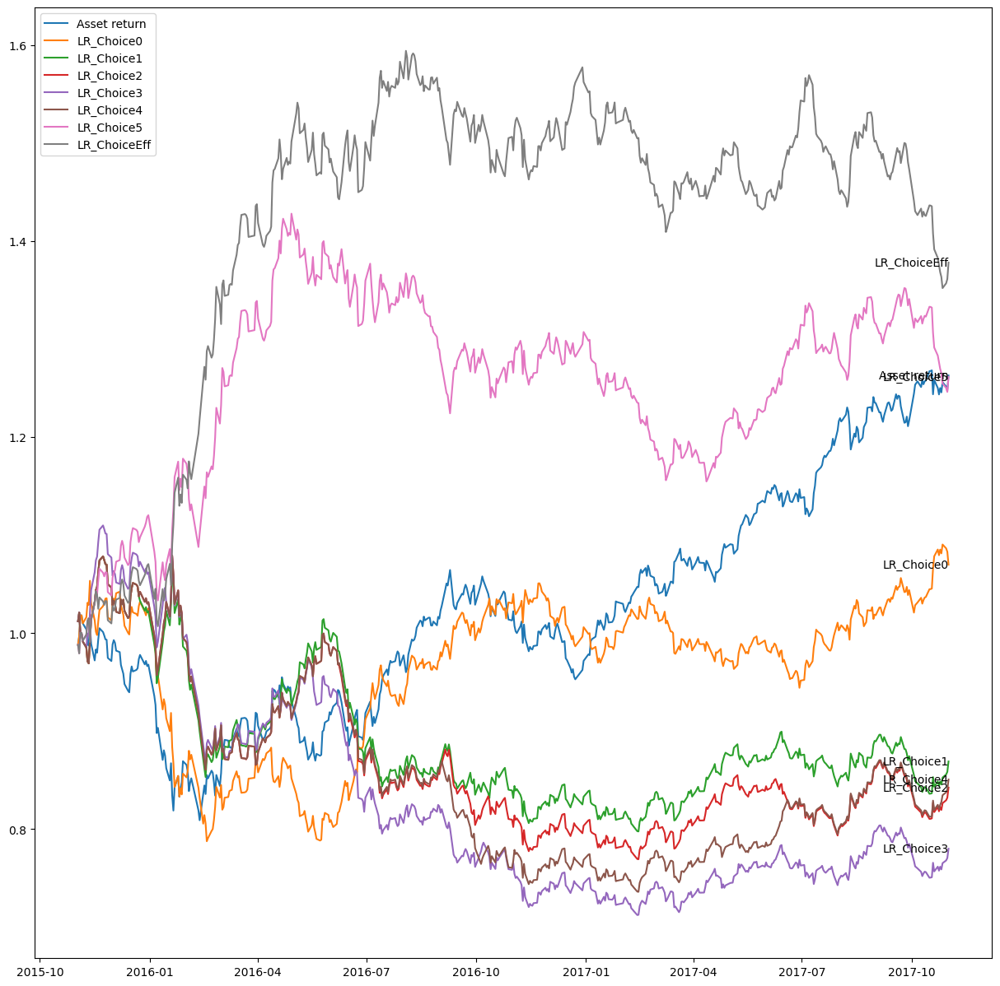

2017-11-01


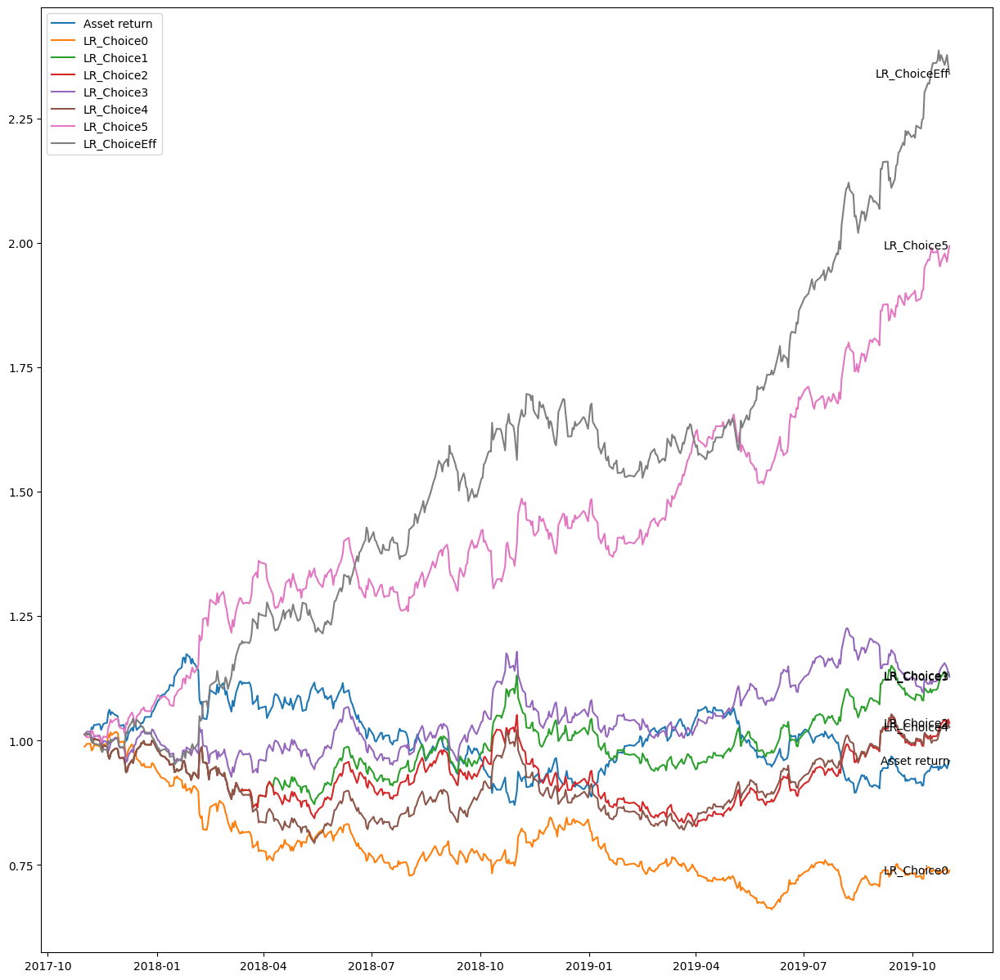

2019-11-01


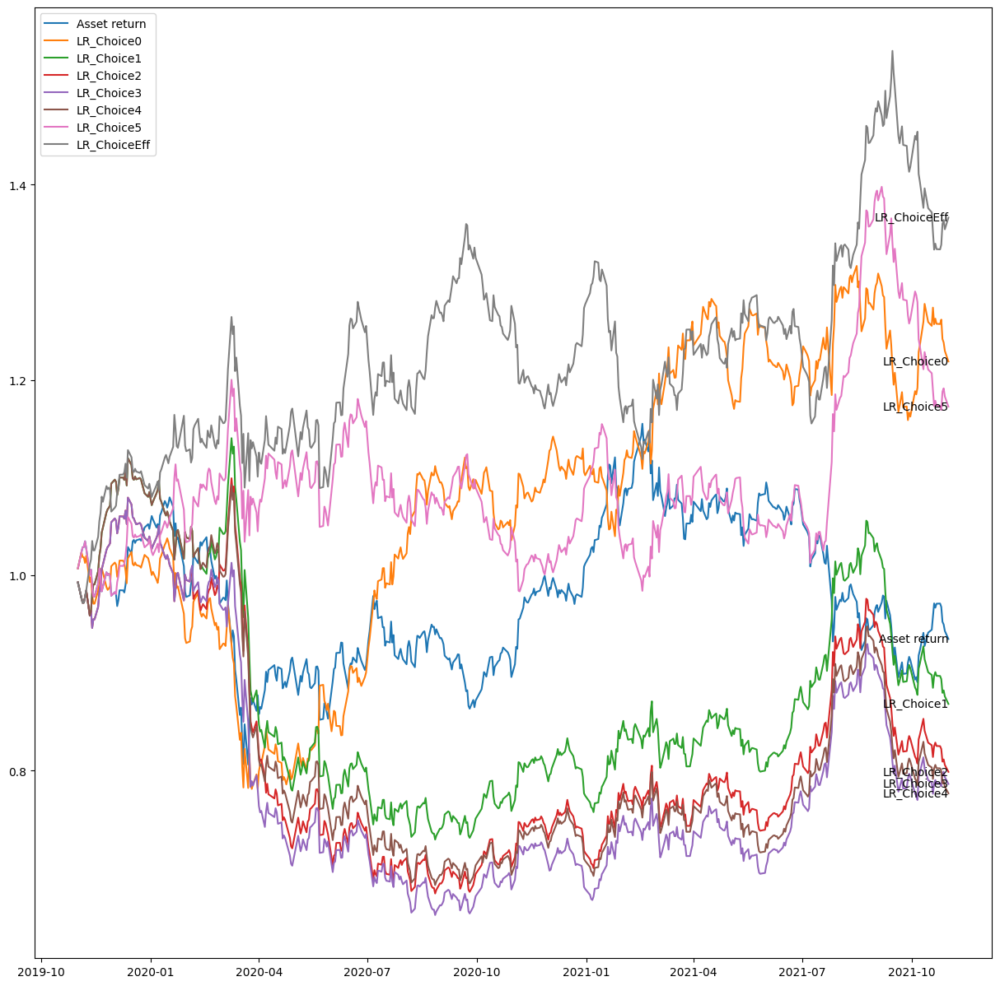

2021-11-01


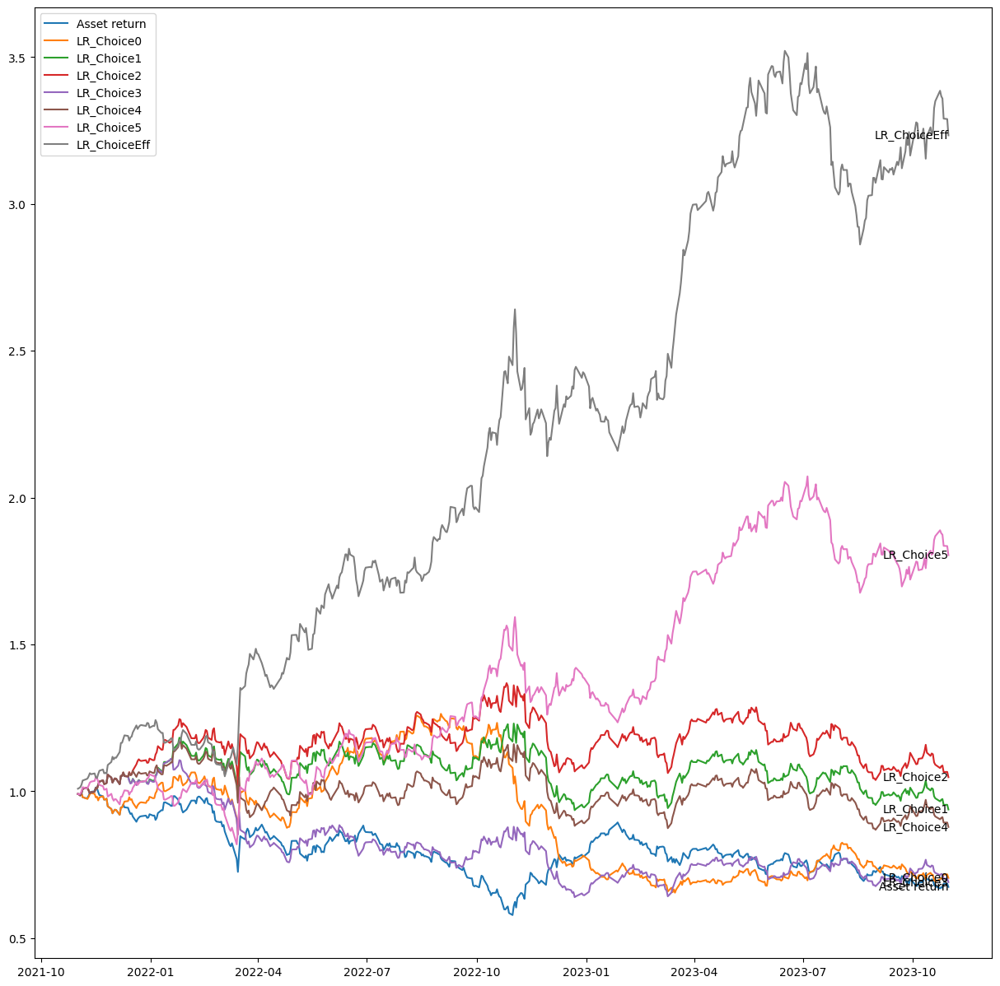

In [733]:
rolling_test_results = []
for i in range(len(rolling_test_tags)-1):

    rolling_test_start = rolling_test_tags[i]
    rolling_test_end = rolling_test_tags[i+1]
    print(rolling_test_tags[i])
    rolling_test_result =\
        select_feature(model_choice,
                        X_choices,
                        data.iloc[:, 0],
                        data.iloc[:, 2:],
                        [traing_start,
                         traing_end,
                         rolling_test_start,
                         rolling_test_end])
    
    rolling_test_result\
        .set_index(pd\
                   .Index([item + f"_test{i}" 
                           for item in list(rolling_test_result.index)]),
                   inplace = True) 
    
    rolling_test_results += [rolling_test_result]

In [734]:
rolling_test_results = pd.concat(rolling_test_results)
rolling_test_results

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return_test0,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
LR_Choice0_test0,15.437295,0.843342,1.318875,-13.501678,-17493.890004,255,1.333101,256,236,52.032520
LR_Choice1_test0,27.837229,1.438658,2.188885,-12.005716,-21498.983668,164,1.635336,263,229,53.455285
LR_Choice2_test0,28.876745,1.485786,2.272832,-8.327811,-14297.894731,119,1.662076,263,229,53.455285
LR_Choice3_test0,34.468069,1.734055,2.691321,-8.287052,-15509.818775,120,1.809634,263,229,53.455285
LR_Choice4_test0,34.964369,1.755867,2.715416,-7.831506,-12799.817749,119,1.823035,269,223,54.674797
LR_Choice5_test0,28.948204,1.488681,2.298144,-12.850178,-20059.816662,95,1.663923,264,228,53.658537
LR_ChoiceEff_test0,31.977141,1.625095,2.482920,-17.212254,-29829.392459,99,1.743121,268,224,54.471545
Asset return_test1,-1.231093,0.009525,0.013301,-27.726399,-33982.698210,233,0.975596,249,243,50.609756
LR_Choice0_test1,-5.365472,-0.240693,-0.328157,-21.740372,-23462.763113,435,0.895840,244,248,49.593496


> Fixed testing set:

In [735]:
fixed_test_start = '2021-11-01'
fixed_test_end = '2023-11-01'

rolling_train1 = '2001-11-01'
rolling_train2 = '2003-11-01'
rolling_train3 = '2005-11-01'
rolling_train4 = '2007-11-01'
rolling_train5 = '2009-11-01'
rolling_train6 = '2011-11-01'

rolling_train_end1 = '2011-11-01'
rolling_train_end2 = '2013-11-01'
rolling_train_end3 = '2015-11-01'
rolling_train_end4 = '2017-11-01'
rolling_train_end5 = '2019-11-01'
rolling_train_end6 = '2021-11-01'

rolling_train_tags =\
    [rolling_train1, rolling_train2, rolling_train3, 
     rolling_train4, rolling_train5, rolling_train6]
rolling_train_end_tags =\
    [rolling_train_end1, rolling_train_end2, rolling_train_end3, 
     rolling_train_end4, rolling_train_end5, rolling_train_end6]

2011-11-01


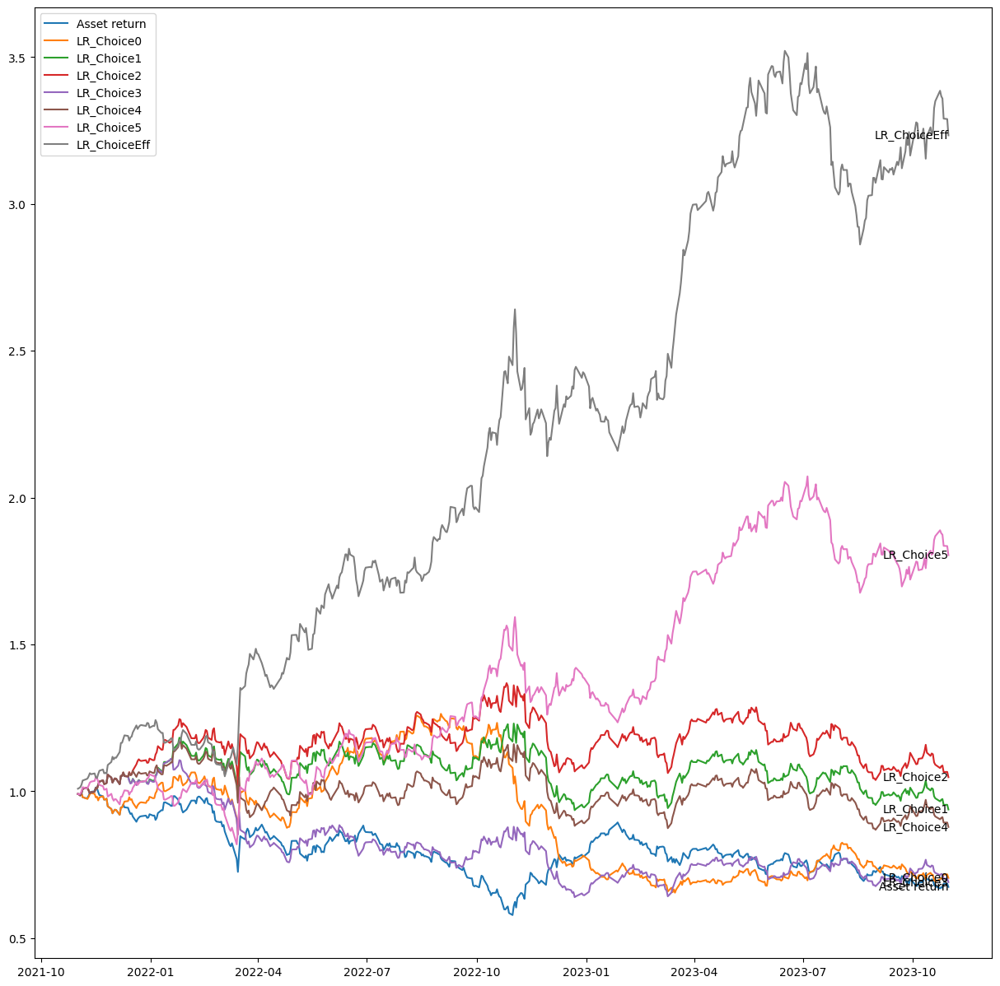

2013-11-01


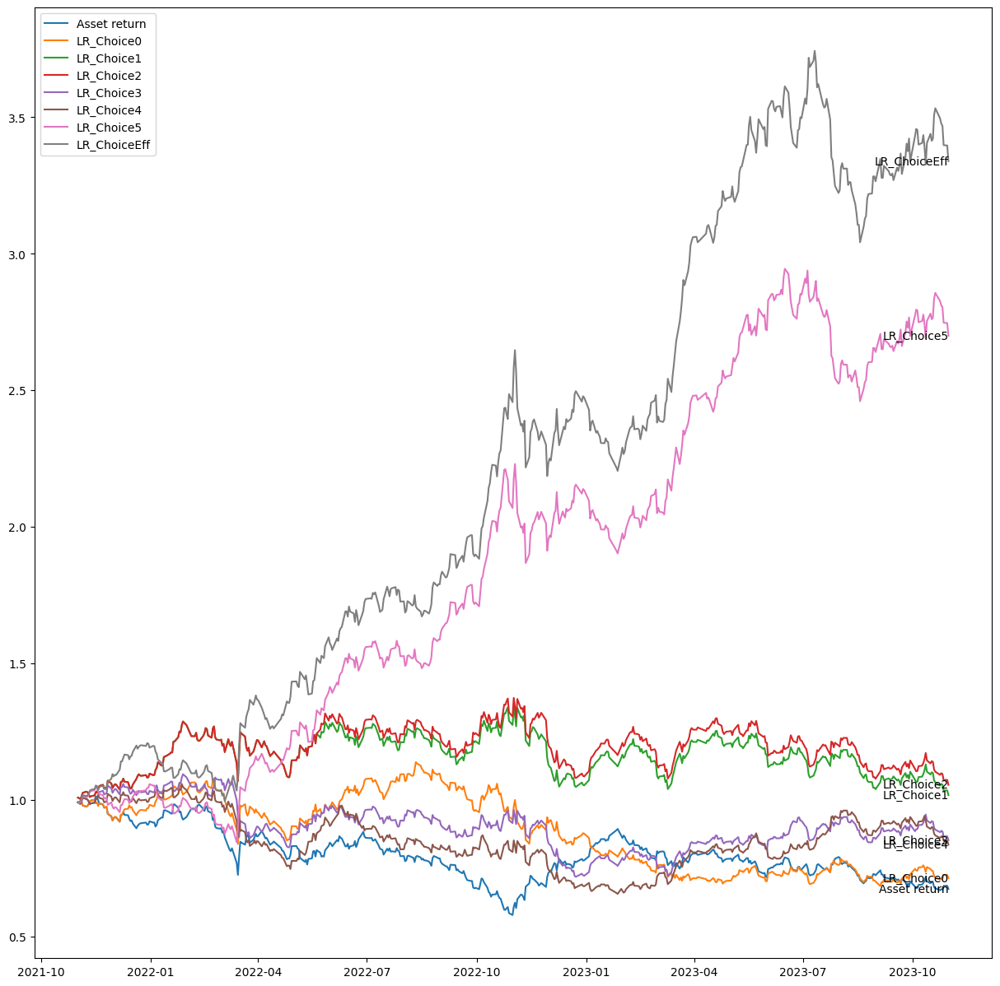

2015-11-01


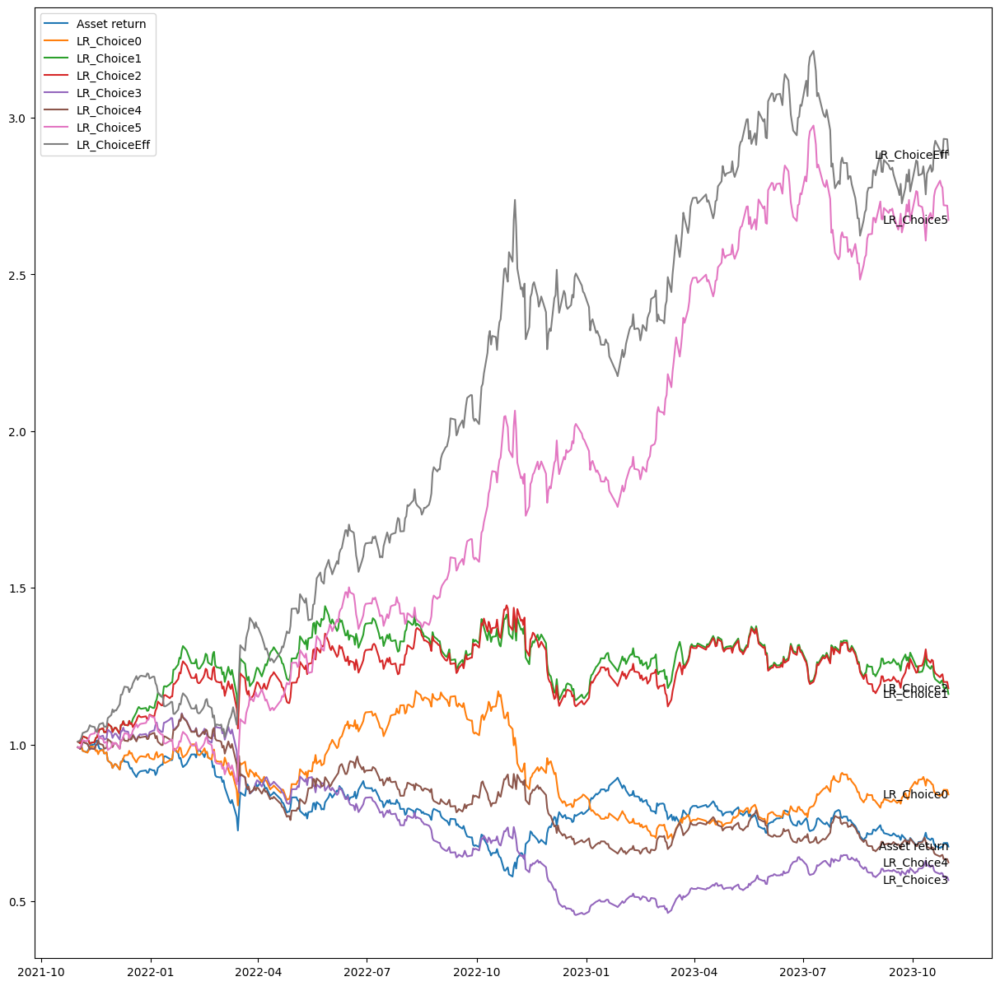

2017-11-01


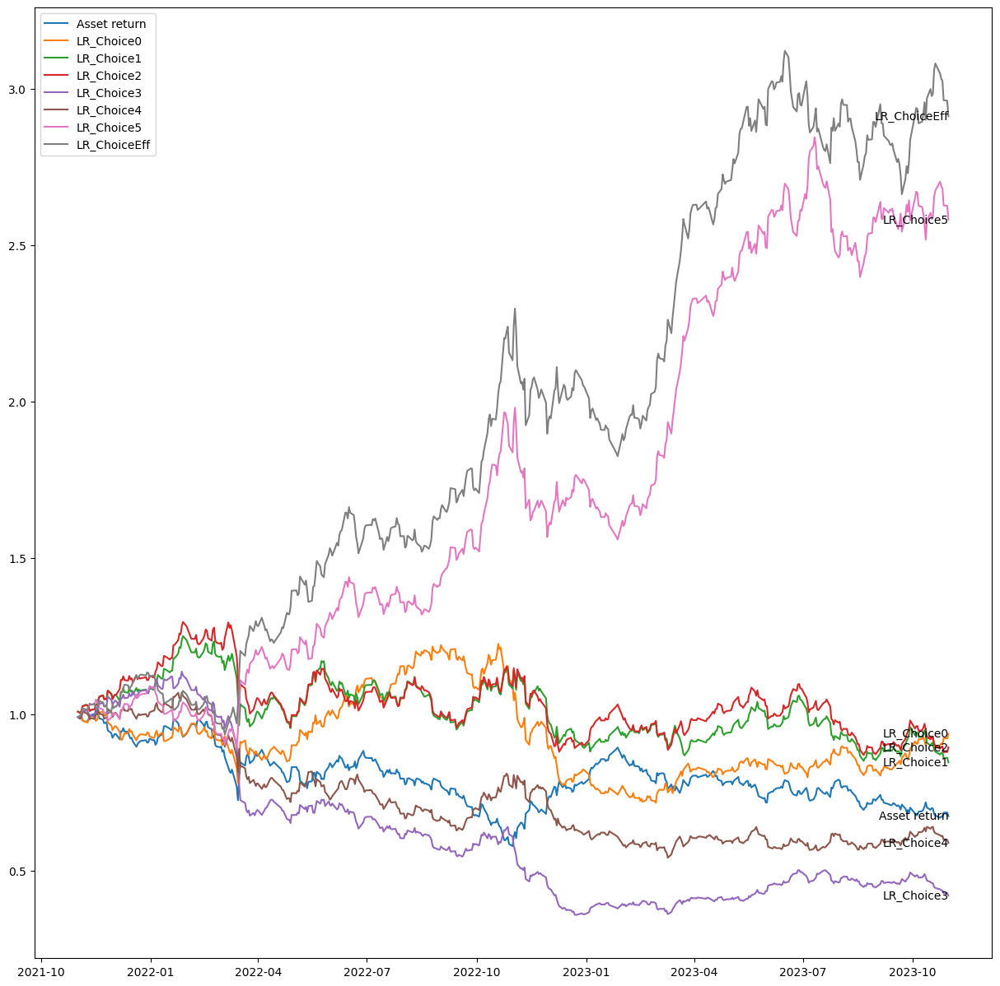

2019-11-01


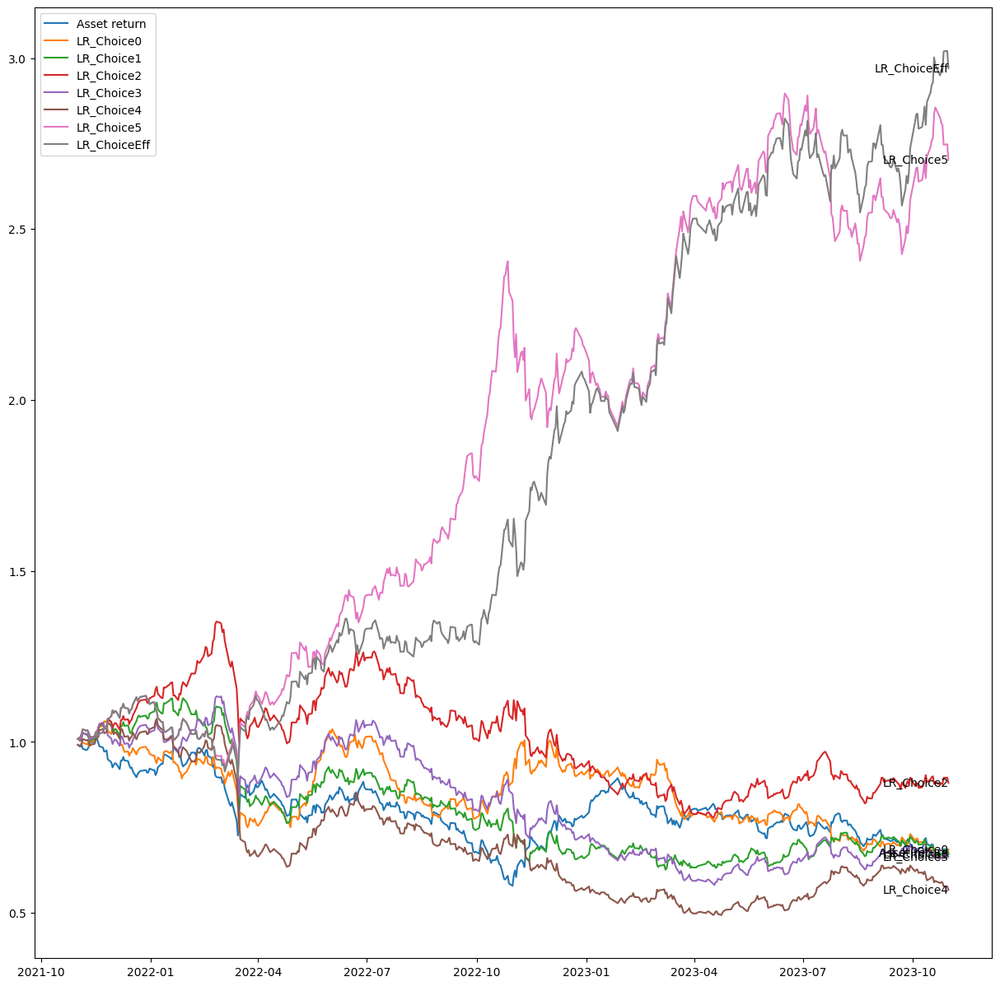

2021-11-01


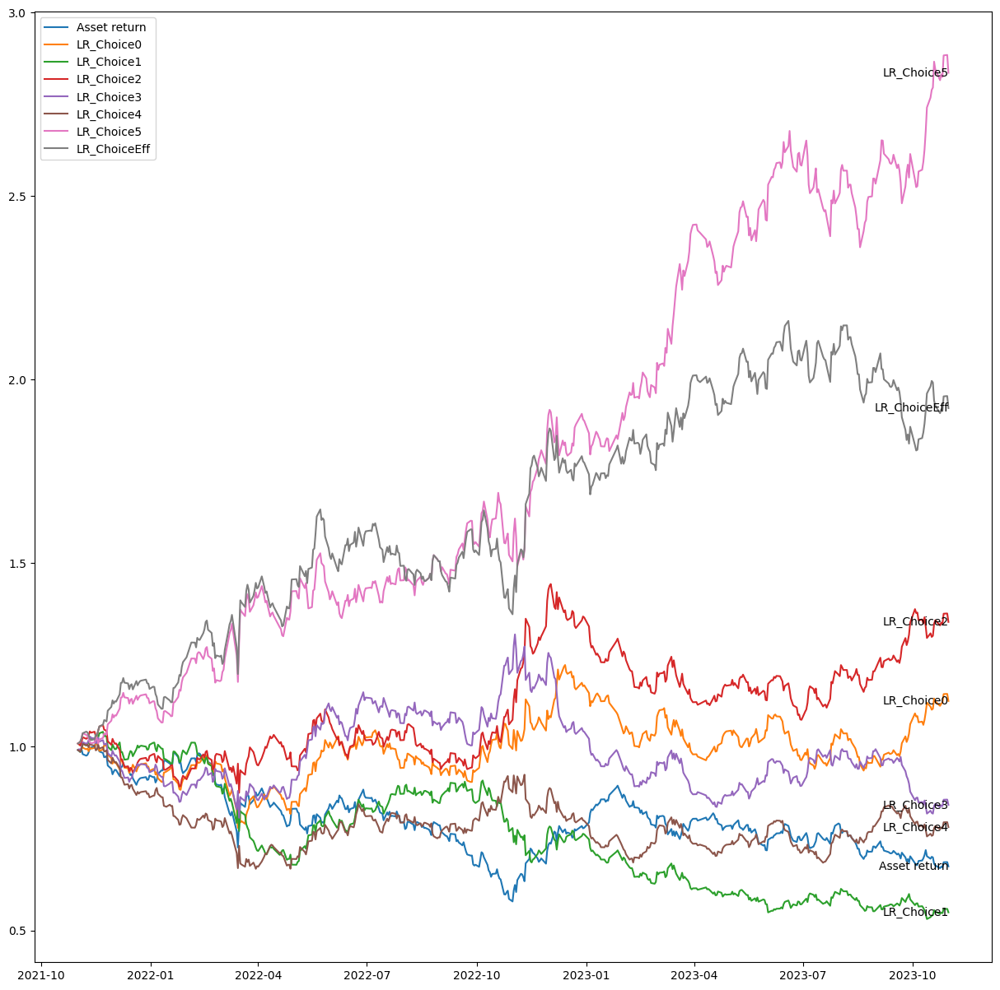

In [736]:
rolling_train_results = []
for i in range(len(rolling_train_tags)):
    
    print(rolling_train_end_tags[i])
    rolling_train_start = rolling_train_tags[i]
    rolling_train_end = rolling_train_end_tags[i]
    rolling_train_result =\
        select_feature(model_choice,
                        X_choices,
                        data.iloc[:, 0],
                        data.iloc[:, 2:],
                        [rolling_train_start,
                         rolling_train_end,
                         fixed_test_start,
                         fixed_test_end])
    
    rolling_train_result\
        .set_index(pd\
                   .Index([item + f"_train{i}" \
                           for item in list(rolling_train_result.index)]),
                   inplace = True) 
    
    rolling_train_results += [rolling_train_result]    

In [737]:
rolling_train_results = pd.concat(rolling_train_results)
rolling_train_results

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return_train0,-17.904961,-0.577359,-0.863089,-42.882688,-43451.374790,713,0.674324,230,262,46.747967
LR_Choice0_train0,-16.046711,-0.497470,-0.693159,-48.182627,-60895.513600,424,0.705153,243,249,49.390244
LR_Choice1_train0,-3.151450,0.034673,0.051108,-23.964207,-29495.970272,363,0.938046,243,249,49.390244
LR_Choice2_train0,2.379317,0.240677,0.356850,-24.111670,-32994.229526,369,1.048085,246,246,50.000000
LR_Choice3_train0,-16.909966,-0.535580,-0.751752,-42.432439,-47142.714282,650,0.690746,233,259,47.357724
LR_Choice4_train0,-6.273315,-0.087216,-0.124982,-25.744262,-30125.872506,643,0.878625,242,250,49.186992
LR_Choice5_train0,34.366588,1.251775,1.924330,-22.577492,-39639.752215,134,1.803977,266,226,54.065041
LR_ChoiceEff_train0,79.959706,2.319124,3.744597,-18.929650,-65923.700000,137,3.233340,282,210,57.317073
Asset return_train1,-17.904961,-0.577359,-0.863089,-42.882688,-43451.374790,713,0.674324,230,262,46.747967
LR_Choice0_train1,-15.531360,-0.473768,-0.675976,-39.891770,-45430.771837,445,0.713825,239,253,48.577236


#### From the above testing, a rolling model makes a little improvement on results. However, rolling model is a good way to reduce survivor bias. Thus, it is still recommended if such option is feasible.

## <a id = "p4">4. </a> <font color = "green"> Top Strategy (ML) </font>  [back to table of contents](#top)

Sensible features will boost the performance, while noise features will reduce the performance. Nevertheless, from the performance metrics table  above we can see most of the relative features set will result in beating the market in the backtest.

In [738]:
deploy_test

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,-2.999449,-0.050424,-0.071336,-55.700772,-79577.729073,2101,0.737404,1263,1198,51.320601
LR_Choice0,-3.229324,-0.062413,-0.087264,-45.035005,-52561.877946,2717,0.720110,1248,1213,50.711093
LR_Choice1,-3.369486,-0.069403,-0.099949,-48.211720,-51761.269568,3457,0.709745,1194,1267,48.516863
LR_Choice2,-4.211234,-0.113054,-0.162326,-47.374140,-50862.022743,3457,0.650271,1191,1270,48.394961
LR_Choice3,-4.641926,-0.135698,-0.192578,-55.996230,-66700.417257,3168,0.621610,1200,1261,48.760666
LR_Choice4,-4.757597,-0.139868,-0.198980,-49.919013,-56928.781168,2951,0.614109,1196,1265,48.598131
LR_Choice5,34.218804,1.573837,2.471939,-25.496720,-326352.031636,617,18.988201,1322,1139,53.718001
LR_ChoiceEff,32.650090,1.515716,2.413281,-20.628074,-367587.105242,702,16.881526,1296,1165,52.661520


> recall on feature choices:

In [739]:
for key, value in X_choices.items():
    print (key, value)

Choice0 ['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'Const']
Choice1 ['lag_4', '0005.HK', '0001.HK', '0293.HK', '^N225', '^TNX', 'Const']
Choice2 ['lag_4', 'lag_6', '0005.HK', '0001.HK', '0293.HK', '^N225', '^TNX', 'Const']
Choice3 ['lag_4', 'lag_6', '0005.HK', '0001.HK', '0293.HK', '0003.HK', '^TNX', 'Const']
Choice4 ['lag_1', 'lag_2', 'lag_4', 'lag_6', '0005.HK', '0001.HK', '0293.HK', '0003.HK', '^N225', '^TNX', 'Const']
Choice5 ['lag_3', '0005.HK_6DT', '0003.HK_6DT', '0005.HK_12DT', '0003.HK_12DT', 'DEXJPUS', 'DEXUSUK', '^VIX', '^SPX', '^VIX_3DT', '^N225_3DT', '^TNX_3DT', '^SPX_3DT', '000001.SS_3DT', '^VIX_6DT', '^SPX_6DT', '^VIX_12DT', '^SPX_12DT', 'Const']
ChoiceEff ['lag_3', '0005.HK_6DT', '0003.HK_6DT', '0005.HK_12DT', '0003.HK_12DT', 'DEXJPUS', 'DEXUSUK', '^VIX', '^SPX', '^VIX_3DT', '^N225_3DT', '^TNX_3DT', '^SPX_3DT', '000001.SS_3DT', '^VIX_6DT', '^SPX_6DT', '^VIX_12DT', '^SPX_12DT', 'HSI_MA21', 'HSI_MA63', 'HSI_MA252', 'HSI_EMA10', 'HSI_EMA30', 'HSI_EMA200', 'Const

In [740]:
model_choice

('LR', LinearRegression())

Top strategy (LinearRegression):

1. Overall Best: Feature Choice5
2. Best Return: Feature Choice5
3. Least Drawdown: Feature ChoiceEff

> Fine tuning with threshold

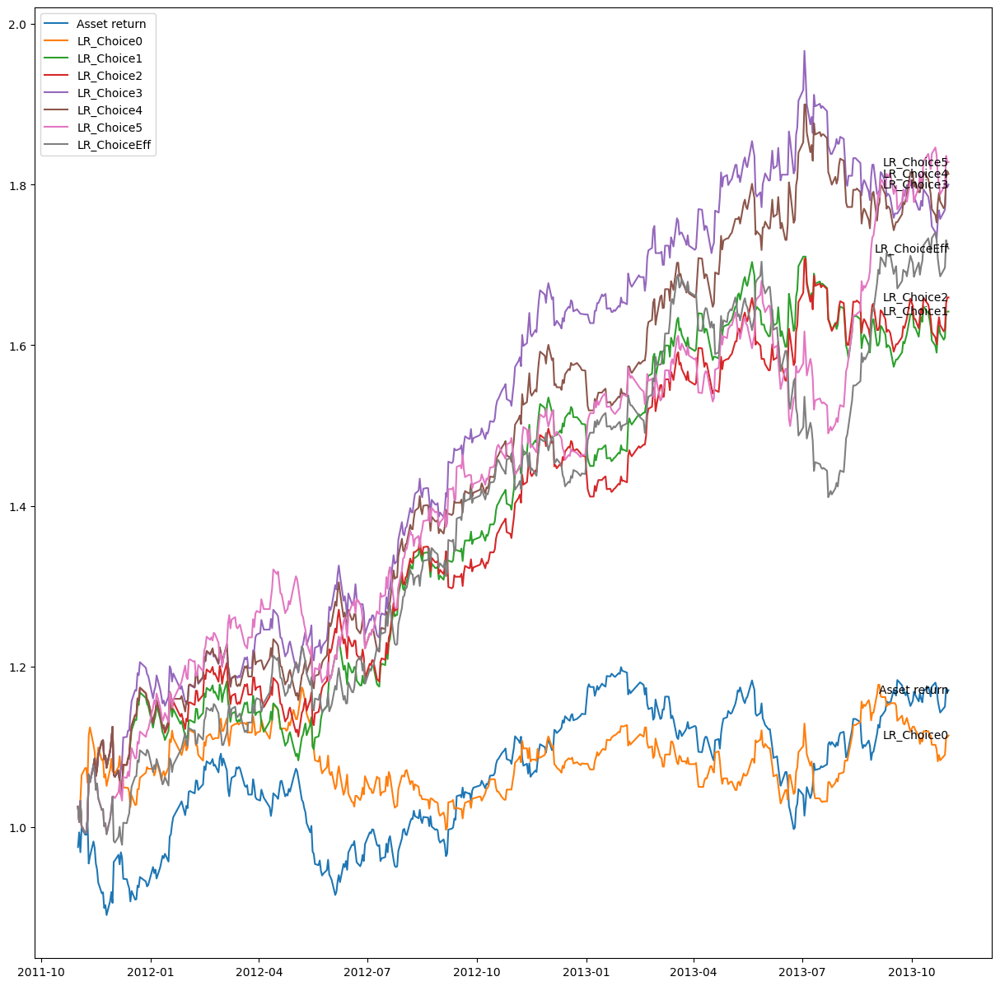

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
LR_Choice0,5.542032,0.338663,0.505342,-15.088278,-17709.466997,483,1.114077,217,206,51.300236
LR_Choice1,28.093202,1.505208,2.319667,-8.327811,-13718.995744,119,1.641900,246,214,53.478261
LR_Choice2,28.776464,1.513120,2.313625,-7.618984,-11566.251528,119,1.659487,252,212,54.310345
LR_Choice3,34.110556,1.772779,2.790516,-11.950008,-23500.351346,120,1.800011,246,211,53.829322
LR_Choice4,34.606039,1.795114,2.792004,-8.247810,-15669.290033,119,1.813354,255,209,54.956897
LR_Choice5,35.148252,1.810654,2.909414,-11.301574,-18988.692022,95,1.828013,261,220,54.261954
LR_ChoiceEff,31.110447,1.591687,2.427332,-17.212254,-29331.061983,99,1.720271,266,221,54.620123


In [741]:
feature_test_tuning =\
    select_feature(
        model_choice,
        X_choices,
        data.iloc[:, 0],
        data.iloc[:, 2:],
        [start, train1, test],
        1e5,
        np.log(1.0001)
)
feature_test_tuning

0


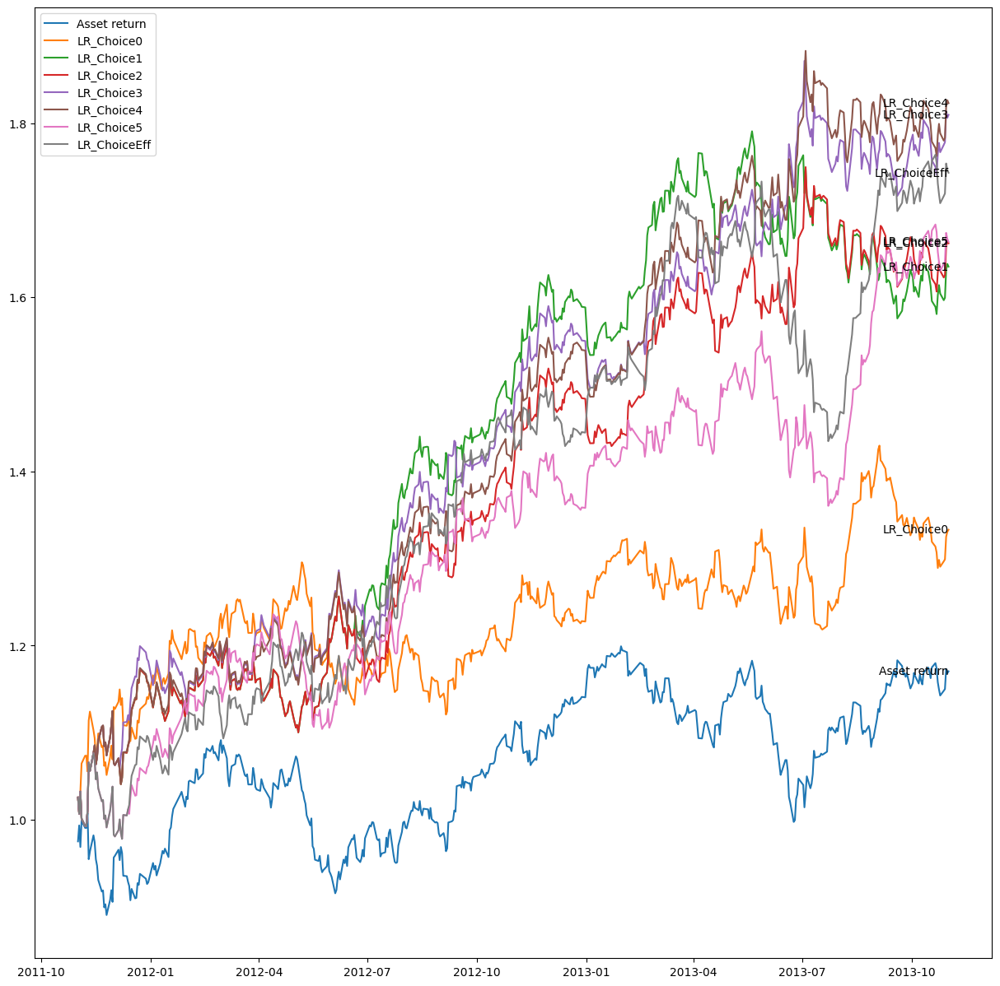

1


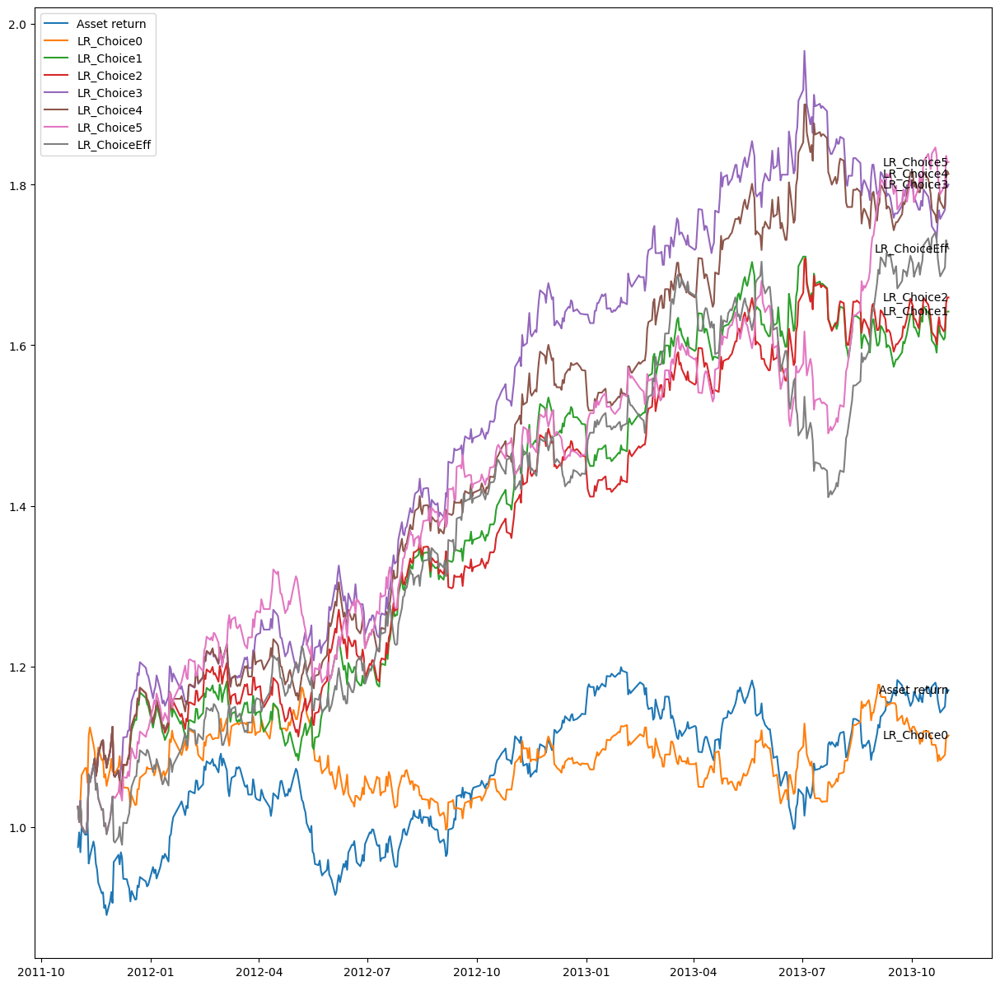

2


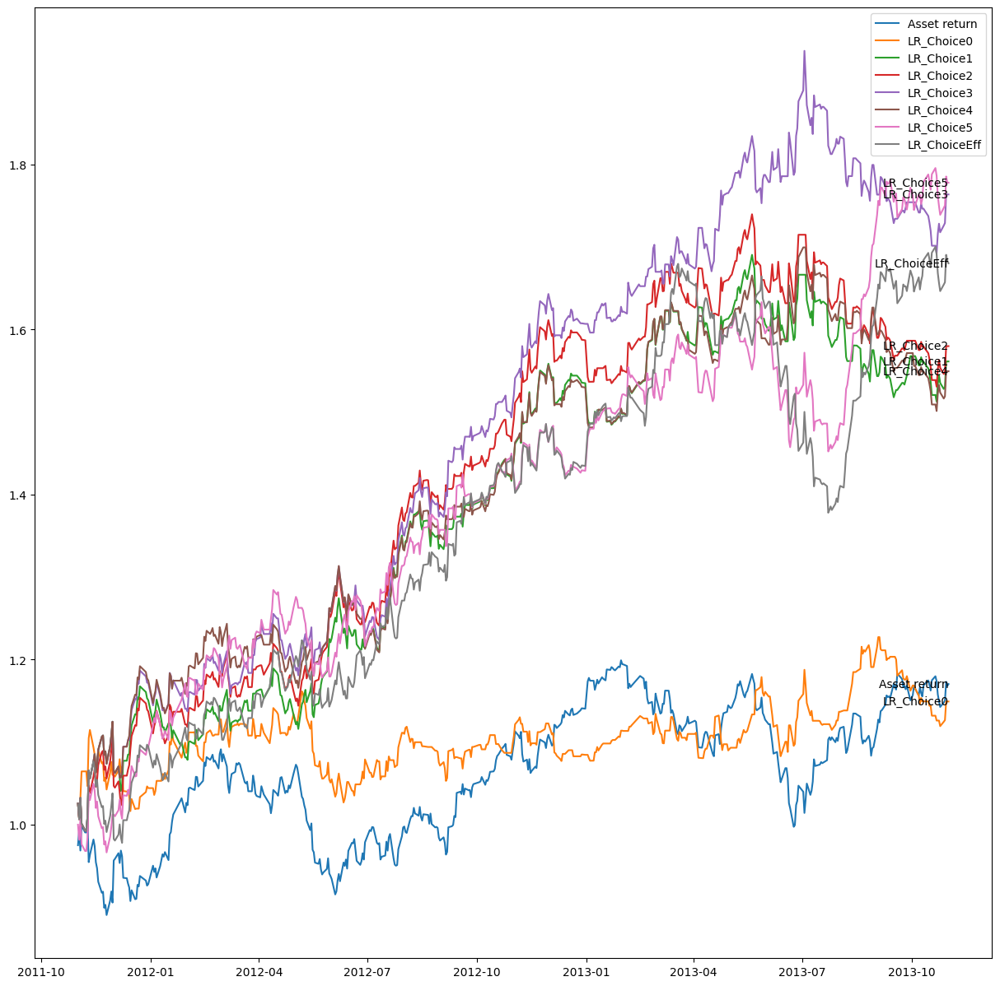

3


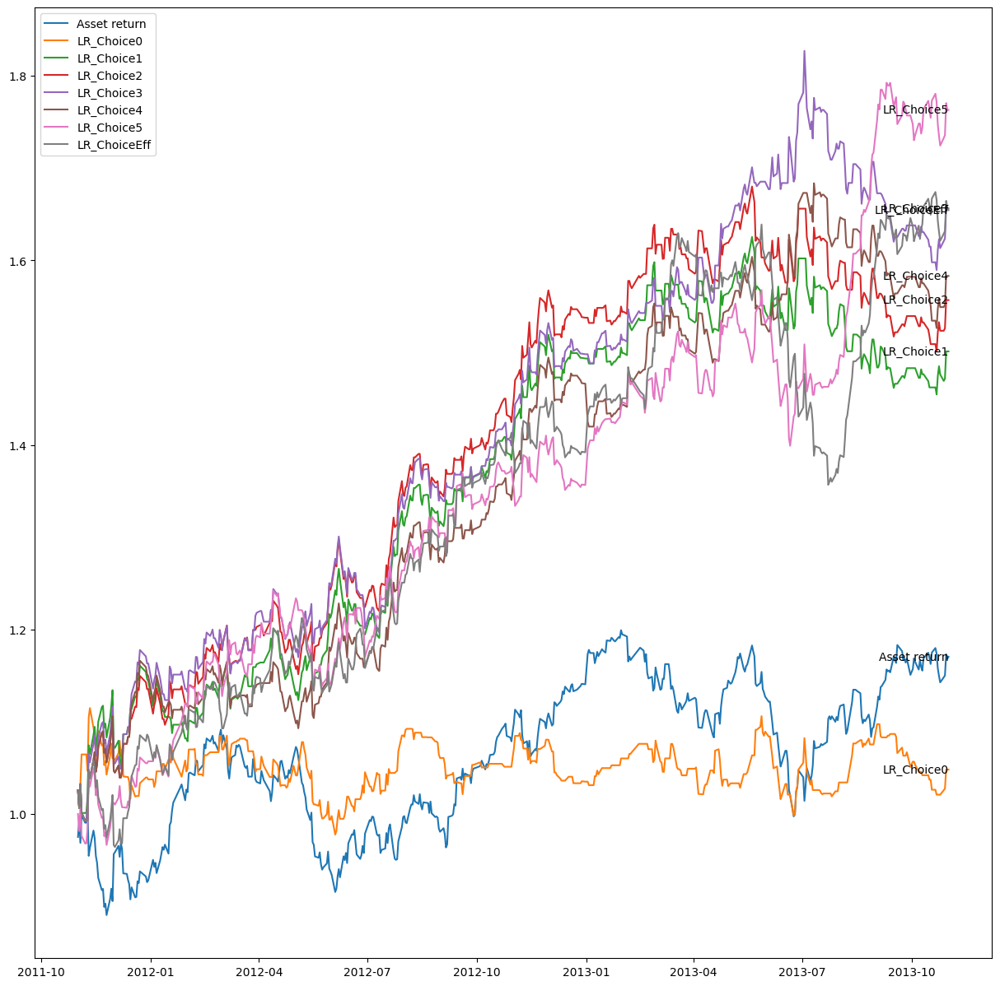

4


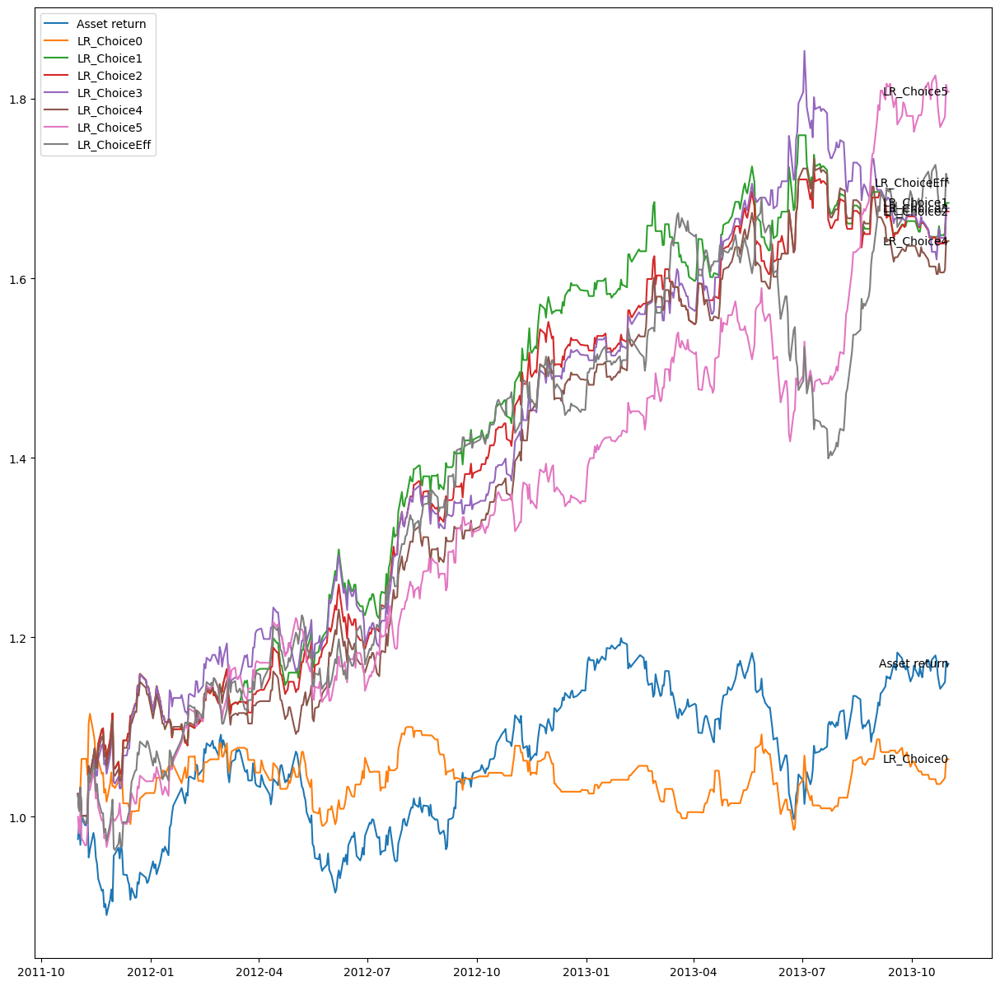

5


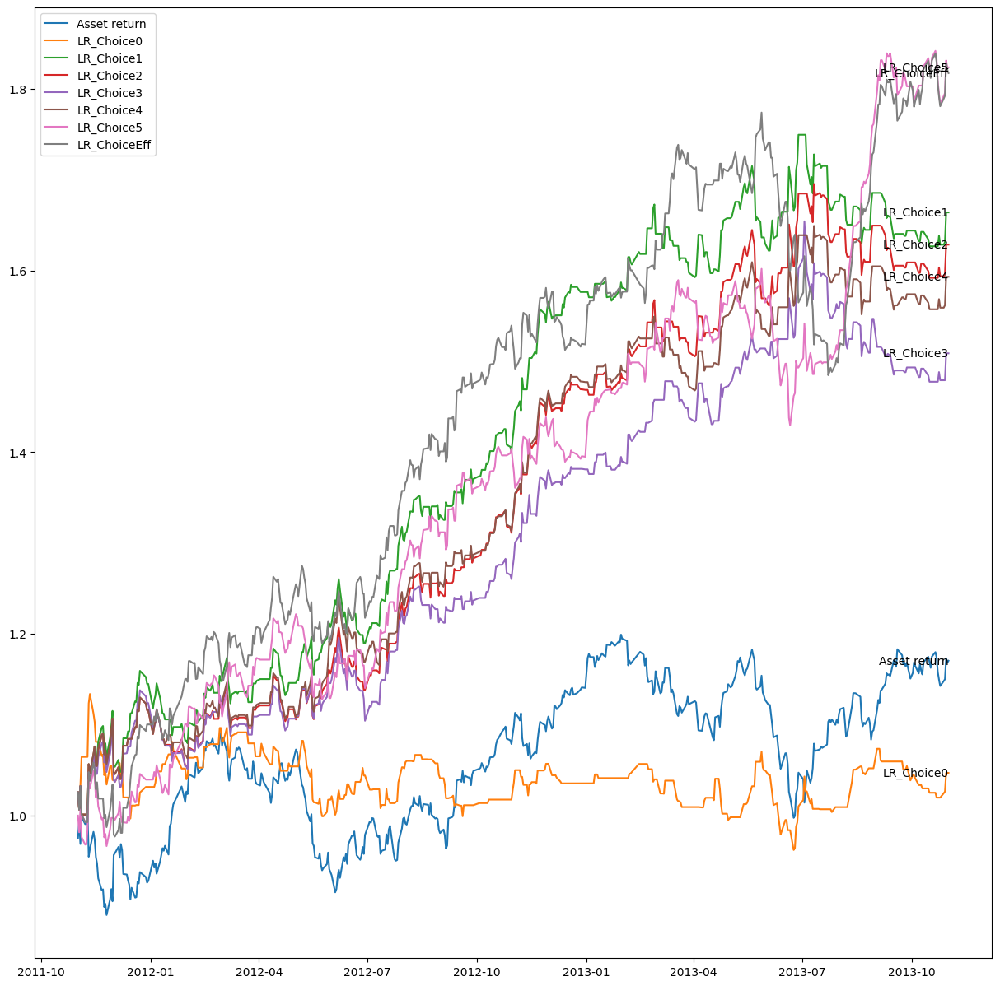

6


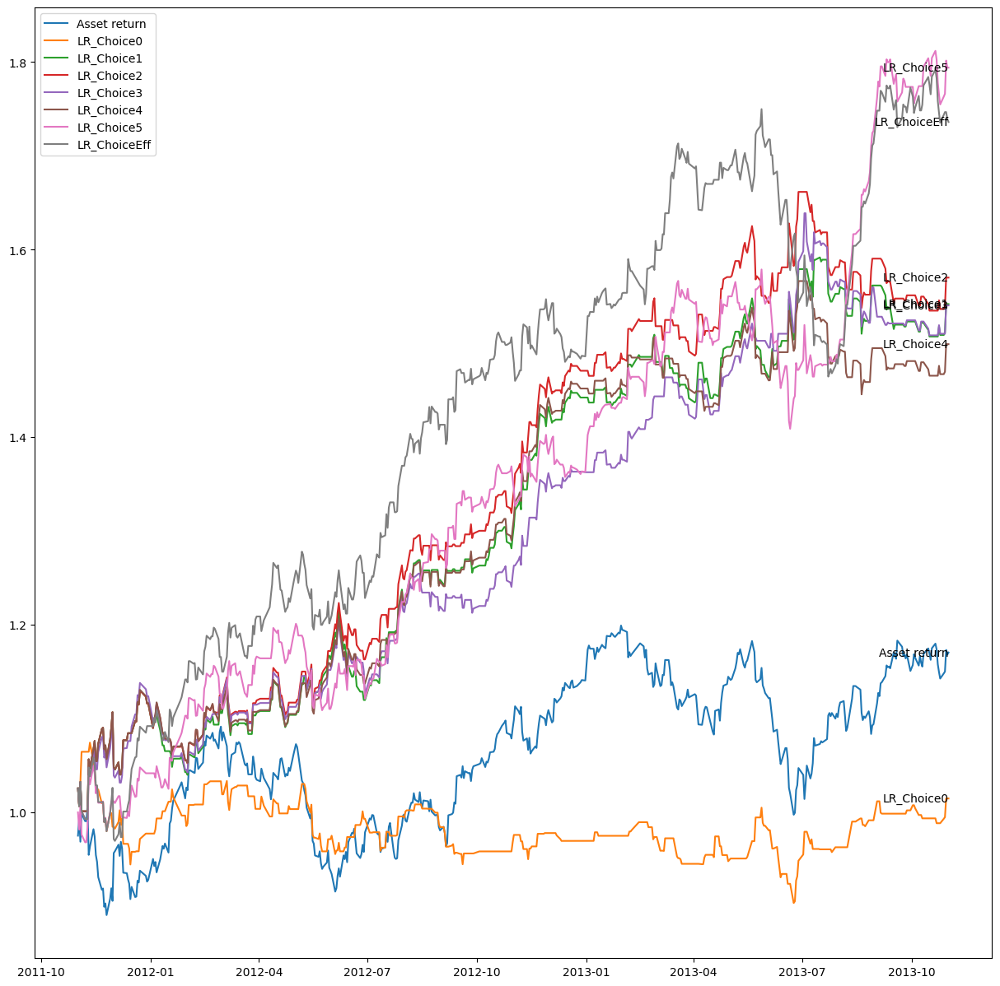

7


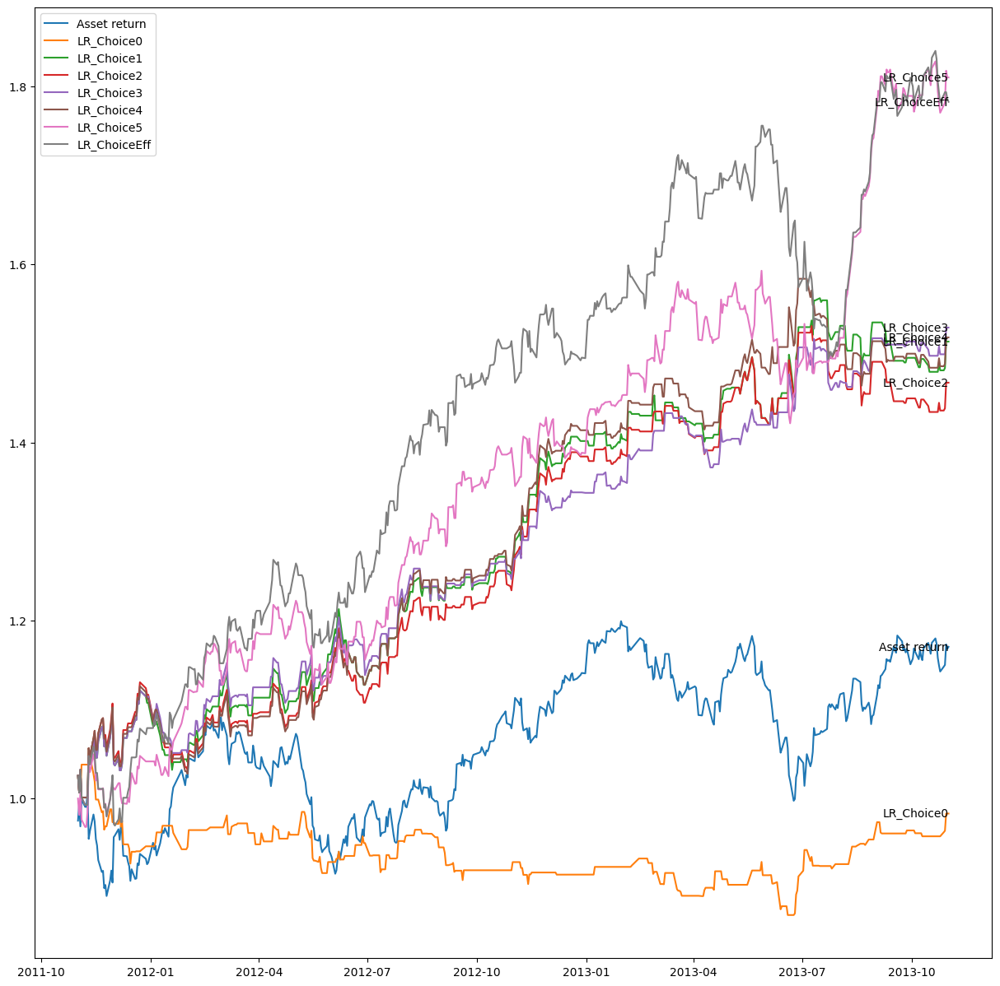

8


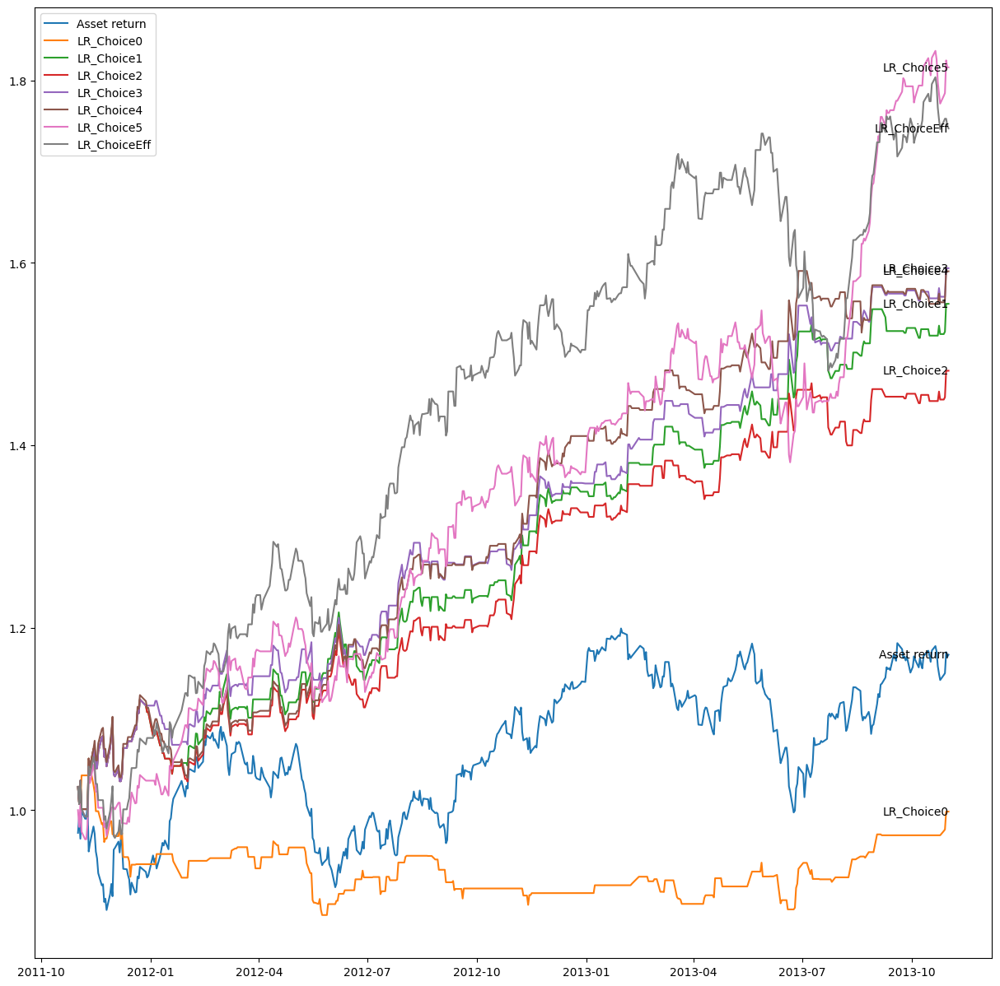

9


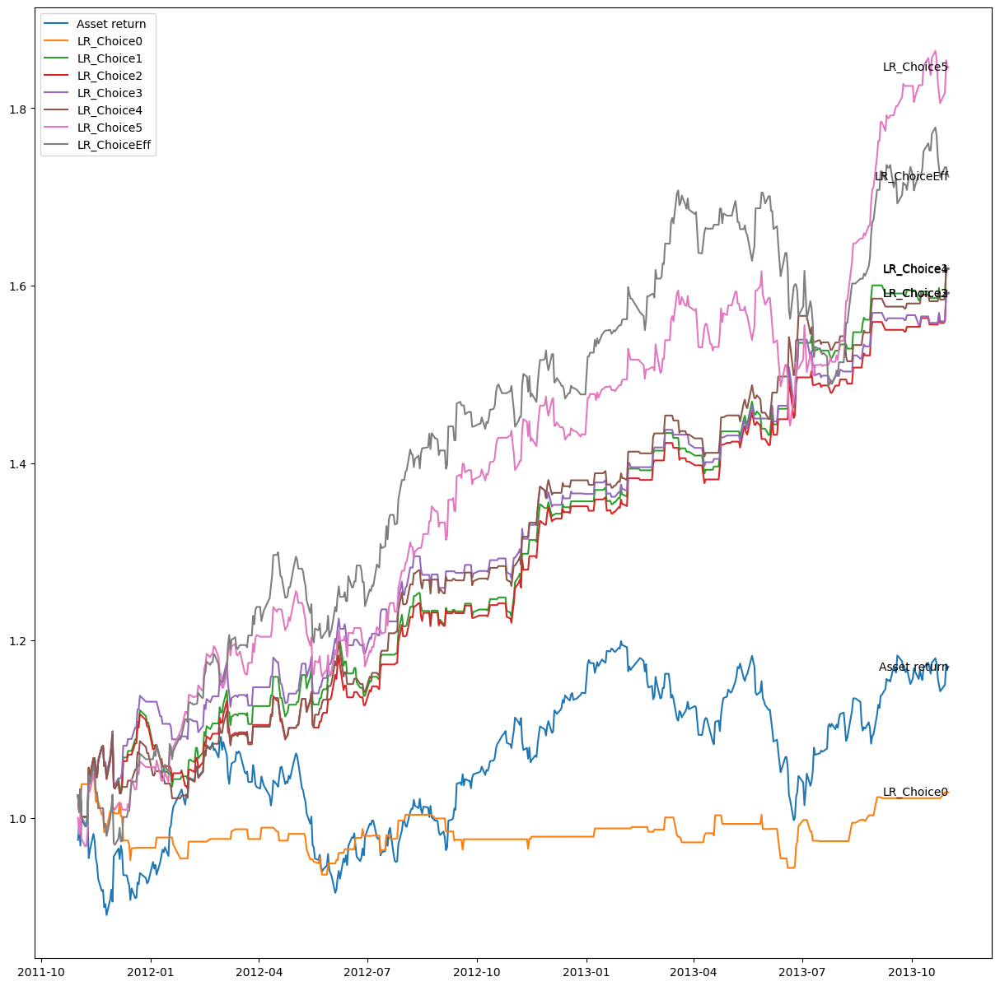

10


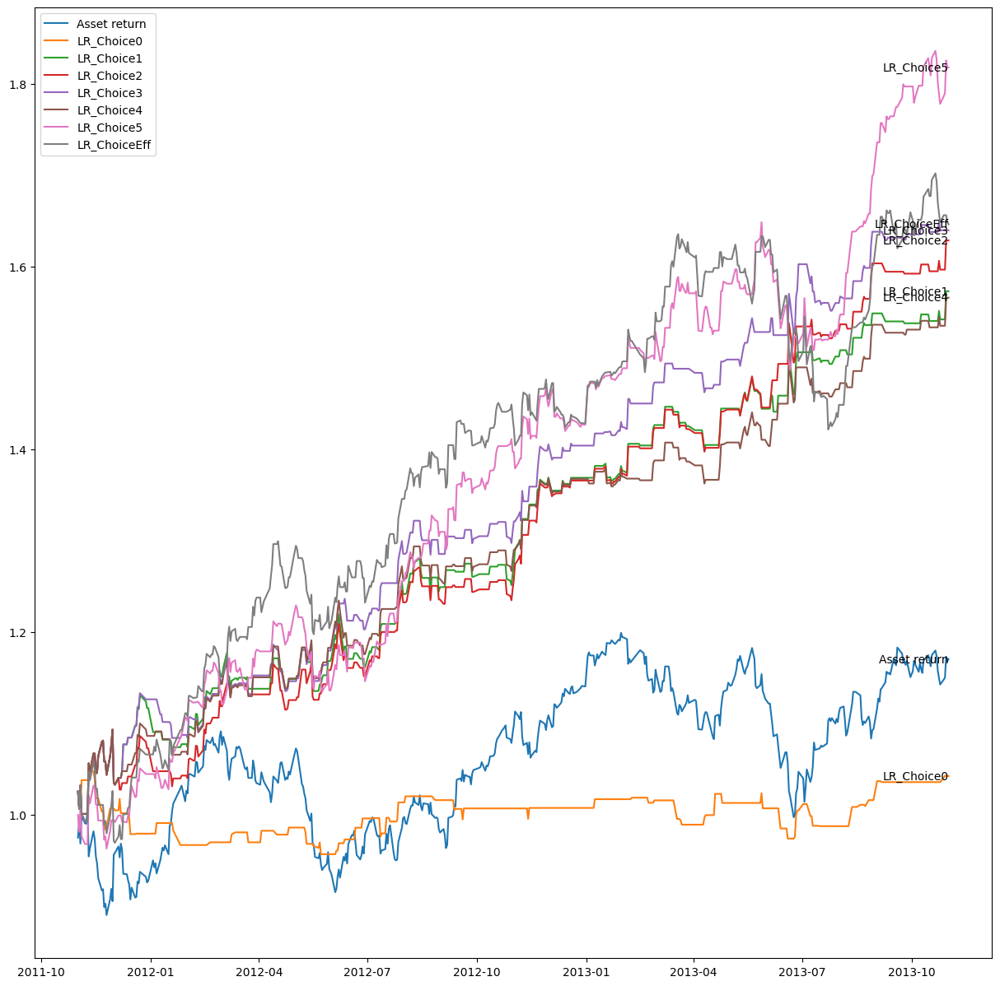

11


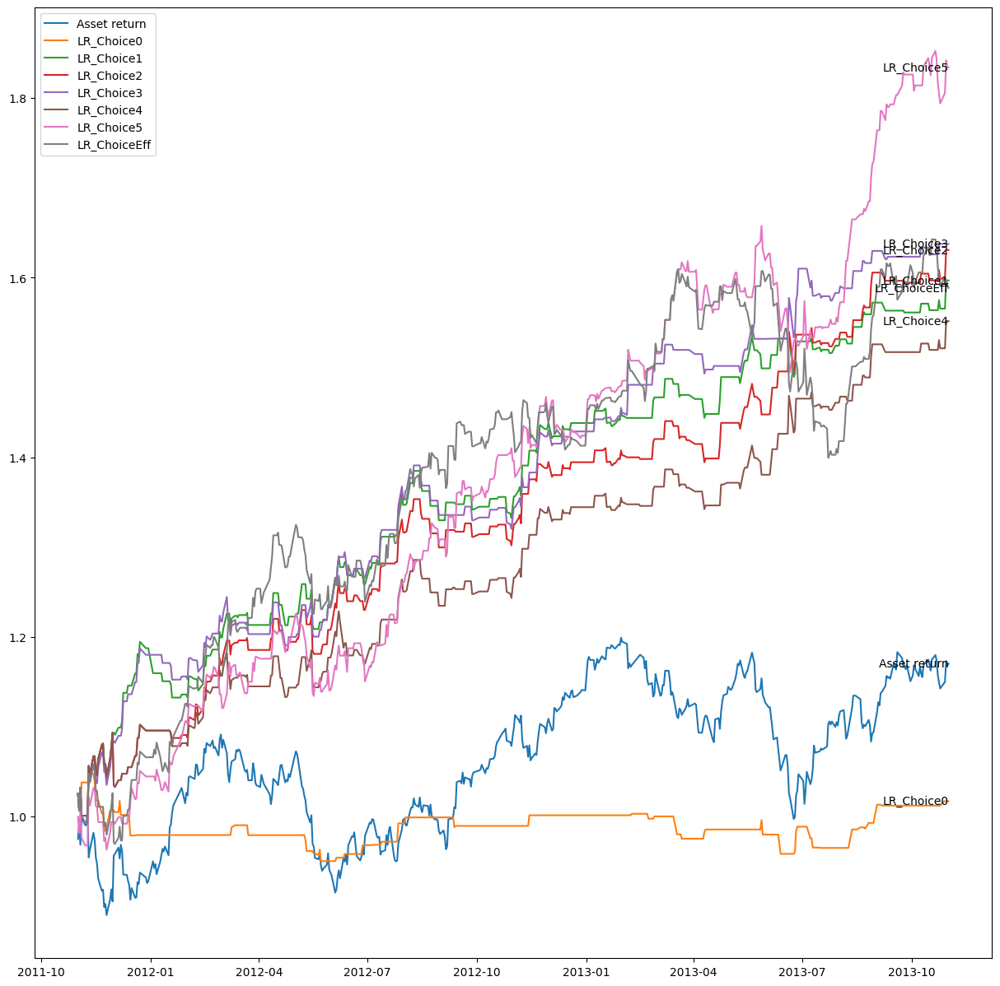

12


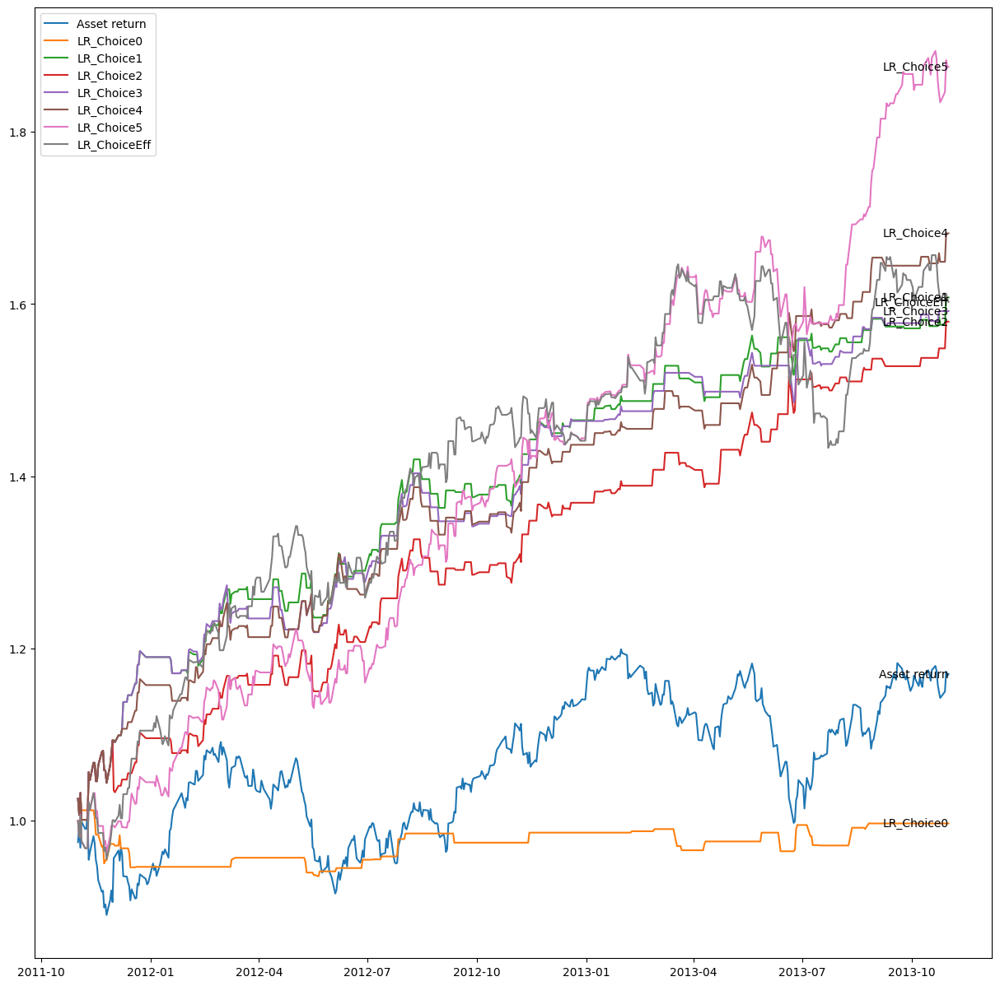

13


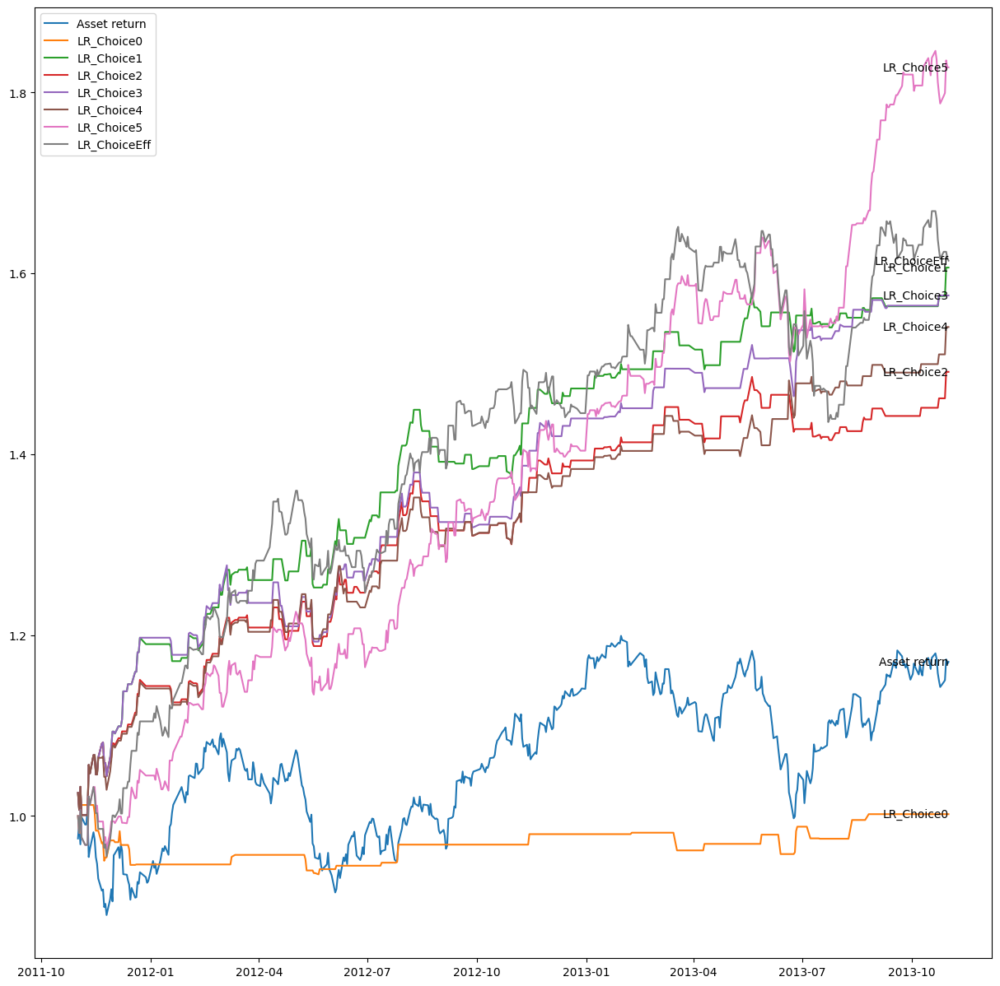

14


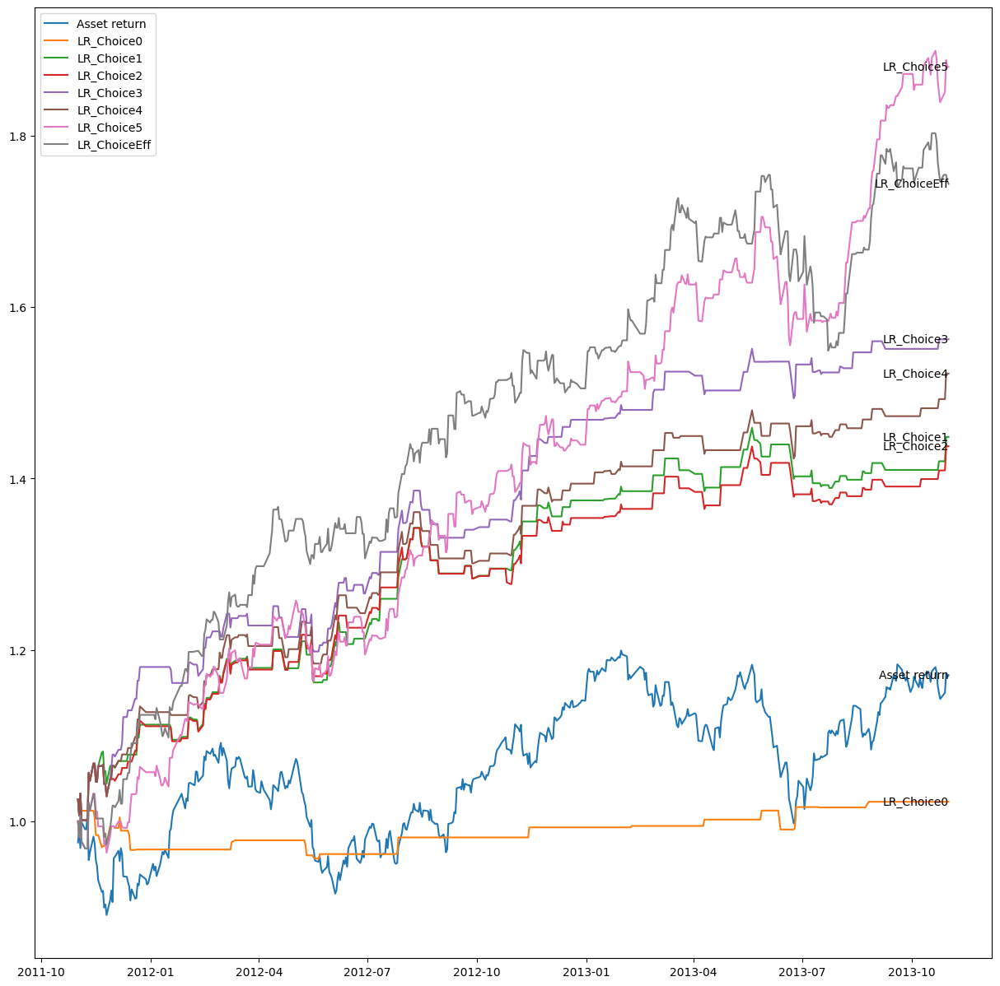

15


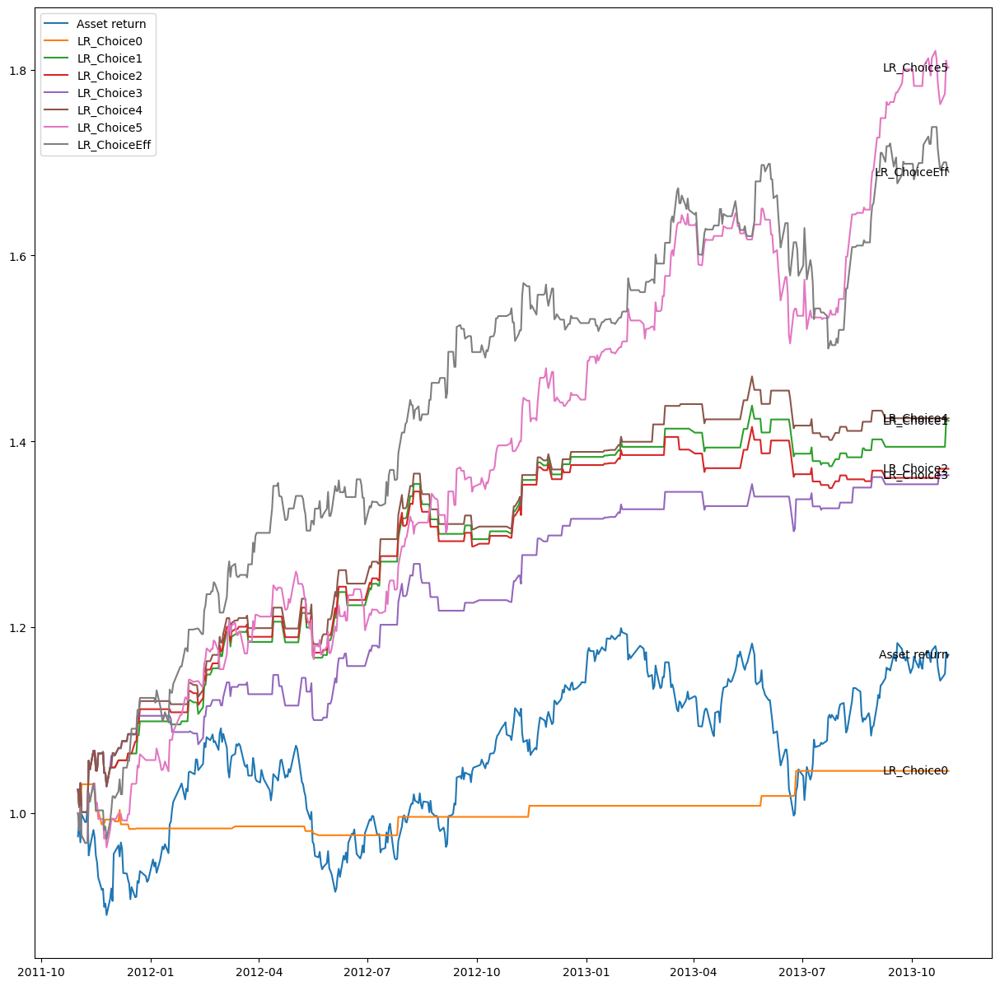

16


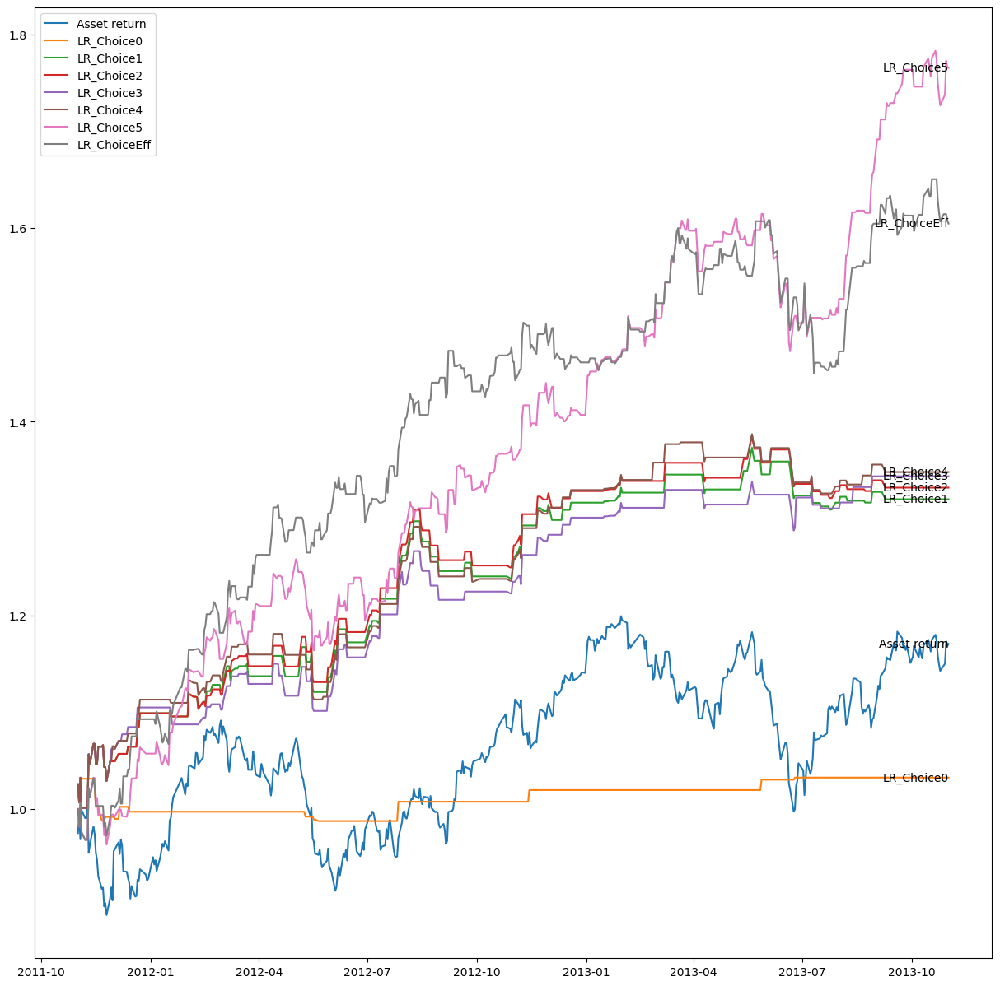

17


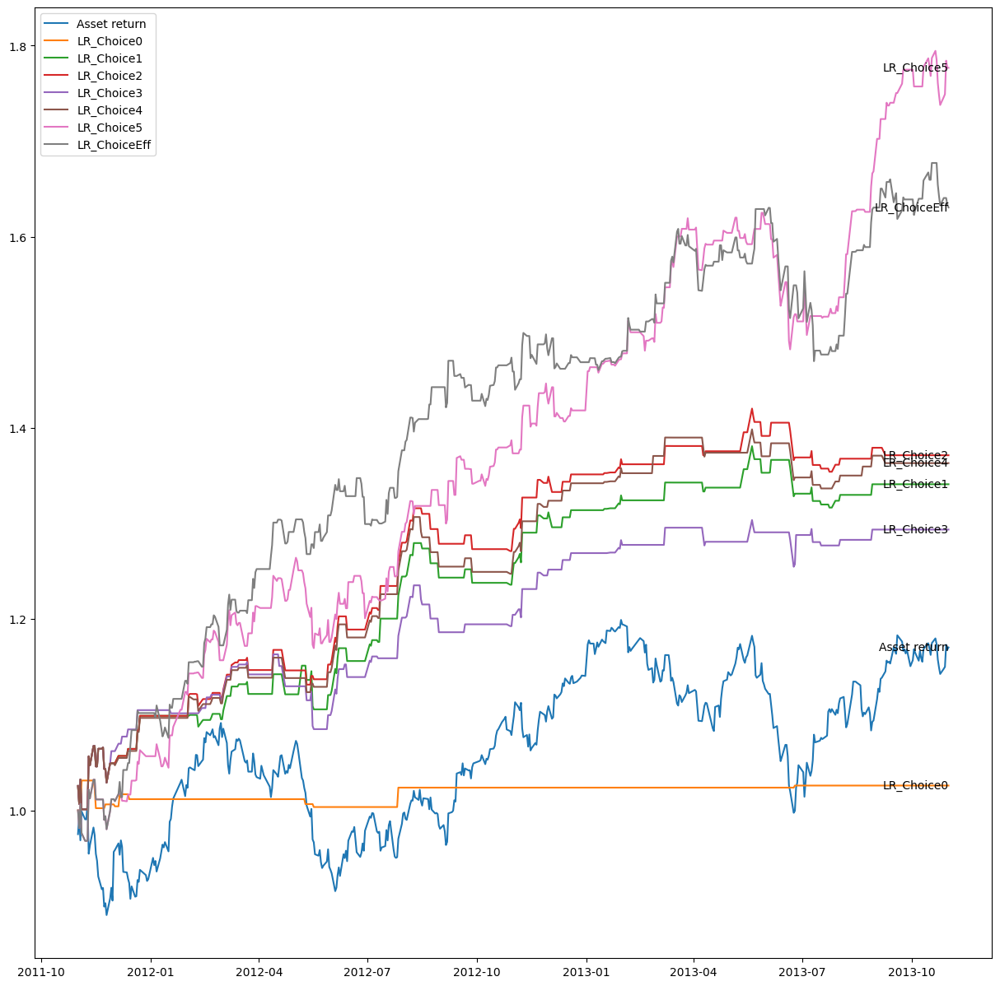

18


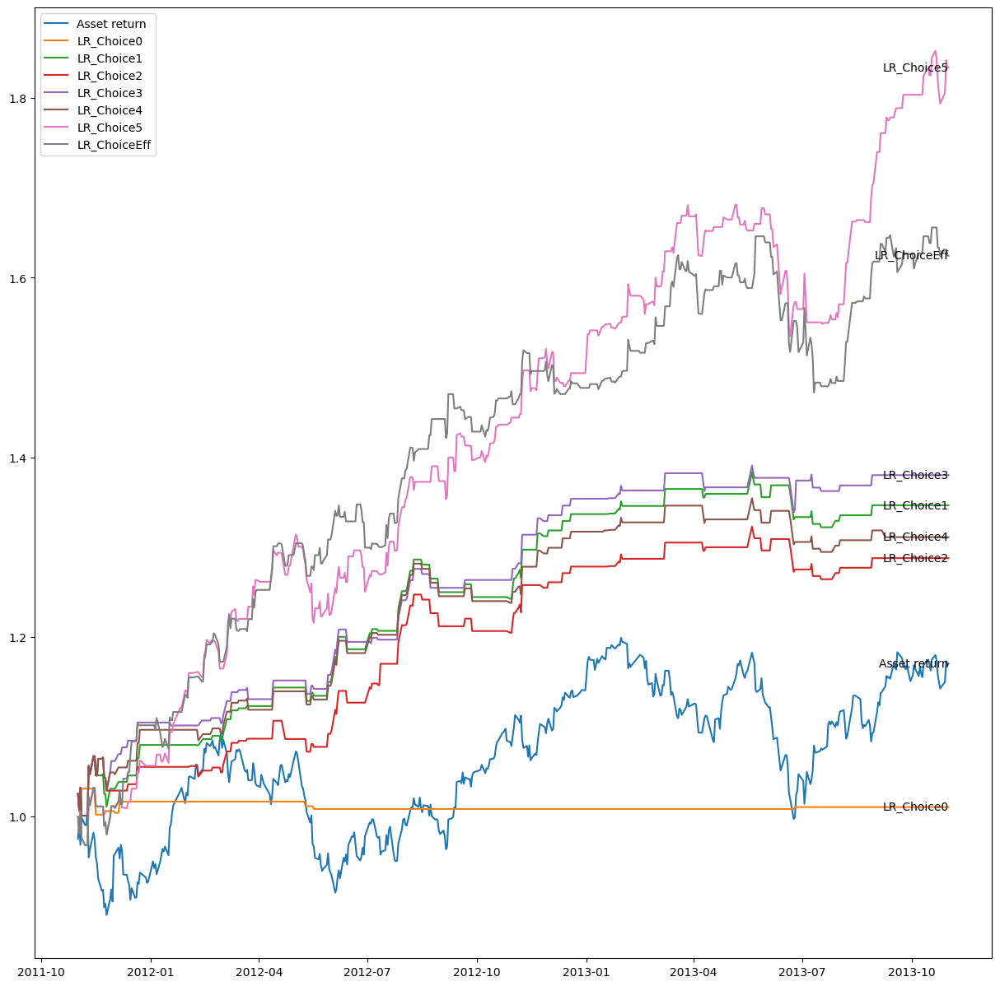

In [742]:
threshold_test_results = []
for i in range(19):
    print(i)
    threshold_test_result =\
        select_feature(
            model_choice,
            X_choices,
            data.iloc[:, 0],
            data.iloc[:, 2:],
            [start, train1, test],
            1e5,
            np.log(1+0.0001*i)
        )
    threshold_test_result\
        .set_index(pd\
                   .Index([item + f"_test{i}" 
                           for item in list(threshold_test_result.index)]),
                   inplace = True) 
    
    threshold_test_results += [threshold_test_result]

In [743]:
threshold_test_results = pd.concat(threshold_test_results)
threshold_test_results.sort_values(by='Sortino Ratio', ascending=False)

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
LR_Choice5_test18,35.373913,2.338977,4.045477,-8.714427,-14650.858925,112,1.834131,161,113,58.759124
LR_Choice4_test12,29.652301,2.261010,4.025569,-3.971707,-5510.097266,85,1.682168,106,70,60.227273
LR_Choice1_test13,26.703445,2.170751,3.977996,-5.219370,-7563.937883,162,1.606418,92,61,60.130719
LR_Choice5_test14,37.062293,2.324554,3.956996,-8.789838,-14989.277395,85,1.880231,187,135,58.074534
LR_Choice1_test12,26.754135,2.141644,3.899729,-3.971707,-5638.657580,85,1.607705,99,69,58.928571
...,...,...,...,...,...,...,...,...,...,...
LR_Choice0_test6,0.734344,0.010966,0.015789,-15.916236,-17098.928121,718,1.014761,102,95,51.776650
LR_Choice0_test12,-0.156964,0.003995,0.005705,-7.581363,-7673.764909,717,0.996859,28,22,56.000000
LR_Choice0_test11,0.851652,-0.031633,-0.045009,-9.268010,-9708.849151,717,1.017129,36,27,57.142857
LR_Choice0_test8,-0.081917,-0.096888,-0.135082,-15.521884,-16260.191868,718,0.998360,69,58,54.330709


In [744]:
feature_test_tuning

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return,8.173259,0.615390,0.896992,-16.825077,-20176.725302,274,1.170397,251,241,51.016260
LR_Choice0,5.542032,0.338663,0.505342,-15.088278,-17709.466997,483,1.114077,217,206,51.300236
LR_Choice1,28.093202,1.505208,2.319667,-8.327811,-13718.995744,119,1.641900,246,214,53.478261
LR_Choice2,28.776464,1.513120,2.313625,-7.618984,-11566.251528,119,1.659487,252,212,54.310345
LR_Choice3,34.110556,1.772779,2.790516,-11.950008,-23500.351346,120,1.800011,246,211,53.829322
LR_Choice4,34.606039,1.795114,2.792004,-8.247810,-15669.290033,119,1.813354,255,209,54.956897
LR_Choice5,35.148252,1.810654,2.909414,-11.301574,-18988.692022,95,1.828013,261,220,54.261954
LR_ChoiceEff,31.110447,1.591687,2.427332,-17.212254,-29331.061983,99,1.720271,266,221,54.620123


In [745]:
choice_i = [12, 13, 14, 18]

12


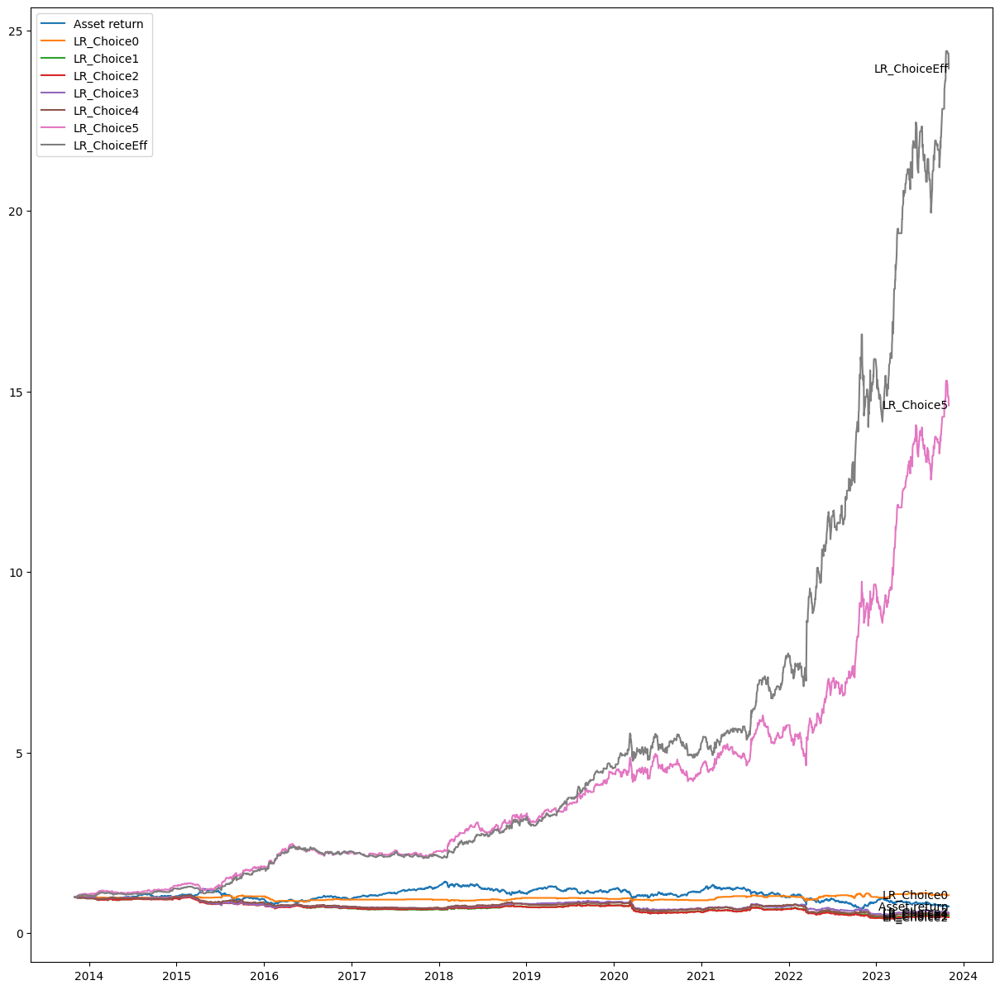

13


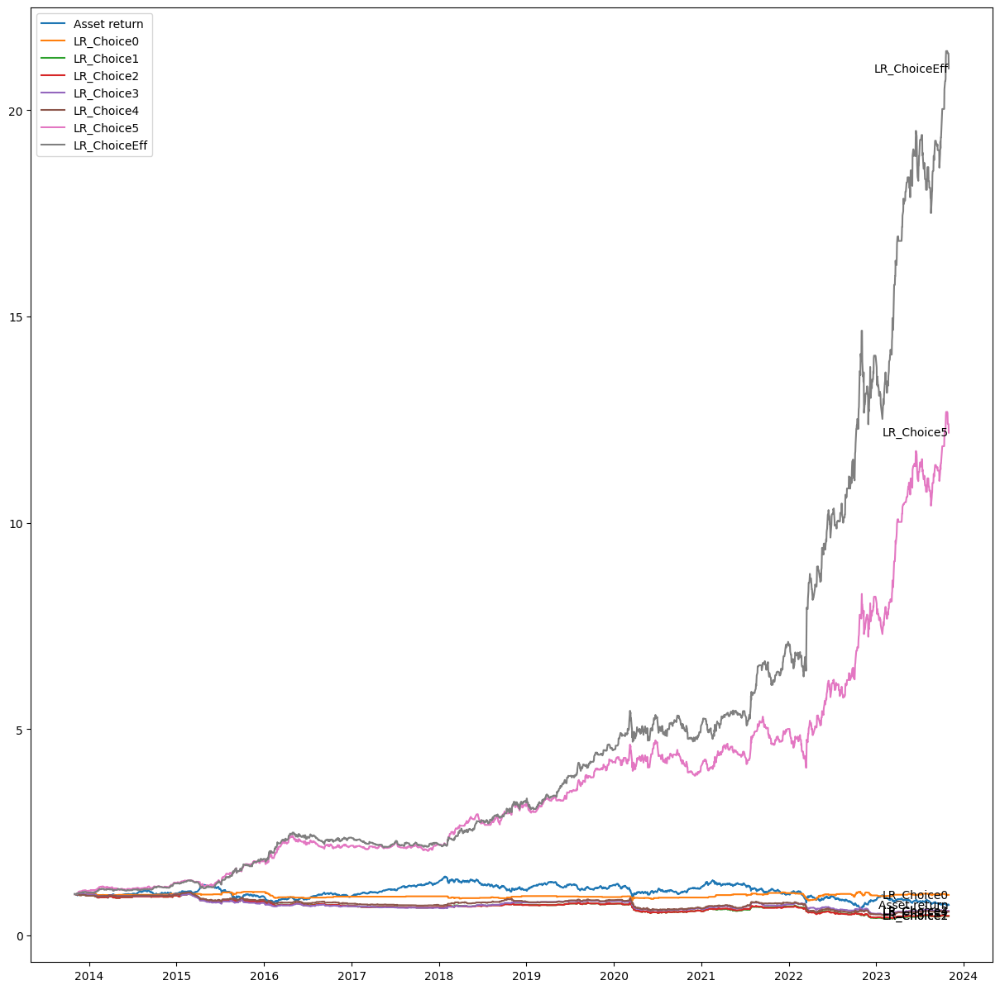

14


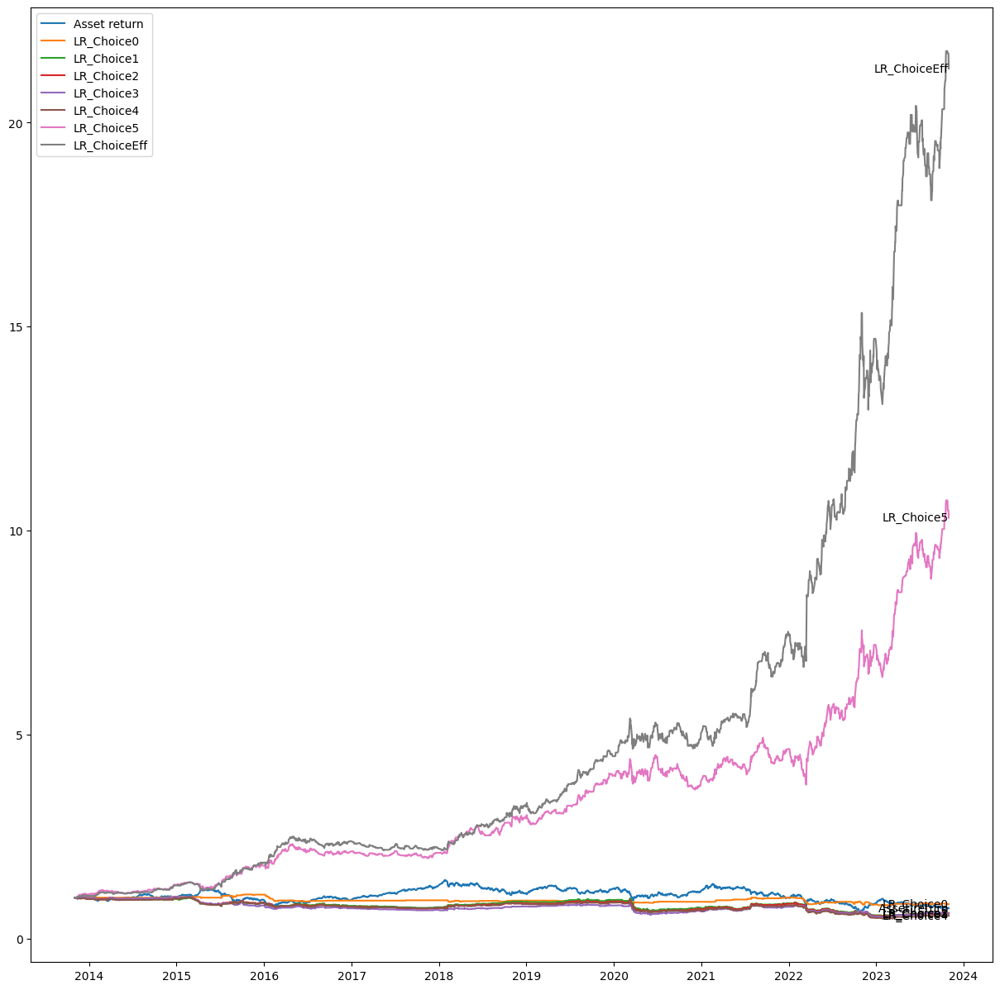

18


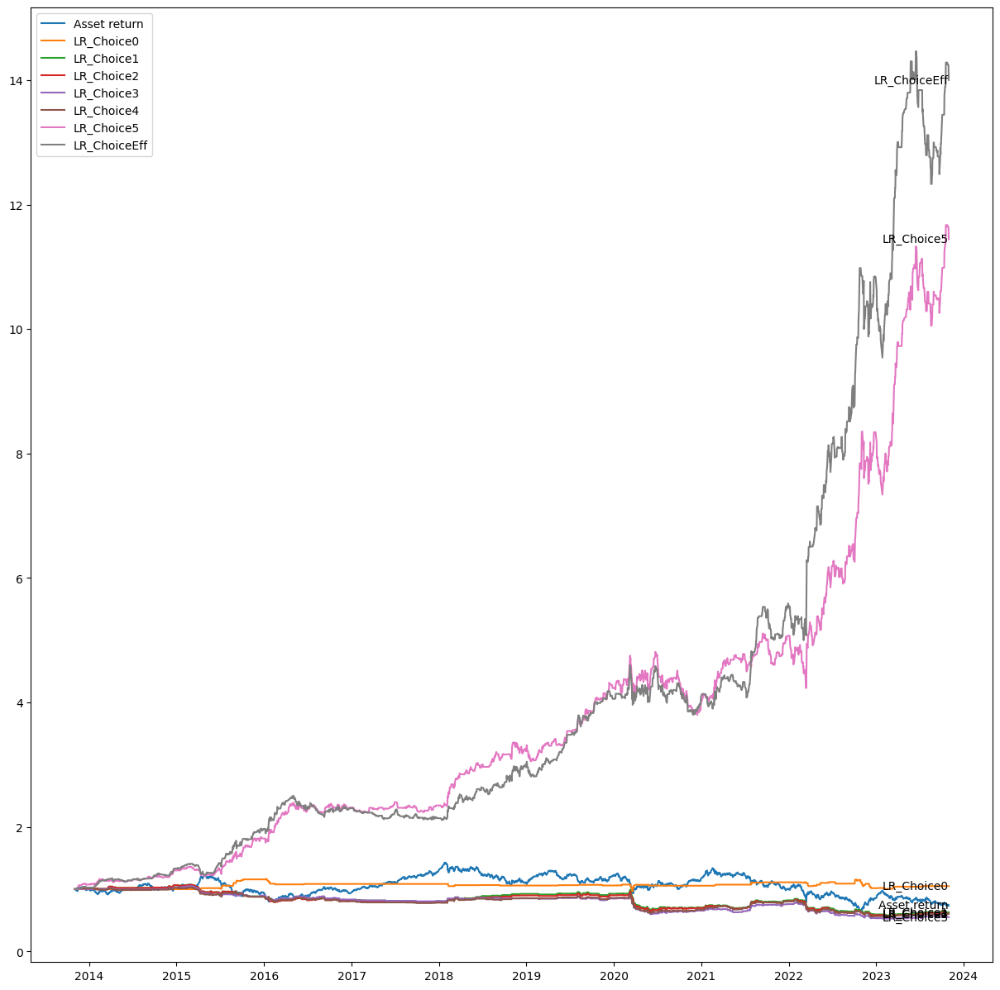

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
Asset return_test12,-2.999449,-0.050424,-0.071336,-55.700772,-79577.729073,2101,0.737404,1263,1198,51.320601
LR_Choice0_test12,0.489291,0.099800,0.145144,-17.252024,-18044.427278,2122,1.050035,153,134,53.310105
LR_Choice1_test12,-6.936487,-0.467584,-0.636620,-58.708251,-59147.514805,3164,0.487202,429,470,47.719689
LR_Choice2_test12,-7.857936,-0.545160,-0.738603,-60.518865,-60964.093575,3640,0.441044,424,474,47.216036
LR_Choice3_test12,-5.494077,-0.361383,-0.499594,-50.659545,-52194.521411,3164,0.568229,421,463,47.624434
LR_Choice4_test12,-6.253834,-0.399401,-0.547598,-56.881434,-59782.597515,3164,0.524153,448,480,48.275862
LR_Choice5_test12,30.748117,1.620721,2.613487,-22.937760,-150910.493006,647,14.610780,925,757,54.994055
LR_ChoiceEff_test12,37.366811,1.903932,3.175884,-15.478562,-256620.122031,687,23.943957,928,774,54.524089
Asset return_test13,-2.999449,-0.050424,-0.071336,-55.700772,-79577.729073,2101,0.737404,1263,1198,51.320601
LR_Choice0_test13,-0.175374,0.022855,0.031817,-20.009217,-21170.995208,2537,0.982596,124,106,53.913043


In [746]:
deploy_test_tuned_results = []

for i in choice_i:
    print(i)
    deploy_test_tuned_result =\
        select_feature(
            model_choice,
            X_choices,
            data.iloc[:, 0],
            data.iloc[:, 2:],
            [start, test, end],
            1e5,
            np.log(1+0.0001*i)
        )
    deploy_test_tuned_result\
        .set_index(pd\
                   .Index([item + f"_test{i}" 
                           for item in list(deploy_test_tuned_result.index)]),
                   inplace = True) 
    
    deploy_test_tuned_results += [deploy_test_tuned_result]
deploy_test_tuned_results = pd.concat(deploy_test_tuned_results)
deploy_test_tuned_results

In [747]:
deploy_test_tuned_results.sort_values(by='Sortino Ratio', ascending=False)

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
LR_ChoiceEff_test12,37.366811,1.903932,3.175884,-15.478562,-256620.122031,687,23.943957,928,774,54.524089
LR_ChoiceEff_test14,35.787494,1.877802,3.114082,-15.478562,-237368.976921,687,21.328570,886,722,55.099502
LR_ChoiceEff_test13,35.586695,1.846340,3.064711,-15.478562,-226886.462132,687,21.015174,904,752,54.589372
LR_ChoiceEff_test18,30.192734,1.711108,2.836315,-17.307568,-213677.846710,692,14.001721,766,625,55.068296
LR_Choice5_test12,30.748117,1.620721,2.613487,-22.937760,-150910.493006,647,14.610780,925,757,54.994055
LR_Choice5_test18,27.591211,1.579535,2.572874,-21.071499,-127319.625816,425,11.441883,758,607,55.531136
LR_Choice5_test13,28.397667,1.530562,2.466998,-23.355243,-132653.283405,653,12.186212,888,734,54.747226
LR_Choice5_test14,26.274524,1.452413,2.332087,-23.355243,-115018.492107,653,10.314187,855,712,54.562859
LR_Choice0_test18,0.481753,0.114529,0.170172,-17.293572,-20127.575177,2849,1.049247,43,37,53.750000
LR_Choice0_test12,0.489291,0.099800,0.145144,-17.252024,-18044.427278,2122,1.050035,153,134,53.310105


In [748]:
start, test, end

('2001-11-01', '2013-11-01', '2023-11-01')

In [749]:
deploy_test.sort_values(by='Sortino Ratio', ascending=False)

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
LR_Choice5,34.218804,1.573837,2.471939,-25.496720,-326352.031636,617,18.988201,1322,1139,53.718001
LR_ChoiceEff,32.650090,1.515716,2.413281,-20.628074,-367587.105242,702,16.881526,1296,1165,52.661520
Asset return,-2.999449,-0.050424,-0.071336,-55.700772,-79577.729073,2101,0.737404,1263,1198,51.320601
LR_Choice0,-3.229324,-0.062413,-0.087264,-45.035005,-52561.877946,2717,0.720110,1248,1213,50.711093
LR_Choice1,-3.369486,-0.069403,-0.099949,-48.211720,-51761.269568,3457,0.709745,1194,1267,48.516863
LR_Choice2,-4.211234,-0.113054,-0.162326,-47.374140,-50862.022743,3457,0.650271,1191,1270,48.394961
LR_Choice3,-4.641926,-0.135698,-0.192578,-55.996230,-66700.417257,3168,0.621610,1200,1261,48.760666
LR_Choice4,-4.757597,-0.139868,-0.198980,-49.919013,-56928.781168,2951,0.614109,1196,1265,48.598131


In [750]:
deploy_test_tuned_results.sort_values(by='Sortino Ratio', ascending=False)

,CAGR%,Sharpe Ratio,Sortino Ratio,Max Drawdown%,Max Drawdown$,Max Drawdown (Days),Multiples of Invested Capital,Win,Loss,Win%
LR_ChoiceEff_test12,37.366811,1.903932,3.175884,-15.478562,-256620.122031,687,23.943957,928,774,54.524089
LR_ChoiceEff_test14,35.787494,1.877802,3.114082,-15.478562,-237368.976921,687,21.328570,886,722,55.099502
LR_ChoiceEff_test13,35.586695,1.846340,3.064711,-15.478562,-226886.462132,687,21.015174,904,752,54.589372
LR_ChoiceEff_test18,30.192734,1.711108,2.836315,-17.307568,-213677.846710,692,14.001721,766,625,55.068296
LR_Choice5_test12,30.748117,1.620721,2.613487,-22.937760,-150910.493006,647,14.610780,925,757,54.994055
LR_Choice5_test18,27.591211,1.579535,2.572874,-21.071499,-127319.625816,425,11.441883,758,607,55.531136
LR_Choice5_test13,28.397667,1.530562,2.466998,-23.355243,-132653.283405,653,12.186212,888,734,54.747226
LR_Choice5_test14,26.274524,1.452413,2.332087,-23.355243,-115018.492107,653,10.314187,855,712,54.562859
LR_Choice0_test18,0.481753,0.114529,0.170172,-17.293572,-20127.575177,2849,1.049247,43,37,53.750000
LR_Choice0_test12,0.489291,0.099800,0.145144,-17.252024,-18044.427278,2122,1.050035,153,134,53.310105


#### from the above result, higher win rate can generally improve on return, and reduce unfavored drawdowns.
#### The best performance combination would be with threshold of np.log(1.0012), or predicted change of more than 0.12%.
#### threshold value of 0.12% to 0.14% would generally give good win rate.

## <a id = "p5">5. </a> <font color = "green"> Self-Critique </font>  [back to table of contents](#top)

> Goal: to build replicable trading strategy with excellent backtest result, while minimizing overfit

1. trading account started from `$100,000`
2. trading period from `November 2013` through `October 2023`.
3. training period from `November 2001` through `October 2013`.

#### Feature Engineering
1. endogenous lagged data to capture market view on `HSI`
2. typical assets from different industry to reflect market condition
3. Major currency exchange rates to reflect how US is favored over other markets. To note, HKD has a fixed exchange rate with USD.
4. Major indices (VIX, JP225, T-bill, SPX, Shanghai Composite Index) to further capture macroeconomic conditions
5. Some Technical indicators may be added as potential choices

#### Model training and selection¶
1. model needs to be ready before targeted trading period from `2013 to 2023`
2. Training data is selected from `2001 to 2011`
3. Testing data is selected from `2011 to 2013`
4. Preliminary tuning on `Lasso` and `Ridge` to determine on Alpha values
4. Based on testing result `LinearRegression (LR)` is selected 
5. The strategy is deployed from 2013 to 2023 for continuous `10` years

> Survivorship Bias

1. The feature choice could be an example of `survivorship bias`. I have chosen FOUR companies that have existed for 22 years. But by the time of trade starts, correctly select on such X features shall be a myth.
2. One way to reduce the bias is to update such features with a "Rolling-Window". So as to related the target indices back to the proper set of features.
3. The `Lookahead Bias` and `Market Regime Shift` effects might not be related to my ML strategy.

> Future improvement

* Rolling Window Method: could be a way of updating on trading models.
* Feature Fine tuning: could be a way of improving on model performance.